In [1]:
import pandas
import numpy
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy import signal

# Funciones:

A continuación, se construyen funciones para ajustar los modelos SARIMAX con distintas configuraciones.

In [2]:
def mysarimax(Matriz,Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12)):
    mod = sm.tsa.statespace.SARIMAX(Y,
                                    order=order,
                                    trend=trend,
                                    exog=numpy.asarray(Matriz),
                                    seasonal_order=seasonal_order)
    res = mod.fit(disp=False)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [3]:
def mysarima(Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12)):
    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(Y,order=order,trend=trend,seasonal_order=seasonal_order)
    res = mod.fit(disp=False)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [4]:
def mysarimax2(Matriz,Y,order=(0,0,0),trend='c',seasonal_order=(0,0,0,12),restriccion={}):
    mod = sm.tsa.statespace.SARIMAX(Y,
                                    order=order,
                                    trend=trend,
                                    exog=numpy.asarray(Matriz),
                                    seasonal_order=seasonal_order,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
    res = mod.fit_constrained(restriccion)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=40, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:1000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:1000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:300].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:300].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

In [5]:
def mysarima2(Y,order=(0,0,0),trend='c',restriccion={},seasonal_order=(0,0,0,12)):
    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(Y,order=order,trend=trend,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False,
                                    seasonal_order=seasonal_order)
    res = mod.fit_constrained(restriccion)
    res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    DS=pandas.DataFrame()
    DS['freq']=f
    DS['pow']=Pxx_den
    DS['delay']=1/DS['freq']
    DS=DS.sort_values(by=['pow'],ascending=False).iloc[0:10]
    print(DS)
    print(res.summary())
    # Graph data
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(res.resid, lags=80, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(res.resid, lags=80, ax=axes[1])
    # Plot data points
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:2000].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:2000].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.loc[0:200].plot(ax=ax, style='.', label='Observada')
    res.fittedvalues[0:200].plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    fig, ax = plt.subplots(figsize=(9,4))
    ax.set(title='Temperaturas', xlabel='idx', ylabel='t°')
    Y.plot(ax=ax, style='.', label='Observada')
    res.fittedvalues.plot(ax=ax, style='-', label='Predicha')
    legend = ax.legend(loc='upper right')
    DS=pandas.DataFrame()
    DS['ACF']=abs(sm.tsa.stattools.acf(res.resid,nlags=50,fft=False))
    DS['PACF']=abs(sm.tsa.stattools.pacf(res.resid,nlags=50))
    DS=DS.sort_values(by=['ACF'],ascending=False).iloc[0:10]
    print(DS)
    DS=DS.sort_values(by=['PACF'],ascending=False).iloc[0:10]
    print(DS)
    return(res)

A continuación, se construyen funciones para validar con datos fuera del periodo de ajuste los modelos SARIMAX con distintas configuraciones.

In [6]:
def predecir_1(Resultados,Exog,Endog,limite):
    updated_res = Resultados.extend(exog=Exog,endog=Endog)
    pred = updated_res.get_prediction(start=0, dynamic=False)
    pred_ci = pred.conf_int()
    ax = Matriz_Resultados['ts'].plot(label='observed', figsize=(15, 10))
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)
    ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Dato')
    ax.set_ylabel('Temperatura °C')
    ax.set_ylim([-5,30])
    ax.set_xlim([limite-100,limite+150])
    plt.legend()
    plt.show()
    updated_res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(updated_res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    print(updated_res.summary())
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=40, ax=axes[1])
    return(pred,updated_res)

In [7]:
def predecir_2(Resultados,Endog,limite):
    updated_res = Resultados.extend(endog=Endog)
    pred = updated_res.get_prediction(start=0, dynamic=False)
    pred_ci = pred.conf_int()
    ax = Matriz_Resultados['ts'].plot(label='observed', figsize=(15, 10))
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)
    ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Dato')
    ax.set_ylabel('Temperatura °C')
    ax.set_ylim([-5,30])
    ax.set_xlim([limite-100,limite+150])
    plt.legend()
    plt.show()
    updated_res.plot_diagnostics(figsize=(18, 8))
    plt.show()
    f, Pxx_den = signal.periodogram(updated_res.resid)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('Power spectral density')
    plt.show()
    print(updated_res.summary())
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=1000, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=1000, ax=axes[1])
    fig, axes = plt.subplots(1, 2, figsize=(15,4))
    fig = sm.graphics.tsa.plot_acf(updated_res.resid, lags=40, ax=axes[0])
    fig = sm.graphics.tsa.plot_pacf(updated_res.resid, lags=40, ax=axes[1])
    return(pred,updated_res)

In [36]:
def predecir_3(Resultados,Exog,Endog,limite):
    updated_res = Resultados.extend(exog=Exog,endog=Endog)
    Error=pandas.DataFrame()
    Error['temp']=Endog.loc[:]
    Error['Resid']=pandas.DataFrame(updated_res.resid)
    Error['Más de 1 °C']=abs(Error['Resid'])>1
    Error['Más de 2 °C']=abs(Error['Resid'])>2
    Error['Más de 3 °C']=abs(Error['Resid'])>3
    print(Error)
    Error_medio=abs(Error['Resid']).mean()
    print('Promedio Valor Absoluto Error: '+str(Error_medio))
    Error['Resid'].plot()
    Porcentajemayor=pandas.DataFrame()
    Porcentajemayor.loc[0,'Más de 1 °C']=Error['Más de 1 °C'].mean()
    Porcentajemayor.loc[0,'Más de 2 °C']=Error['Más de 2 °C'].mean()
    Porcentajemayor.loc[0,'Más de 3 °C']=Error['Más de 3 °C'].mean()
    print('Porcentaje Error Mayor a 1, 2 y 3 °C: ')
    print(str(Porcentajemayor*100))
    plt.show()

In [37]:
def predecir_4(Resultados,Endog,limite):
    updated_res = Resultados.extend(endog=Endog)
    Error=pandas.DataFrame()
    Error['temp']=Endog.loc[:]
    Error['Resid']=pandas.DataFrame(updated_res.resid)
    Error['Más de 1 °C']=abs(Error['Resid'])>1
    Error['Más de 2 °C']=abs(Error['Resid'])>2
    Error['Más de 3 °C']=abs(Error['Resid'])>3
    print(Error)
    Error_medio=abs(Error['Resid']).mean()
    print('Promedio Valor Absoluto Error: '+str(Error_medio))
    Error['Resid'].plot()
    Porcentajemayor=pandas.DataFrame()
    Porcentajemayor.loc[0,'Más de 1 °C']=Error['Más de 1 °C'].mean()
    Porcentajemayor.loc[0,'Más de 2 °C']=Error['Más de 2 °C'].mean()
    Porcentajemayor.loc[0,'Más de 3 °C']=Error['Más de 3 °C'].mean()
    print('Porcentaje Error Mayor a 1, 2 y 3 °C: ')
    print(str(Porcentajemayor*100))
    plt.show()

# Ejecución:

En primera instancia se lee la base de datos. 

In [10]:
Matriz=pandas.read_csv('Chillan.csv',sep='|')
Matriz

,Unnamed: 0,momento,rrInst,rr6Horas,rr24Horas,hr,p0,qfe1,qff,qnh,...,td,tMin12Horas,tMax12Horas,Anno,Mes,Dia,Hora,Minuto,Hora_Min_t,Hora_Max_t
0,0,2018-01-01 00:00:00,0.0,0.0,0.0,48.3,969.6,969.8,1015.9,1016.7,...,7.7,11.1,25.7,2018,1,1,0,0,12,20
1,1,2018-01-01 00:01:00,0.0,0.0,0.0,47.4,969.6,969.8,1015.9,1016.7,...,7.6,11.1,25.7,2018,1,1,0,1,12,20
2,2,2018-01-01 00:02:00,0.0,0.0,0.0,48.6,969.6,969.7,1015.8,1016.6,...,7.8,11.1,25.7,2018,1,1,0,2,12,20
3,3,2018-01-01 00:03:00,0.0,0.0,0.0,48.7,969.6,969.8,1015.9,1016.7,...,7.7,11.1,25.7,2018,1,1,0,3,12,20
4,4,2018-01-01 00:04:00,0.0,0.0,0.0,49.5,969.6,969.8,1015.9,1016.7,...,7.9,11.1,25.7,2018,1,1,0,4,12,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1023618,1051754,2019-12-31 23:56:00,0.0,0.0,0.0,44.1,964.7,965.0,1009.9,1011.7,...,11.3,6.8,23.2,2019,12,31,23,56,9,0
1023619,1051755,2019-12-31 23:57:00,0.0,0.0,0.0,43.6,964.7,964.9,1009.9,1011.6,...,11.4,6.8,23.2,2019,12,31,23,57,9,0
1023620,1051756,2019-12-31 23:58:00,0.0,0.0,0.0,44.2,964.7,964.8,1009.8,1011.5,...,11.4,6.8,23.2,2019,12,31,23,58,9,0
1023621,1051757,2019-12-31 23:59:00,0.0,0.0,0.0,44.2,964.7,965.0,1010.0,1011.7,...,11.3,6.8,23.2,2019,12,31,23,59,9,0


Se define una matriz de resultados: 

In [11]:
Matriz_Resultados=Matriz.loc[:,'ts']

Se define una matriz con información general del proceso:

In [12]:
Matriz_Informacion_general=Matriz.loc[:,['rr6Horas','rr24Horas','radiacionGlobalAcumulada24Horas',
                                  'tMin12Horas','tMax12Horas','Mes','Dia','Hora','Minuto','Hora_Min_t','Hora_Max_t']]

Se definen estacionalidades diarias y anuales. 

In [13]:
Matriz_Informacion_general['Sen_hora']=numpy.sin(Matriz['Hora']*2*numpy.pi/24 + Matriz['Minuto']/60*2*numpy.pi/24)
Matriz_Informacion_general['Cos_hora']=numpy.cos(Matriz['Hora']*2*numpy.pi/24 + Matriz['Minuto']/60*2*numpy.pi/24)
Matriz_Informacion_general['Sen_Mes']=numpy.sin((Matriz['Mes']-1)*2*numpy.pi/12)
Matriz_Informacion_general['Cos_Mes']=numpy.cos((Matriz['Mes']-1)*2*numpy.pi/12)

Se define el intervalo de tiempo que nos interesa, correspondiente al tiempo con el que haremos predicciones.  

In [14]:
Intervalo=40#cada cuantos minutos consideramos valor

In [15]:
Matriz_Informacion_general=Matriz_Informacion_general.loc[range(0,len(Matriz_Resultados),Intervalo),:].reset_index().drop('index',axis=1)
Matriz_Resultados=Matriz_Resultados.loc[range(0,len(Matriz_Resultados),Intervalo)].reset_index().drop('index',axis=1)

Se define una matriz, la denominamos IG, en esta se convierten variables de la matriz de información general en valores numéricos. 

In [16]:
IG=pandas.DataFrame()
IG['rr6Horas']=1*(Matriz_Informacion_general['rr6Horas'])
IG['rr24Horas']=1*(Matriz_Informacion_general['rr24Horas'])
IG['radiacionGlobalAcumulada24Horas']=1*(Matriz_Informacion_general['radiacionGlobalAcumulada24Horas'])
IG['tMin12Horas']=1*(Matriz_Informacion_general['tMin12Horas'])
IG['tMax12Horas']=1*(Matriz_Informacion_general['tMax12Horas'])
IG['Hora_Min_t']=1*(Matriz_Informacion_general['Hora_Min_t'])
IG['Hora_Max_t']=1*(Matriz_Informacion_general['Hora_Max_t'])
IG['Sen_hora']=1*(Matriz_Informacion_general['Sen_hora'])
IG['Cos_hora']=1*(Matriz_Informacion_general['Cos_hora'])
IG['Sen_Mes']=1*(Matriz_Informacion_general['Sen_Mes'])
IG['Cos_Mes']=1*(Matriz_Informacion_general['Cos_Mes'])
IG['avg_Day']=1*((Matriz_Informacion_general['tMin12Horas']+Matriz_Informacion_general['tMax12Horas'])/2)

Se estandariza y centra en cero las distintas variables de IG. 

In [17]:
for col in IG.columns:
    IG[col]=(IG[col]-IG[col].mean())/IG[col].std()

A continuación, se define el límite entre los segmentos de ajuste y de validación de la base de datos para los modelos:

In [18]:
limite=round(len(IG)*0.7)
limite

17914

In [19]:
IG_Ajuste=IG.iloc[0:limite]
IG_Ajuste

,rr6Horas,rr24Horas,radiacionGlobalAcumulada24Horas,tMin12Horas,tMax12Horas,Hora_Min_t,Hora_Max_t,Sen_hora,Cos_hora,Sen_Mes,Cos_Mes,avg_Day
0,-0.169862,-0.235490,1.476655,0.817148,1.319298,0.228498,1.078070,-0.000133,1.413279,-0.017517,1.451363,1.172798
1,-0.169862,-0.235490,1.476655,0.817148,1.319298,0.228498,1.078070,0.245527,1.391802,-0.017517,1.451363,1.172798
2,-0.169862,-0.235490,1.476655,0.817148,1.319298,0.228498,1.078070,0.483722,1.328024,-0.017517,1.451363,1.172798
3,-0.169862,-0.235490,1.476655,0.817148,1.319298,0.228498,1.078070,0.707216,1.223882,-0.017517,1.451363,1.172798
4,-0.169862,-0.235490,1.476655,0.817148,1.319298,0.228498,1.078070,0.909217,1.082542,-0.017517,1.451363,1.172798
...,...,...,...,...,...,...,...,...,...,...,...,...
17909,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,1.347219,0.430582,1.205172,-0.674994,-0.300043
17910,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,1.401642,0.190239,1.205172,-0.674994,-0.300043
17911,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,1.413473,-0.055897,1.205172,-0.674994,-0.300043
17912,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,1.382353,-0.300347,1.205172,-0.674994,-0.300043


In [20]:
IG_Test=IG.iloc[limite:]
IG_Test

,rr6Horas,rr24Horas,radiacionGlobalAcumulada24Horas,tMin12Horas,tMax12Horas,Hora_Min_t,Hora_Max_t,Sen_hora,Cos_hora,Sen_Mes,Cos_Mes,avg_Day
17914,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,1.196316,-0.754755,1.205172,-0.674994,-0.300043
17915,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,1.047051,-0.950905,1.205172,-0.674994,-0.300043
17916,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,0.865969,-1.118176,1.205172,-0.674994,-0.300043
17917,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,0.658571,-1.251482,1.205172,-0.674994,-0.300043
17918,-0.169862,-0.218601,-1.124413,-0.045474,-0.453145,0.470691,0.965565,0.431158,-1.346776,1.205172,-0.674994,-0.300043
...,...,...,...,...,...,...,...,...,...,...,...,...
25586,-0.169862,-0.235490,1.660699,-0.045474,0.964809,-0.498080,-1.172017,-1.009166,0.990462,-0.723437,1.261444,0.576648
25587,-0.169862,-0.235490,1.660699,-0.045474,0.964809,-0.498080,-1.172017,-0.821651,1.150499,-0.723437,1.261444,0.576648
25588,-0.169862,-0.235490,1.660699,-0.045474,0.964809,-0.498080,-1.172017,-0.609175,1.275566,-0.723437,1.261444,0.576648
25589,-0.169862,-0.235490,1.660699,-0.045474,0.964809,-0.498080,-1.172017,-0.378194,1.361864,-0.723437,1.261444,0.576648


In [21]:
Y_Ajuste=Matriz_Resultados['ts'].iloc[0:limite]
Y_Ajuste

0        18.8
1        16.0
2        15.0
3        13.0
4        11.9
         ... 
17909    10.6
17910    10.0
17911    10.7
17912    11.4
17913    11.0
Name: ts, Length: 17914, dtype: float64

In [22]:
Y_Test=Matriz_Resultados['ts'].iloc[limite:]
Y_Test

17914    10.6
17915     9.6
17916     9.3
17917     9.4
17918     9.8
         ... 
25586    31.9
25587    31.8
25588    31.8
25589    30.9
25590    26.4
Name: ts, Length: 7677, dtype: float64

# A partir de este punto se construyen y validan modelos: 

Se comienza con el modelo de la forma t°(t)=constante 

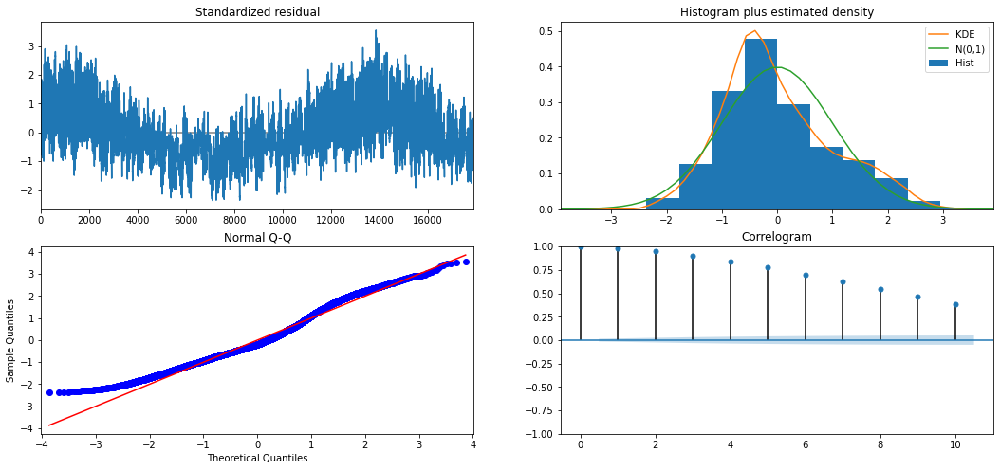

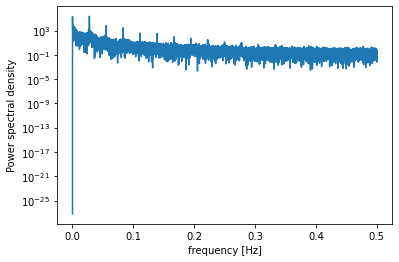

         freq            pow         delay
497  0.027744  228418.466063     36.044266
1    0.000056  184313.345797  17914.000000
2    0.000112   75913.068698   8957.000000
496  0.027688   45523.184279     36.116935
3    0.000167   43090.911350   5971.333333
499  0.027855   34105.294553     35.899800
498  0.027799   34034.275775     35.971888
4    0.000223   11137.927799   4478.500000
500  0.027911   10960.268268     35.828000
12   0.000670    8098.078531   1492.833333
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:                        SARIMAX   Log Likelihood              -60538.649
Date:                Sun, 15 Nov 2020   AIC                         121081.298
Time:                        20:04:48   BIC                         121096.885
Sample:                             0   HQIC                        121086.425
                              - 17914                

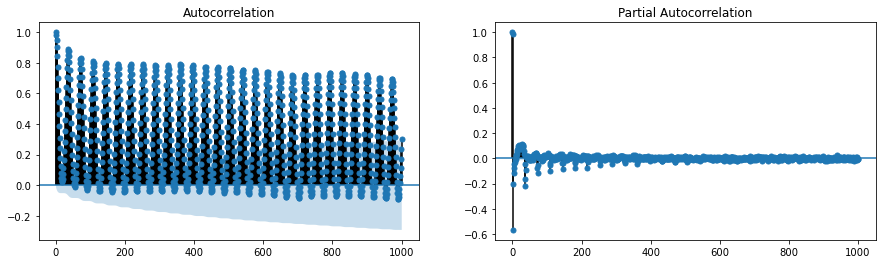

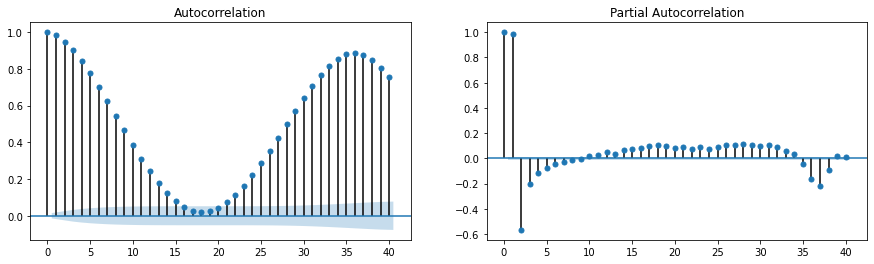

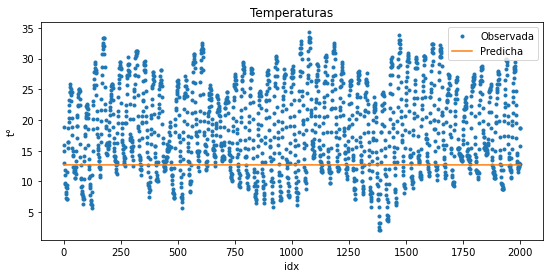

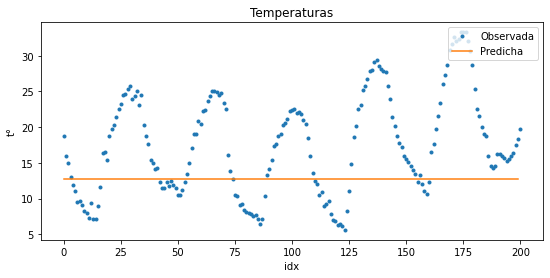

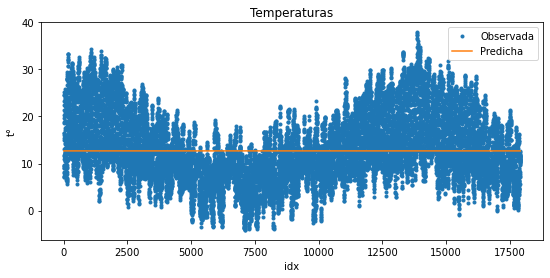

In [21]:
mysarima(Y=Y_Ajuste)

## En la siguiente serie de modelos se incorporan predictores sinusoides con periodos de un día y un año. 

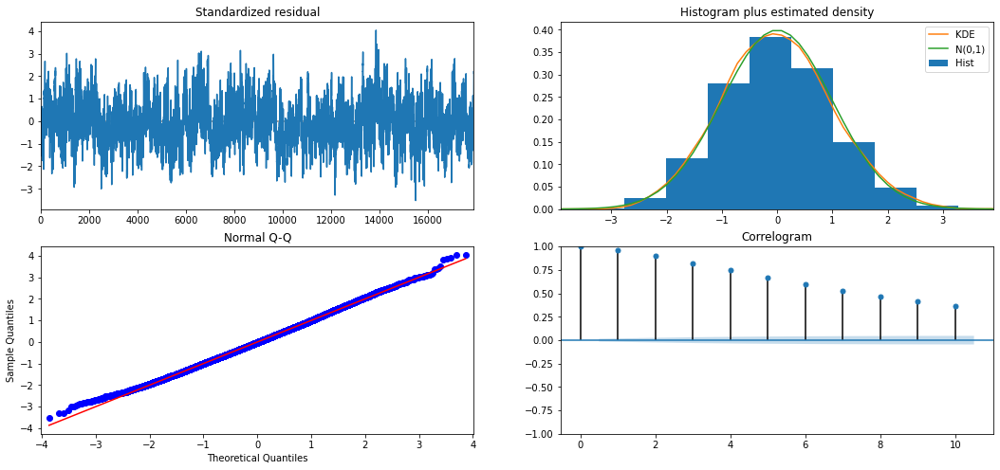

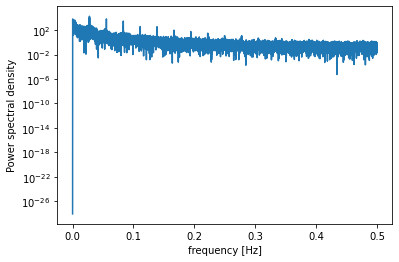

         freq           pow        delay
496  0.027688  18066.316687    36.116935
499  0.027855  11135.533153    35.899800
995  0.055543   6557.748753    18.004020
7    0.000391   6048.695204  2559.142857
3    0.000167   5666.040121  5971.333333
63   0.003517   4319.387441   284.349206
500  0.027911   4155.577077    35.828000
19   0.001061   4036.275936   942.842105
12   0.000670   3941.952141  1492.833333
43   0.002400   3741.913270   416.604651
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:                        SARIMAX   Log Likelihood              -48982.462
Date:                Sun, 15 Nov 2020   AIC                          97976.924
Time:                        20:05:05   BIC                          98023.684
Sample:                             0   HQIC                         97992.304
                              - 17914                                      

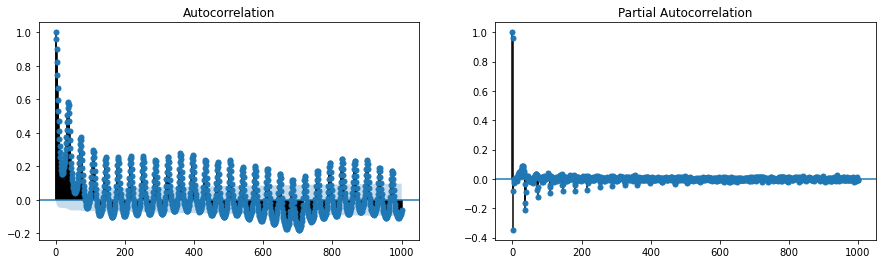

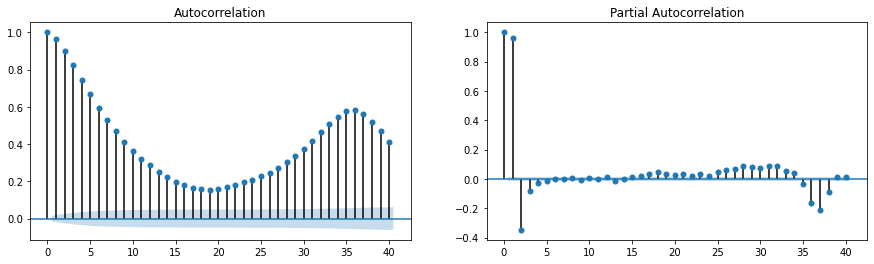

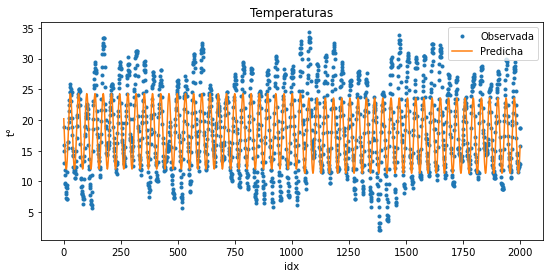

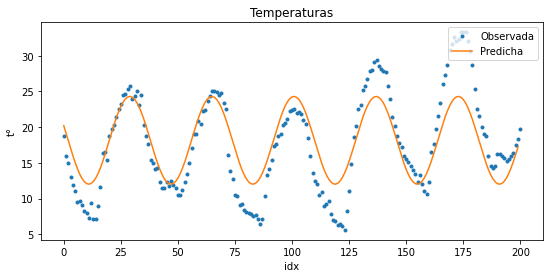

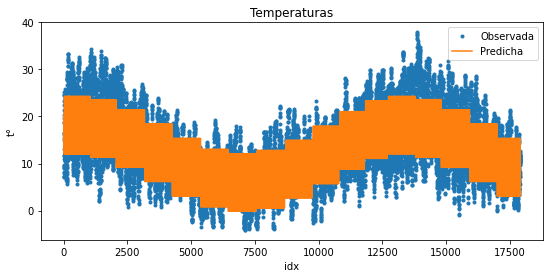

In [22]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

Por los altísimos valores de la función de densidad espectral, se observa el comportamiento del modelo al agregar una componente diferencial en el último instante de tiempo y en el último día de retraso.

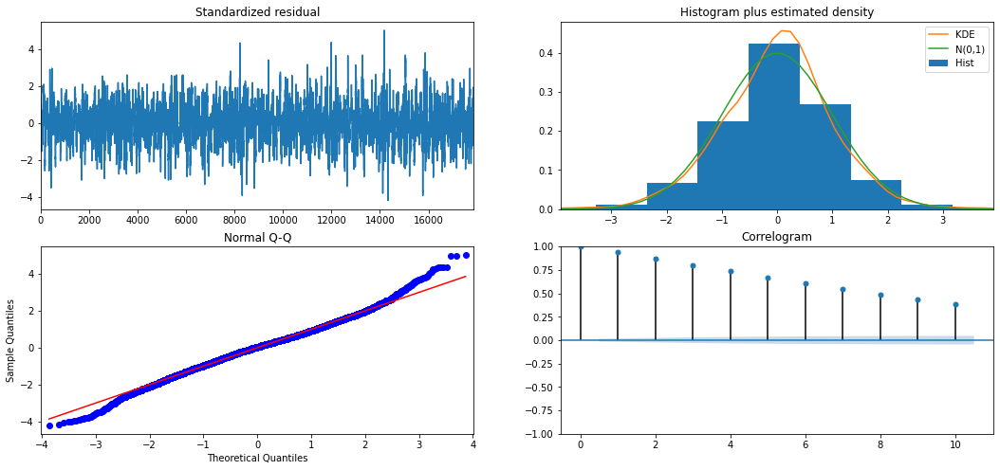

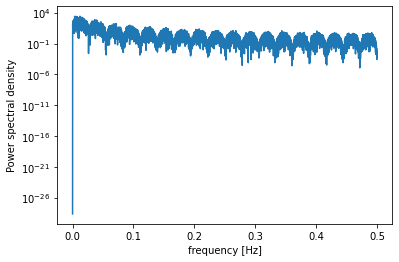

         freq          pow       delay
217  0.012113  2696.047654   82.552995
89   0.004968  2574.875982  201.280899
63   0.003517  2539.911976  284.349206
138  0.007703  2445.647209  129.811594
139  0.007759  2041.668189  128.877698
277  0.015463  1838.668811   64.671480
78   0.004354  1723.608106  229.666667
243  0.013565  1618.759696   73.720165
95   0.005303  1608.415050  188.568421
140  0.007815  1603.900909  127.957143
                                SARIMAX Results                                 
Dep. Variable:                       ts   No. Observations:                17914
Model:             SARIMAX(0, 1, 0, 36)   Log Likelihood              -46971.288
Date:                  Sun, 15 Nov 2020   AIC                          93954.576
Time:                          20:05:34   BIC                          94001.324
Sample:                               0   HQIC                         93969.954
                                - 17914                                         
Cova

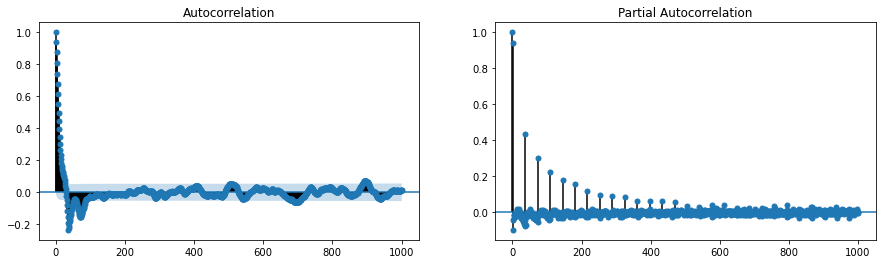

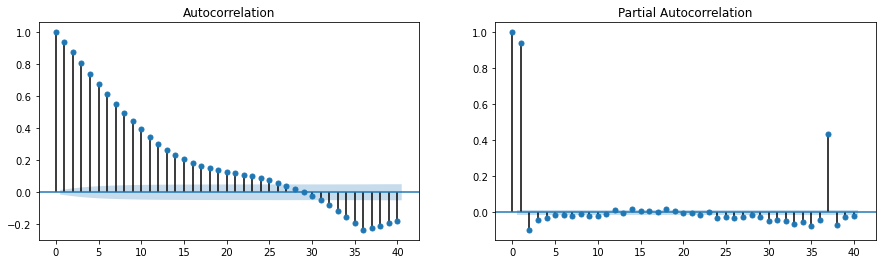

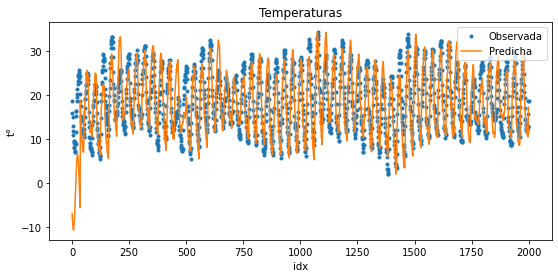

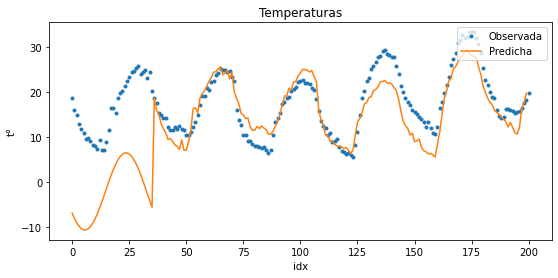

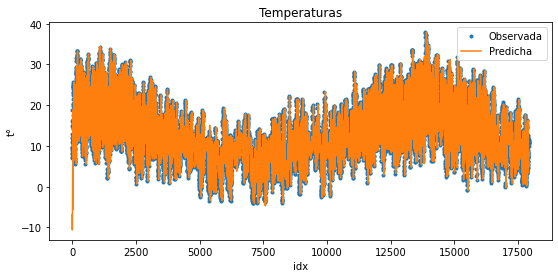

In [23]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,1,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

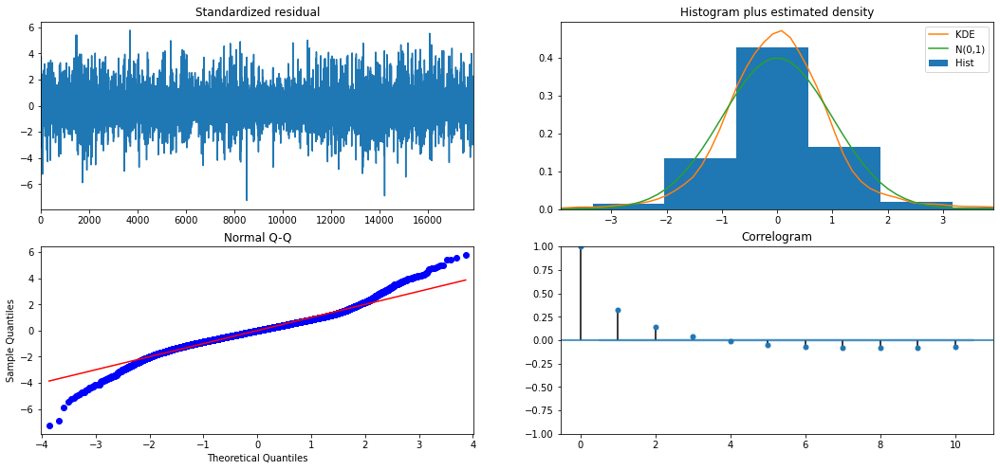

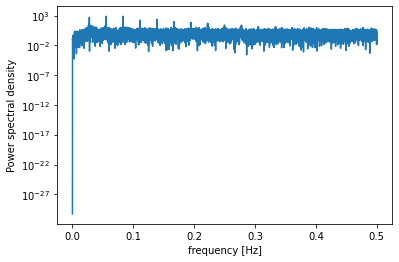

          freq         pow      delay
995   0.055543  779.463871  18.004020
1492  0.083287  771.435401  12.006702
496   0.027688  528.148884  36.116935
499   0.027855  342.159658  35.899800
2485  0.138718  235.448871   7.208853
994   0.055487  214.994878  18.022133
2488  0.138886  187.348556   7.200161
1493  0.083343  180.063613  11.998660
1989  0.111030  176.447769   9.006536
1988  0.110975  158.978592   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -26007.976
Date:                Sun, 15 Nov 2020   AIC                          52027.952
Time:                        20:05:49   BIC                          52074.711
Sample:                             0   HQIC                         52043.332
                              - 17914                                         
Covariance Type:             

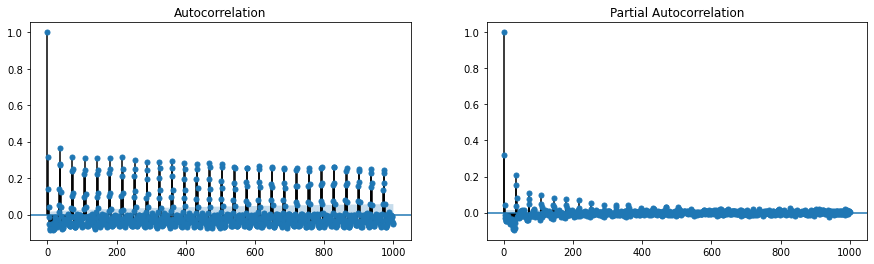

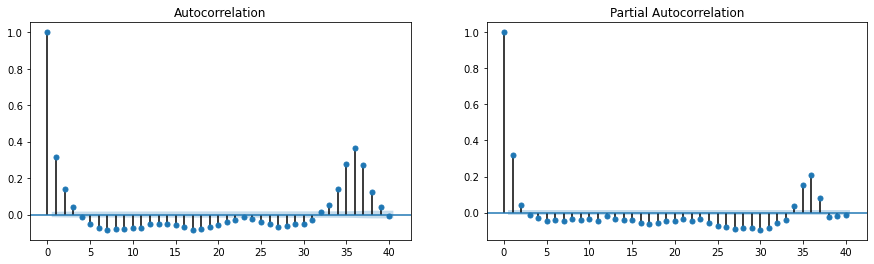

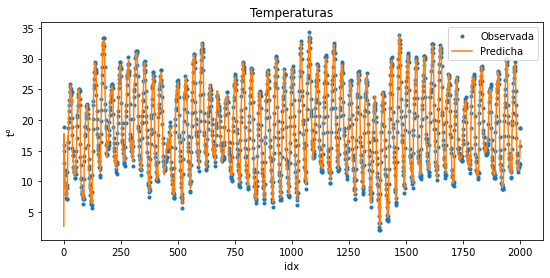

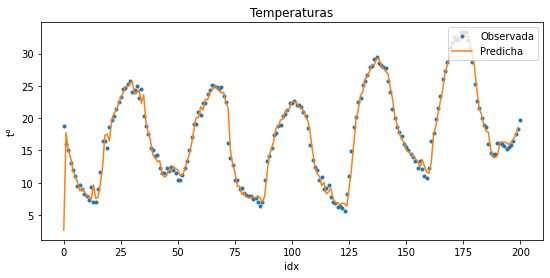

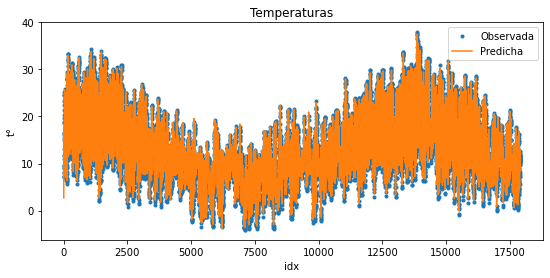

In [24]:
mysarimax(Y=Y_Ajuste,
         order=(0,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

Se corrobora que la componente diferencial del último instante genera mayores mejoras en el AIC del modelo.  
A continuación, se busca mejorar el modelo agregando una componente ar o ma 1, por los altos valores de acf y pacf en un retraso de un intervalo.

In [25]:
#AR o MA 1

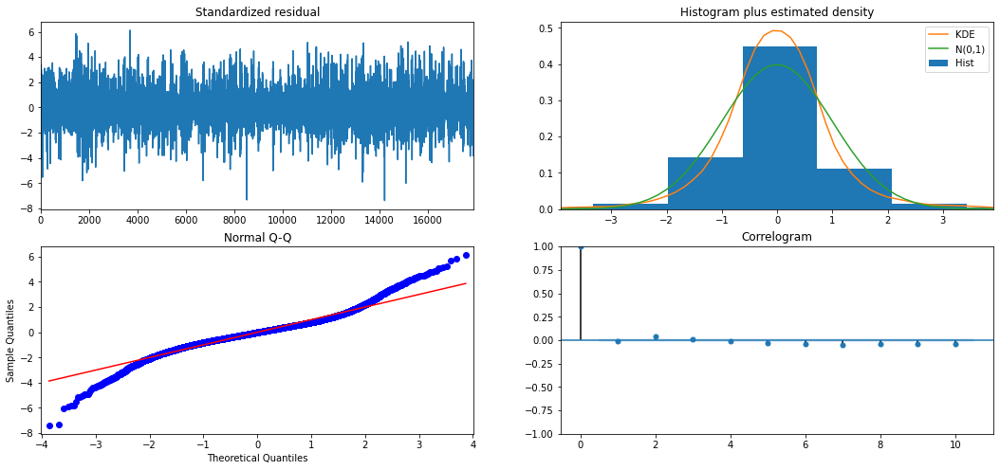

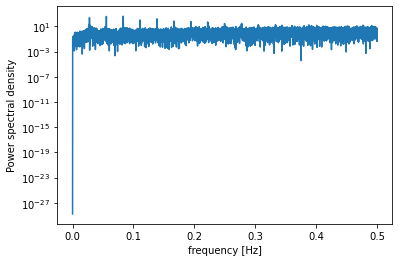

          freq         pow      delay
1492  0.083287  418.395264  12.006702
995   0.055543  385.547365  18.004020
496   0.027688  246.001805  36.116935
2485  0.138718  163.862228   7.208853
499   0.027855  160.396456  35.899800
2488  0.138886  129.224374   7.200161
1989  0.111030  108.684051   9.006536
994   0.055487  107.969123  18.022133
1493  0.083343   98.446456  11.998660
1988  0.110975   96.412765   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -25020.693
Date:                Sun, 15 Nov 2020   AIC                          50055.387
Time:                        20:06:11   BIC                          50109.940
Sample:                             0   HQIC                         50073.330
                              - 17914                                         
Covariance Type:             

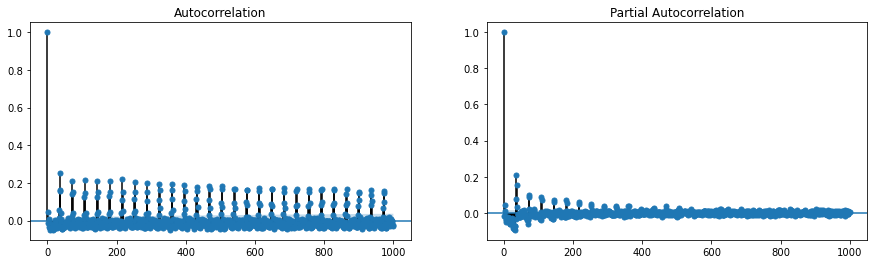

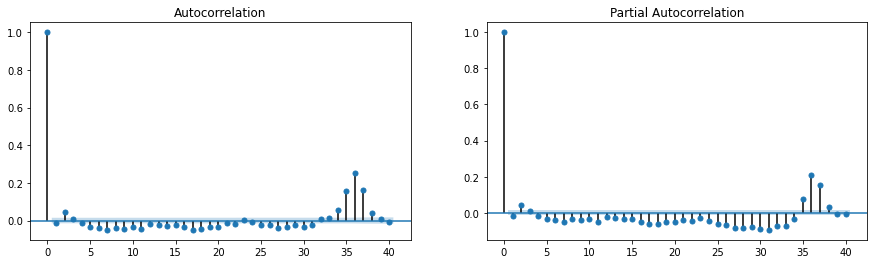

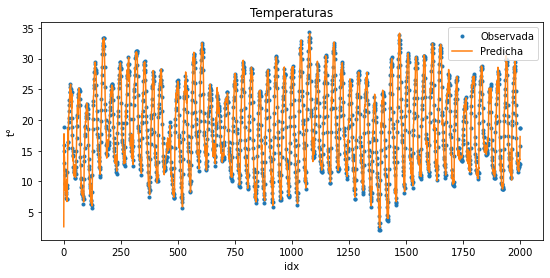

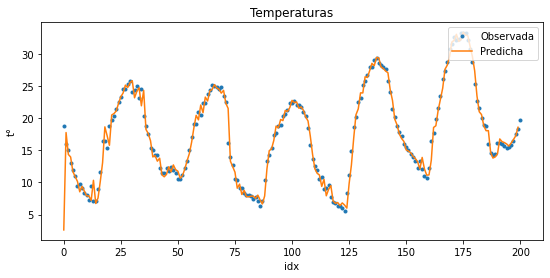

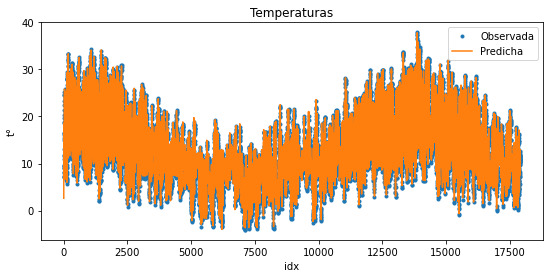

In [26]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

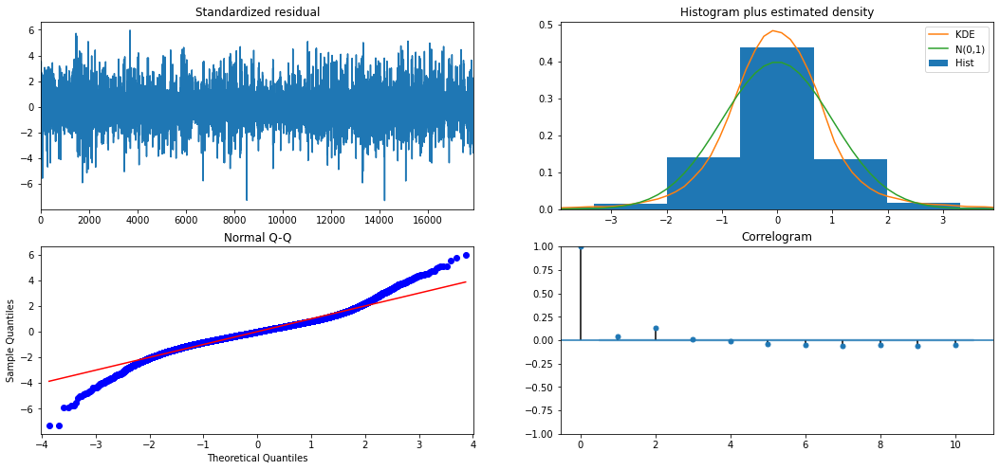

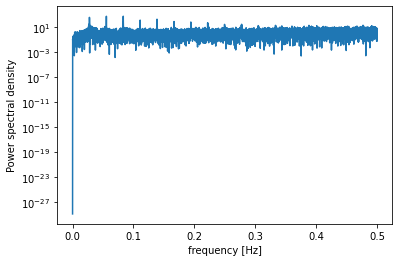

          freq         pow      delay
1492  0.083287  492.802580  12.006702
995   0.055543  484.916717  18.004020
496   0.027688  324.198021  36.116935
499   0.027855  210.732838  35.899800
2485  0.138718  164.991289   7.208853
994   0.055487  135.151715  18.022133
2488  0.138886  130.508374   7.200161
1989  0.111030  118.121061   9.006536
1493  0.083343  115.635996  11.998660
1988  0.110975  105.391010   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -25171.794
Date:                Sun, 15 Nov 2020   AIC                          50357.589
Time:                        20:06:35   BIC                          50412.142
Sample:                             0   HQIC                         50375.533
                              - 17914                                         
Covariance Type:             

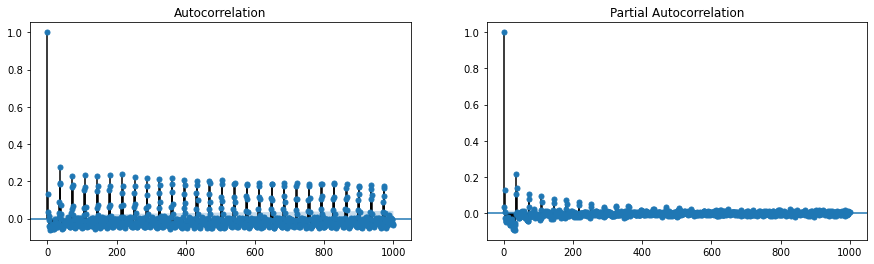

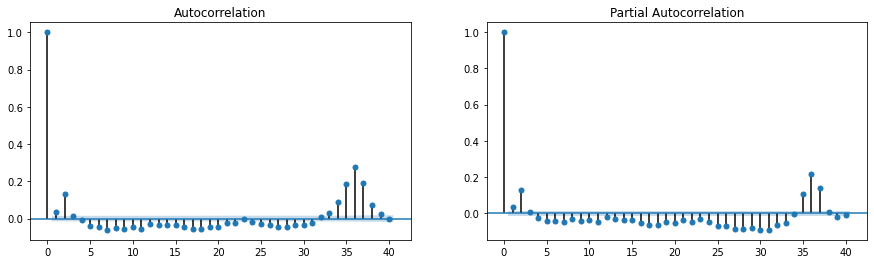

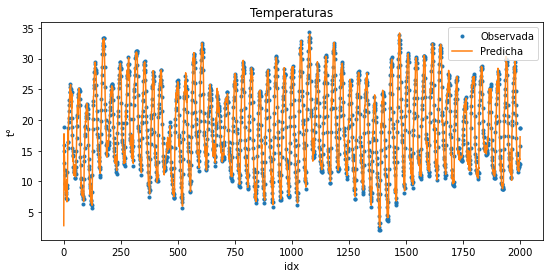

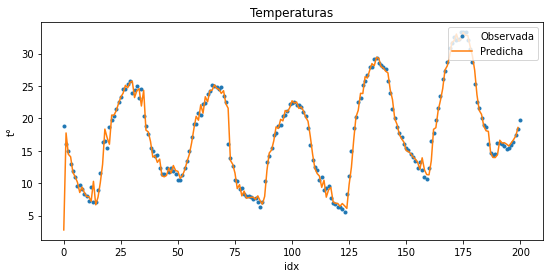

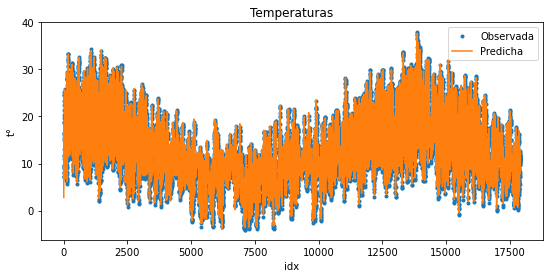

In [27]:
mysarimax(Y=Y_Ajuste,
         order=(0,1,1),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

In [28]:
#X4 no significativo

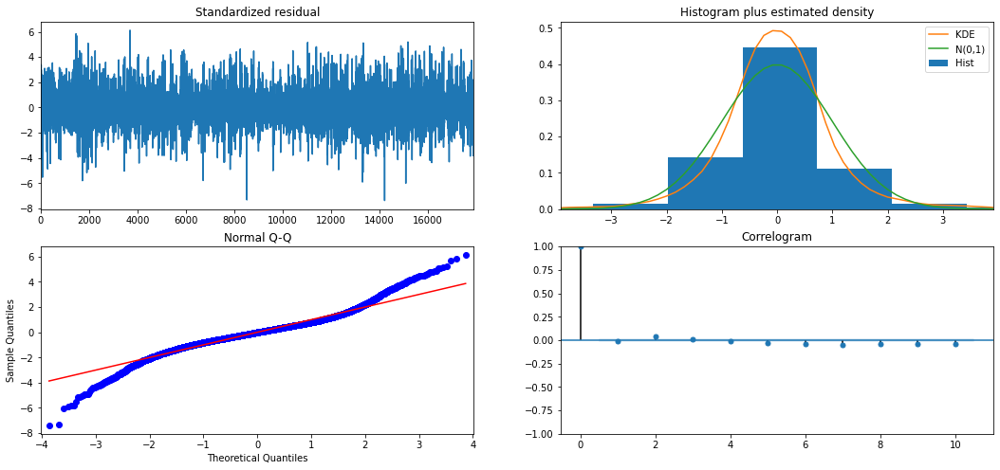

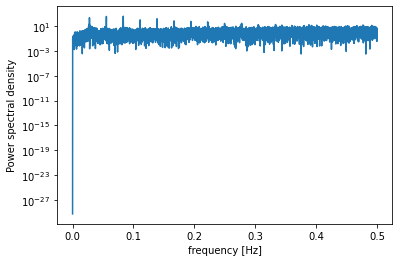

          freq         pow      delay
1492  0.083287  418.418128  12.006702
995   0.055543  385.519063  18.004020
496   0.027688  245.632507  36.116935
2485  0.138718  164.009995   7.208853
499   0.027855  160.538766  35.899800
2488  0.138886  128.955181   7.200161
1989  0.111030  108.850612   9.006536
994   0.055487  108.000882  18.022133
1493  0.083343   98.403962  11.998660
1988  0.110975   96.278899   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -25021.234
Date:                Sun, 15 Nov 2020   AIC                          50054.467
Time:                        20:06:57   BIC                          50101.227
Sample:                             0   HQIC                         50069.848
                              - 17914                                         
Covariance Type:             

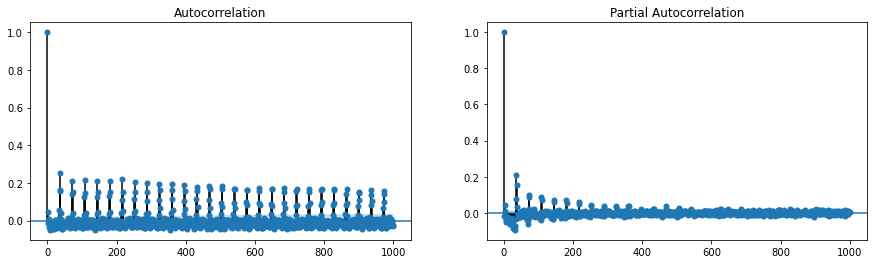

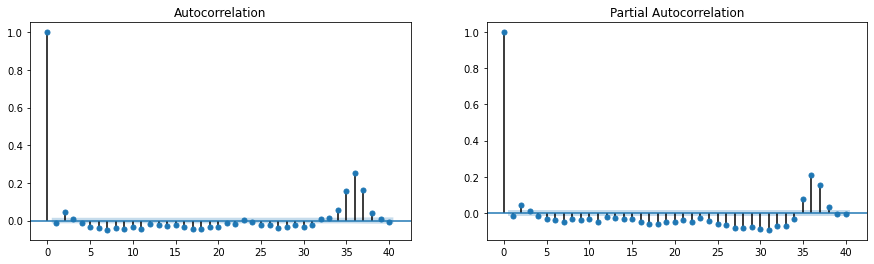

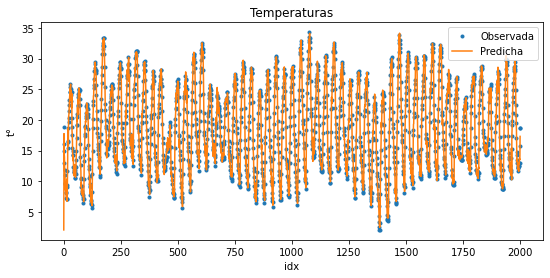

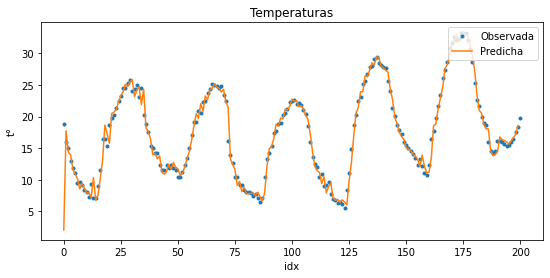

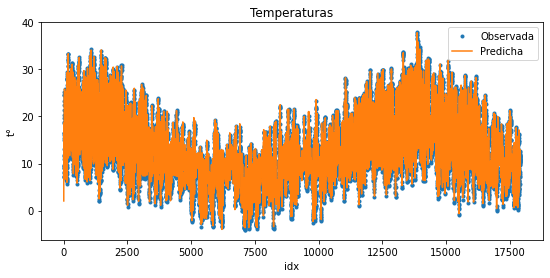

In [29]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes']])

In [30]:
#X3 no significativo

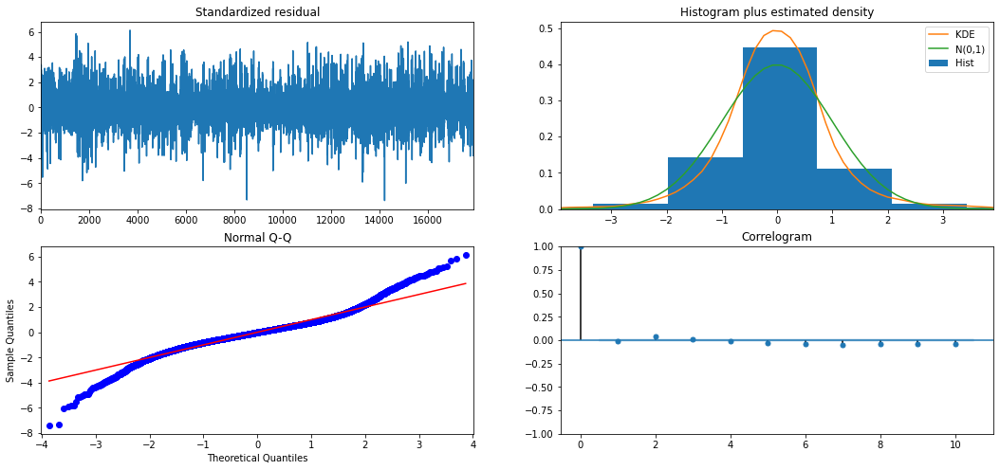

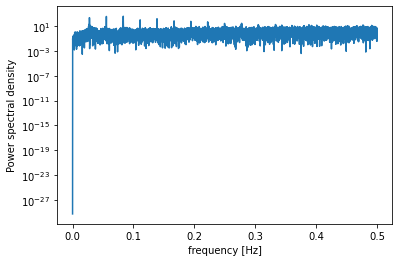

          freq         pow      delay
1492  0.083287  418.420997  12.006702
995   0.055543  385.407549  18.004020
496   0.027688  245.931426  36.116935
2485  0.138718  164.244038   7.208853
499   0.027855  160.782500  35.899800
2488  0.138886  129.144004   7.200161
1989  0.111030  108.884483   9.006536
994   0.055487  108.036166  18.022133
1493  0.083343   98.541556  11.998660
1988  0.110975   96.107881   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -25021.350
Date:                Sun, 15 Nov 2020   AIC                          50052.699
Time:                        20:07:13   BIC                          50091.666
Sample:                             0   HQIC                         50065.516
                              - 17914                                         
Covariance Type:             

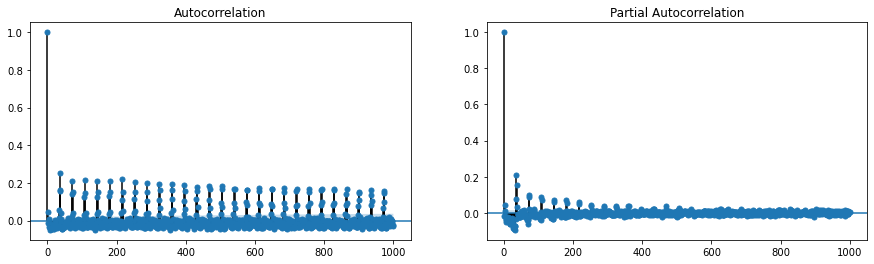

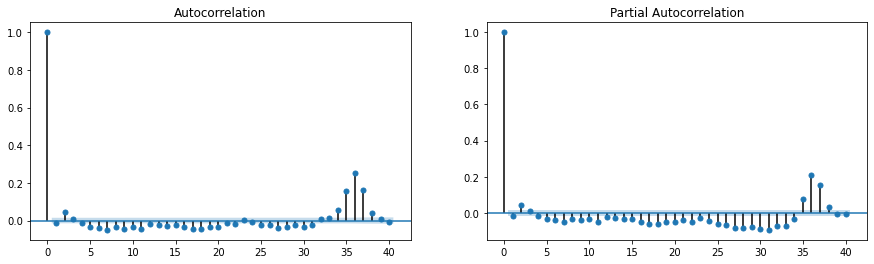

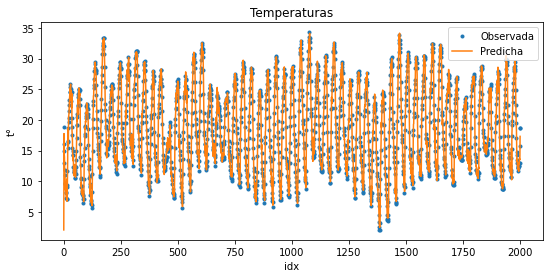

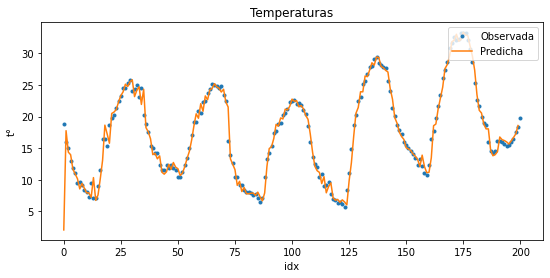

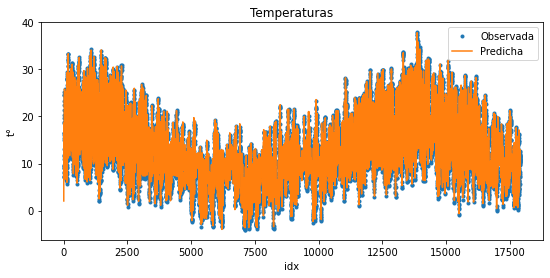

In [31]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

Los mejores resultados de las pruebas anteriores se obtienen con componente AR1 y es necesario retirar los predictores asociados a sinusoides de periodicidad anual por ser no significativos en esta situación.  
Se mantiene una densidad espectral alta en periodos de 12 y 24 horas, se revisa el efecto de agregar términos con un retraso de 24 horas y posteriormente 12 horas.  

In [32]:
#AR o MA 24 h

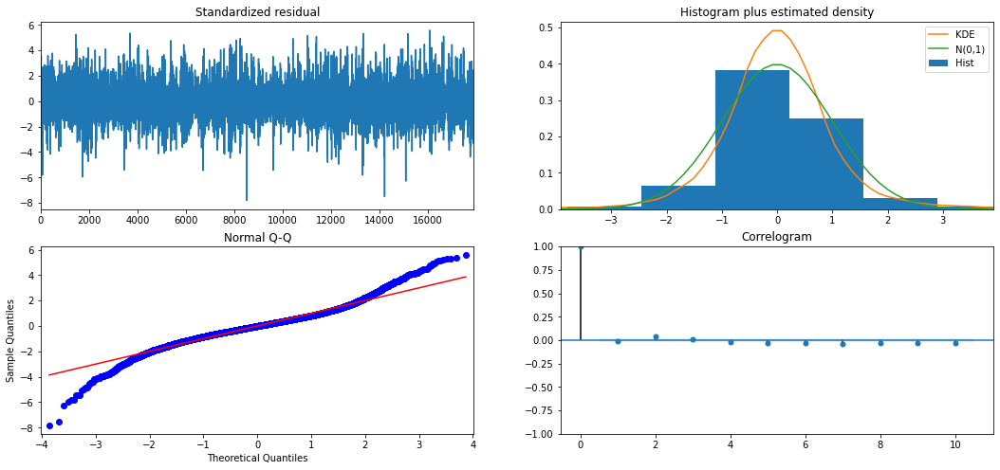

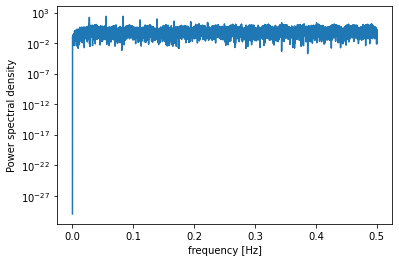

          freq         pow      delay
1492  0.083287  254.407671  12.006702
995   0.055543  245.469726  18.004020
496   0.027688  161.685817  36.116935
499   0.027855  106.709320  35.899800
2485  0.138718   90.391418   7.208853
2488  0.138886   70.771601   7.200161
994   0.055487   69.471048  18.022133
1989  0.111030   63.777461   9.006536
1493  0.083343   59.619403  11.998660
1988  0.110975   56.499171   9.011066
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 36)   Log Likelihood              -24311.236
Date:                            Sun, 15 Nov 2020   AIC                          48634.473
Time:                                    20:08:28   BIC                          48681.232
Sample:                                         0   HQIC                         48649.853
                                    

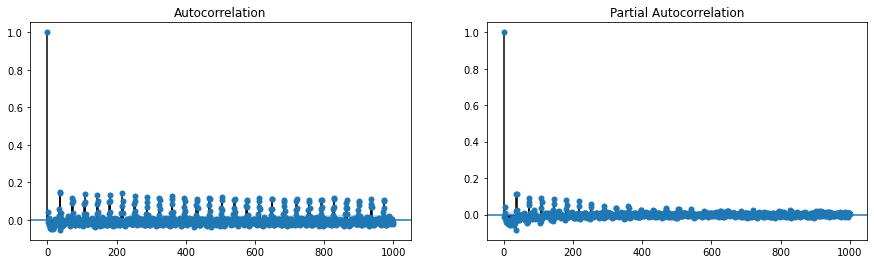

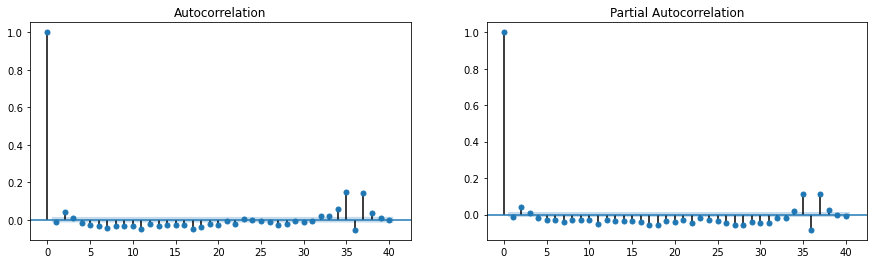

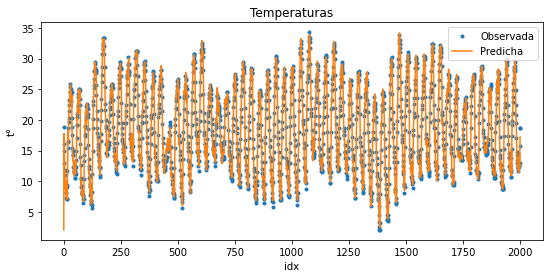

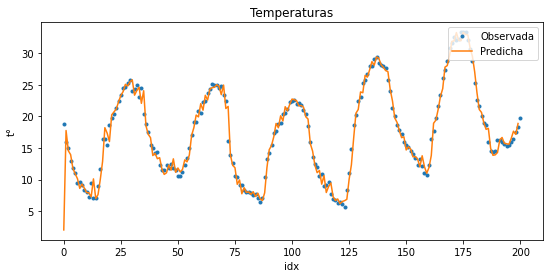

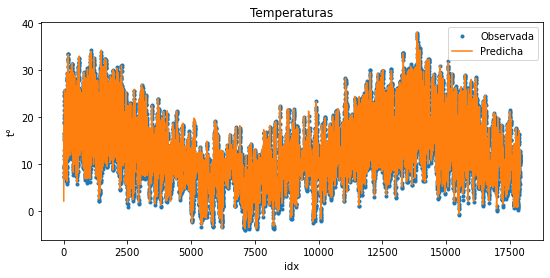

In [33]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(1,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

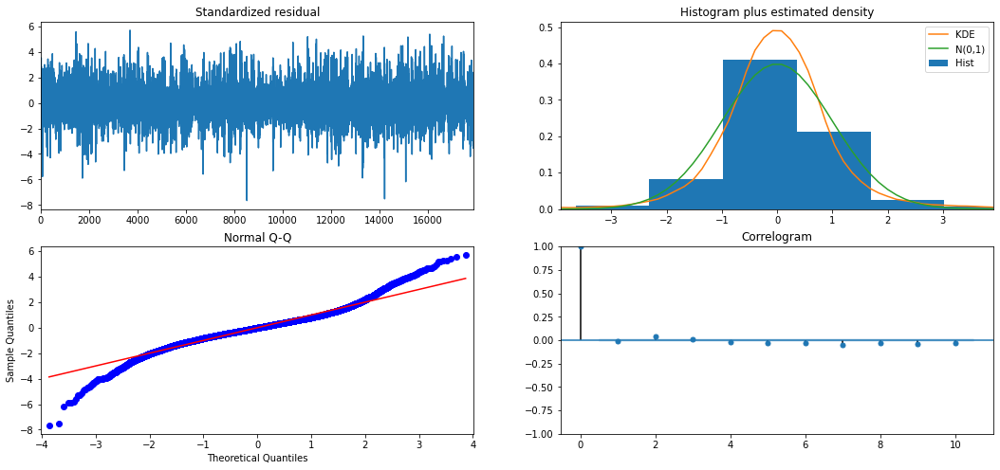

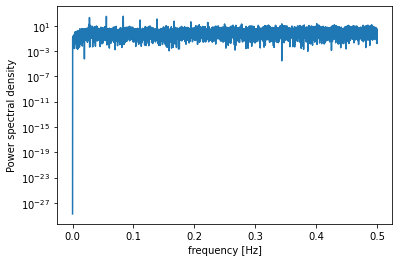

          freq         pow      delay
1492  0.083287  322.098039  12.006702
995   0.055543  305.583576  18.004020
496   0.027688  199.161944  36.116935
499   0.027855  130.729349  35.899800
2485  0.138718  118.425417   7.208853
2488  0.138886   92.965000   7.200161
994   0.055487   86.149497  18.022133
1989  0.111030   81.567755   9.006536
1493  0.083343   75.675367  11.998660
1988  0.110975   72.172690   9.011066
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 0)x(0, 0, [1], 36)   Log Likelihood              -24519.814
Date:                              Sun, 15 Nov 2020   AIC                          49051.629
Time:                                      20:10:12   BIC                          49098.388
Sample:                                           0   HQIC                         49067.009
                        

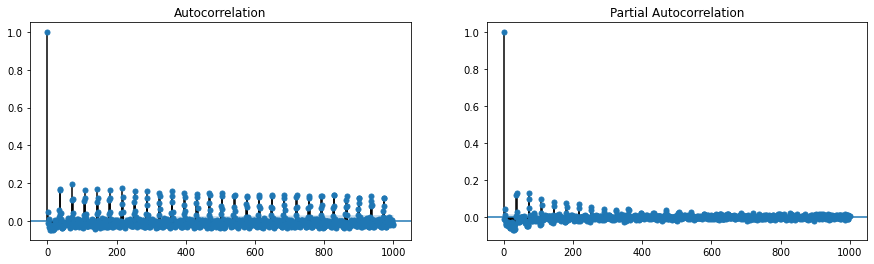

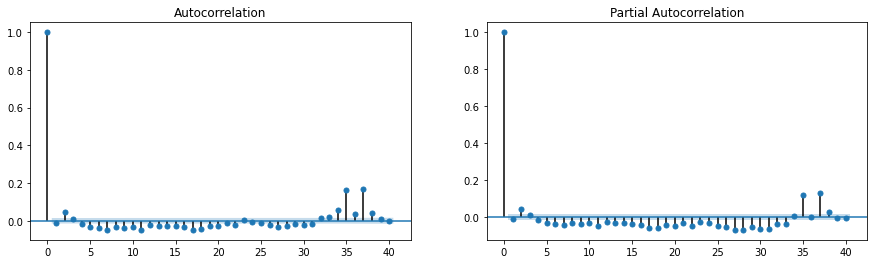

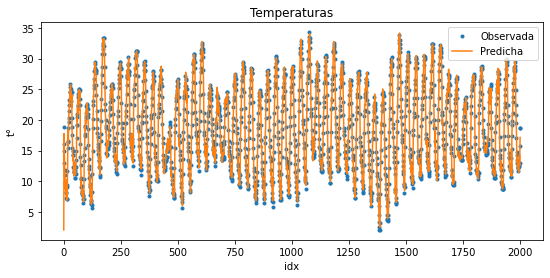

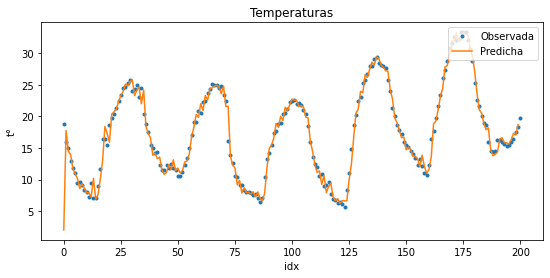

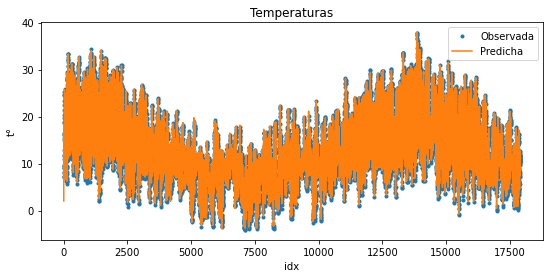

In [34]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [35]:
#AR y MA 24 h

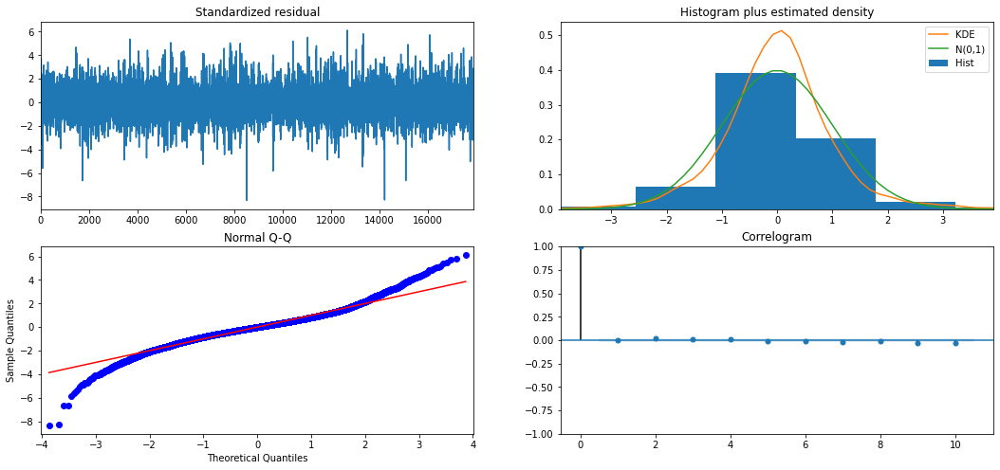

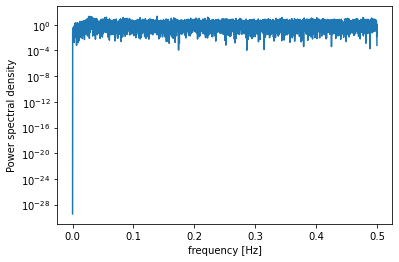

          freq        pow      delay
2485  0.138718  21.479905   7.208853
496   0.027688  21.063652  36.116935
473   0.026404  18.772158  37.873150
538   0.030032  17.081805  33.297398
479   0.026739  16.912836  37.398747
541   0.030200  16.157499  33.112754
522   0.029139  16.138589  34.318008
578   0.032265  15.475759  30.993080
3976  0.221949  15.260610   4.505533
995   0.055543  15.048165  18.004020
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 0)x(1, 0, [1], 36)   Log Likelihood              -23031.318
Date:                              Sun, 15 Nov 2020   AIC                          46076.637
Time:                                      20:15:54   BIC                          46131.190
Sample:                                           0   HQIC                         46094.581
                                   

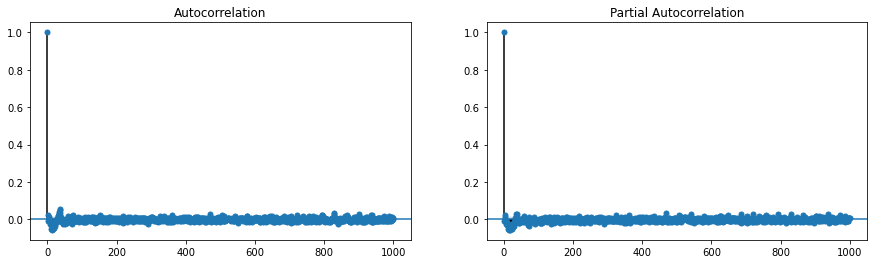

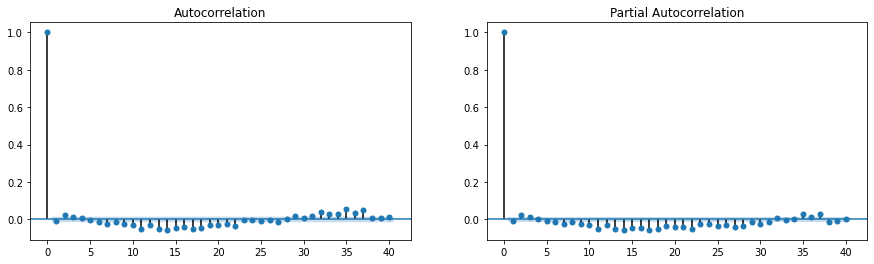

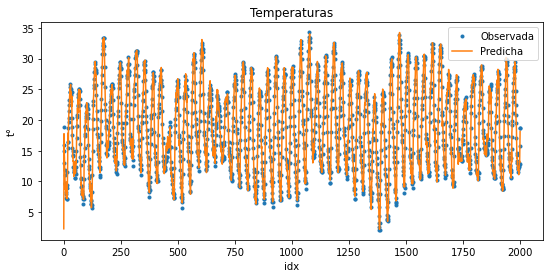

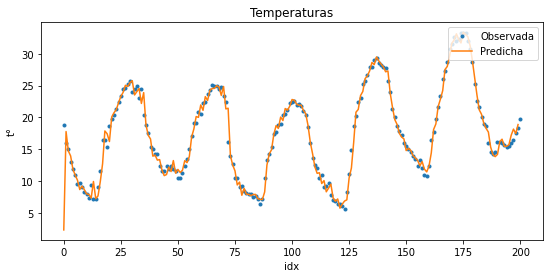

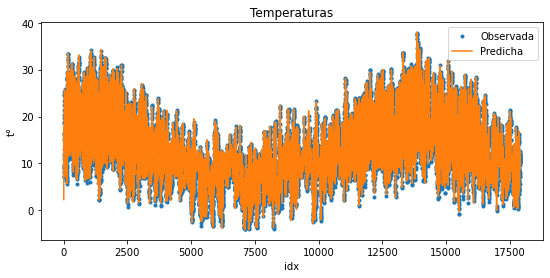

In [36]:
mysarimax(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

In [37]:
#AR o MA 12 h

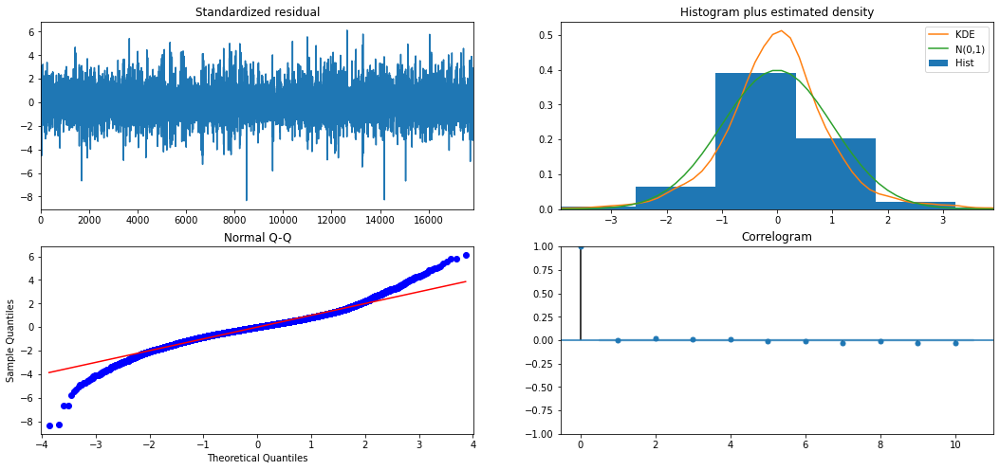

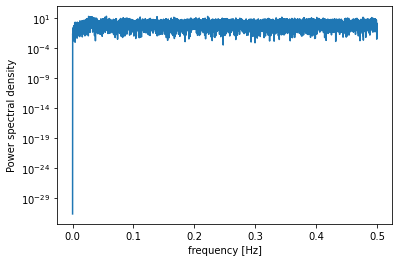

          freq        pow      delay
995   0.055543  20.085853  18.004020
473   0.026404  19.029050  37.873150
3976  0.221949  18.940374   4.505533
2485  0.138718  17.201153   7.208853
479   0.026739  17.186077  37.398747
496   0.027688  17.148824  36.116935
538   0.030032  16.243399  33.297398
541   0.030200  16.174613  33.112754
578   0.032265  15.291929  30.993080
522   0.029139  15.035687  34.318008
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 0)x(2, 0, [1, 2], 18)   Log Likelihood              -22986.565
Date:                                 Sun, 15 Nov 2020   AIC                          45989.129
Time:                                         20:21:04   BIC                          46051.459
Sample:                                              0   HQIC                         46009.633
                 

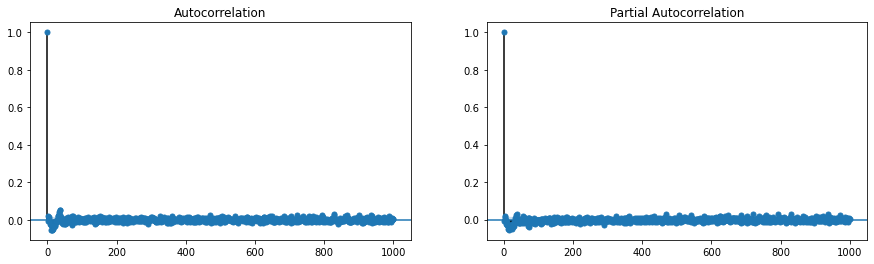

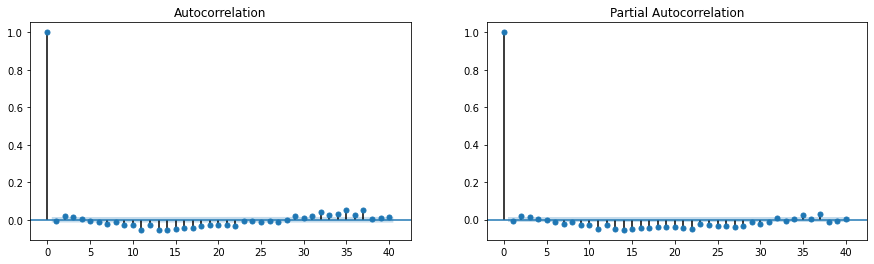

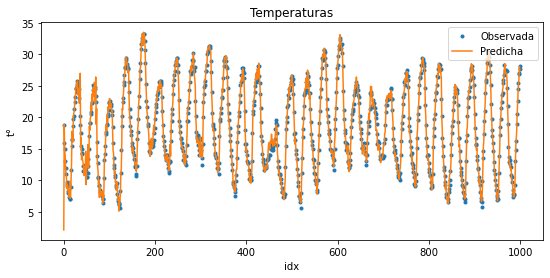

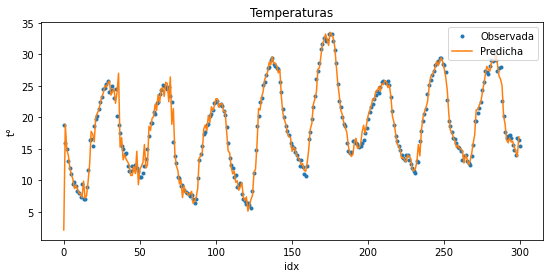

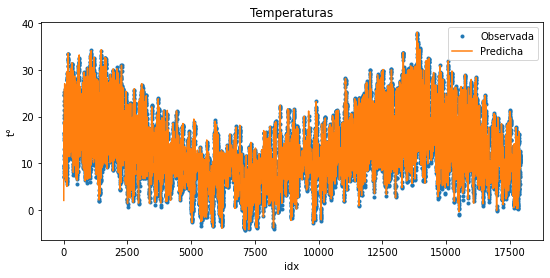

In [38]:
mysarimax2(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']],
         restriccion={'ar.S.L18':0})

Se opta por el modelo siguiente por sus predictores significativas y menor AIC

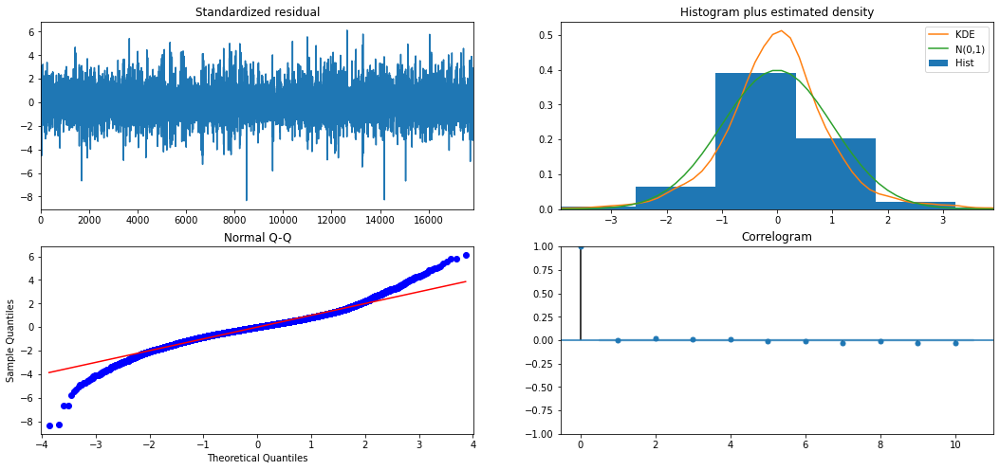

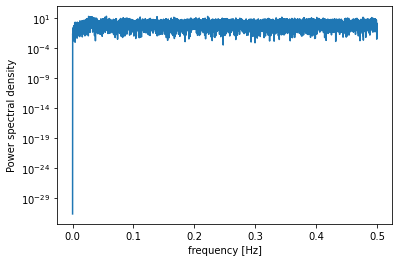

          freq        pow      delay
995   0.055543  20.085853  18.004020
473   0.026404  19.029050  37.873150
3976  0.221949  18.940374   4.505533
2485  0.138718  17.201153   7.208853
479   0.026739  17.186077  37.398747
496   0.027688  17.148824  36.116935
538   0.030032  16.243399  33.297398
541   0.030200  16.174613  33.112754
578   0.032265  15.291929  30.993080
522   0.029139  15.035687  34.318008
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 0)x(2, 0, [1, 2], 18)   Log Likelihood              -22986.565
Date:                                 Mon, 16 Nov 2020   AIC                          45989.129
Time:                                         23:08:23   BIC                          46051.459
Sample:                                              0   HQIC                         46009.633
                 

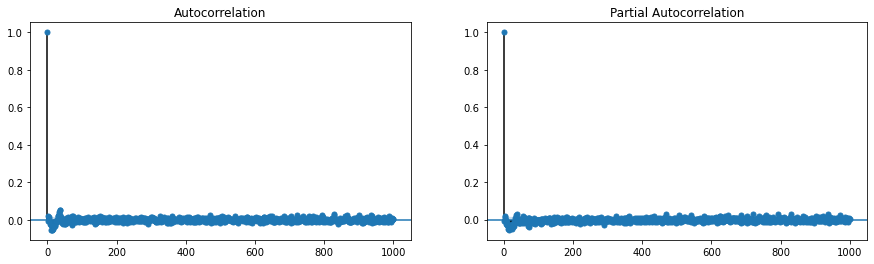

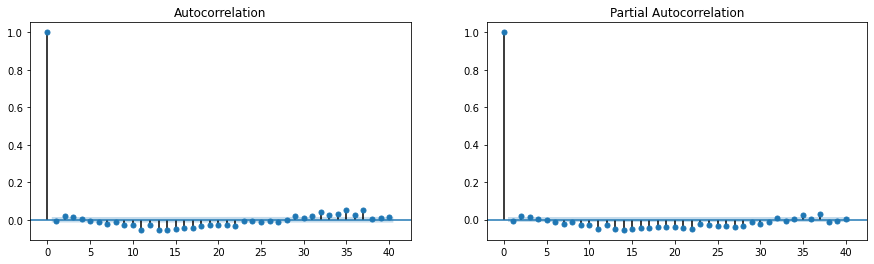

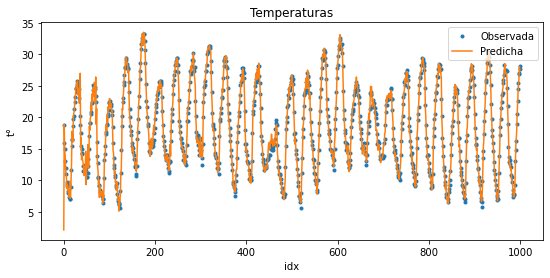

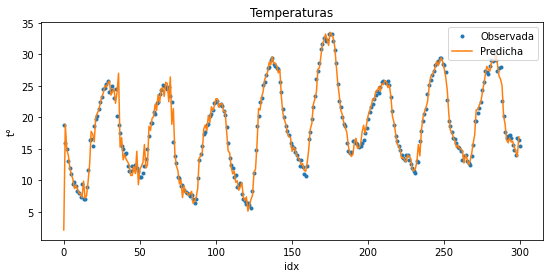

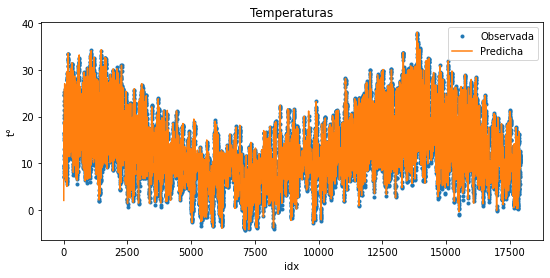

In [23]:
Res1=mysarimax2(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(2,0,2,60*12/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']],
         restriccion={'ar.S.L18':0})

Ahora se observa los resultados en la base de datos de testeo para la validación:

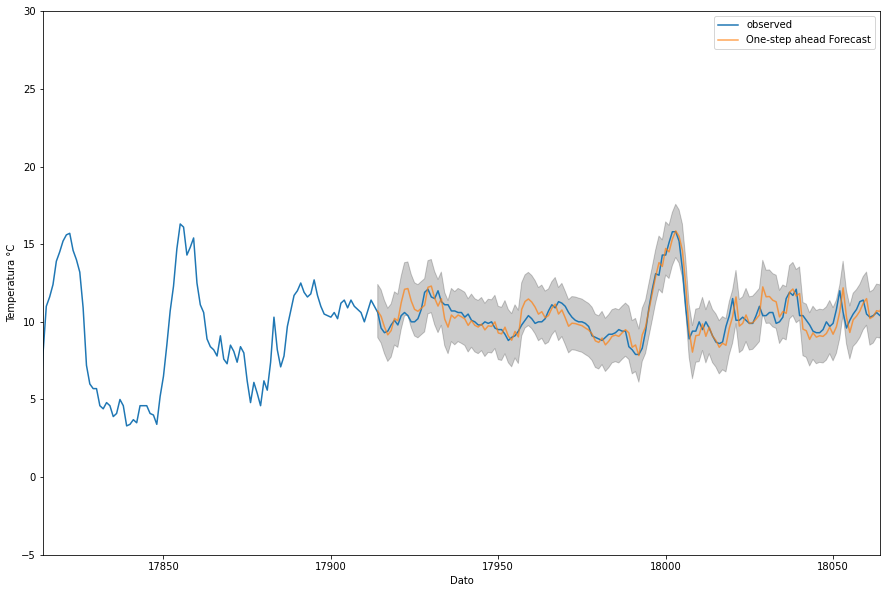

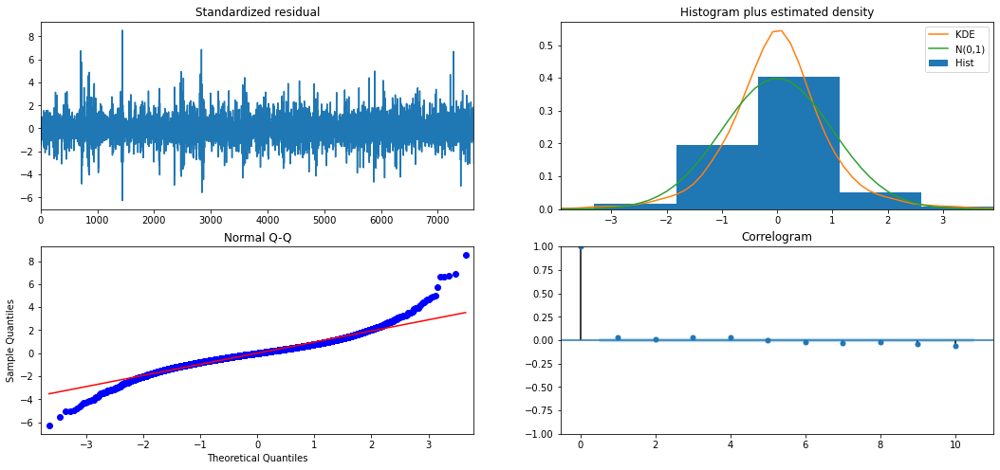

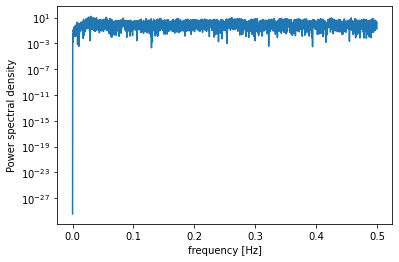

                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                 7677
Model:             SARIMAX(1, 1, 0)x(2, 0, [1, 2], 18)   Log Likelihood               -9567.313
Date:                                 Mon, 16 Nov 2020   AIC                          19150.627
Time:                                         23:08:38   BIC                          19206.155
Sample:                                              0   HQIC                         19169.677
                                                - 7677                                         
Covariance Type:                                   opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept         8.497e-06      0.001      0.012      0.990  

(<statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper at 0x15a69951910>,
 <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x15a697d7790>)

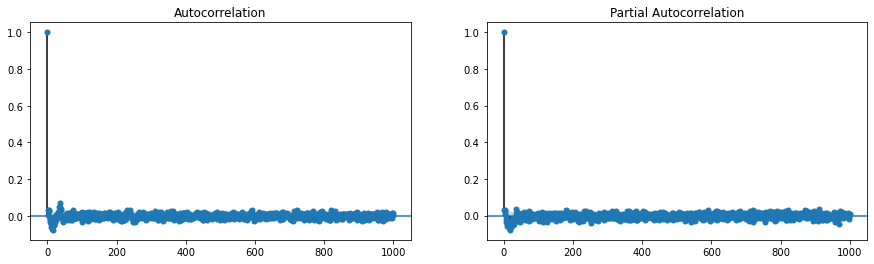

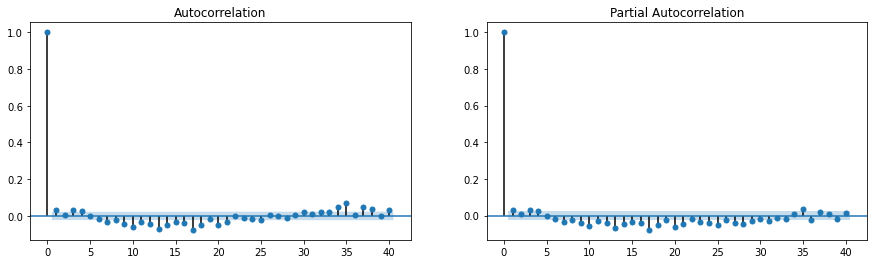

In [24]:
predecir_1(Res1,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17914  10.6 -0.096712        False        False        False
17915   9.6 -0.751321        False        False        False
17916   9.3 -0.370539        False        False        False
17917   9.4  0.237123        False        False        False
17918   9.8  0.362797        False        False        False
...     ...       ...          ...          ...          ...
25586  31.9  0.155348        False        False        False
25587  31.8  0.340379        False        False        False
25588  31.8  0.726273        False        False        False
25589  30.9  0.371619        False        False        False
25590  26.4 -2.680464         True         True        False

[7677 rows x 5 columns]
Promedio Valor Absoluto Error: 0.5995829857728722
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    17.155139     3.165299     0.742478


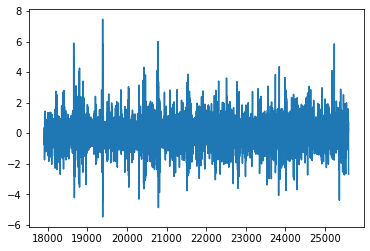

In [38]:
predecir_3(Res1,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

Repetimos el procedimiento, pero sin considerar componente diferencial:

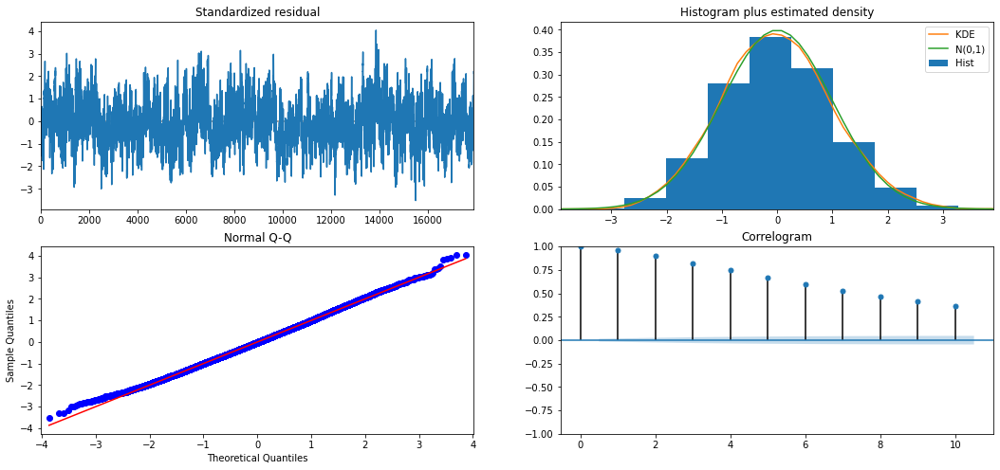

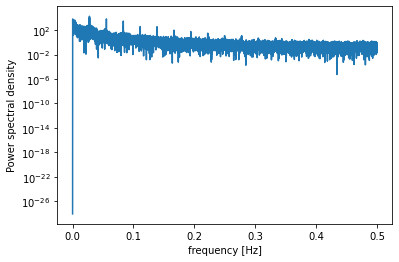

         freq           pow        delay
496  0.027688  18066.316687    36.116935
499  0.027855  11135.533153    35.899800
995  0.055543   6557.748753    18.004020
7    0.000391   6048.695204  2559.142857
3    0.000167   5666.040121  5971.333333
63   0.003517   4319.387441   284.349206
500  0.027911   4155.577077    35.828000
19   0.001061   4036.275936   942.842105
12   0.000670   3941.952141  1492.833333
43   0.002400   3741.913270   416.604651
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:                        SARIMAX   Log Likelihood              -48982.462
Date:                Sun, 15 Nov 2020   AIC                          97976.924
Time:                        20:27:12   BIC                          98023.684
Sample:                             0   HQIC                         97992.304
                              - 17914                                      

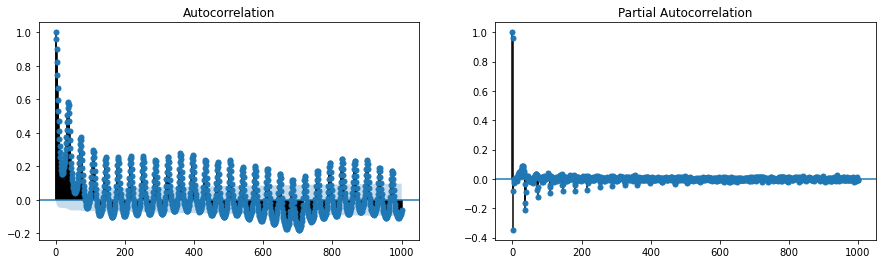

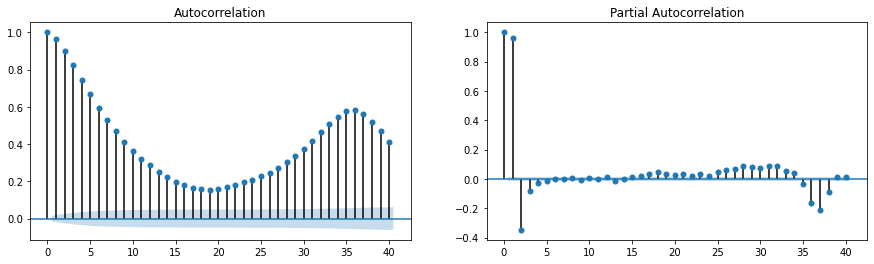

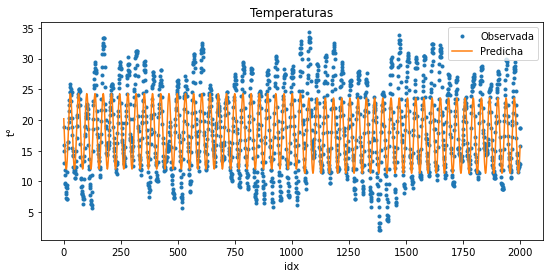

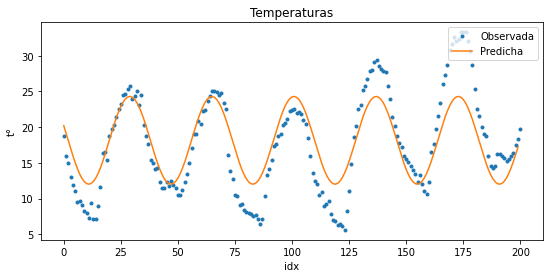

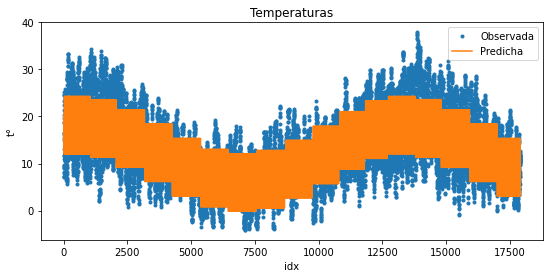

In [41]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

Evaluar AR o MA 1 o ambos:

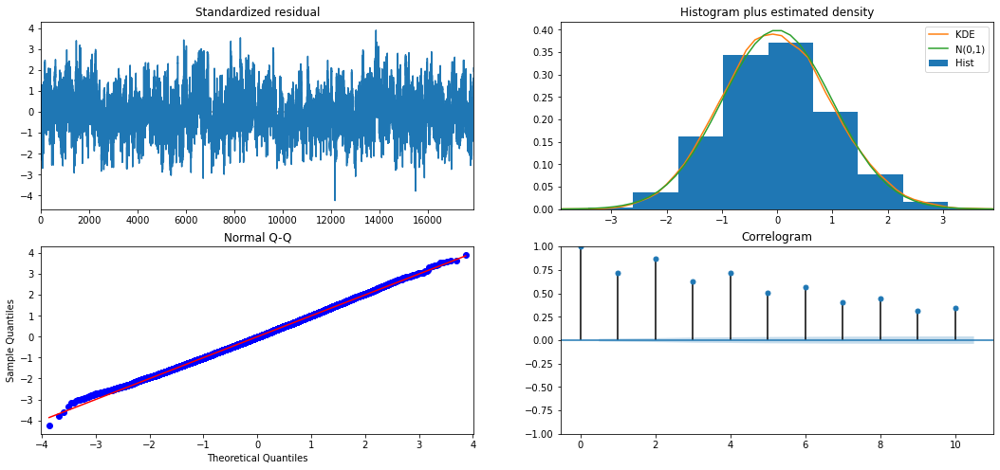

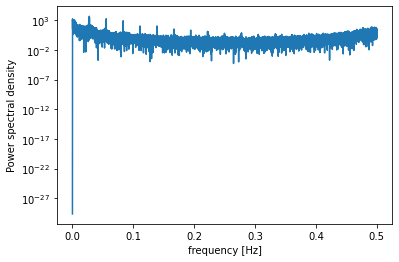

         freq          pow        delay
496  0.027688  5230.169256    36.116935
499  0.027855  3224.290134    35.899800
995  0.055543  1942.063054    18.004020
7    0.000391  1736.650086  2559.142857
3    0.000167  1630.539414  5971.333333
63   0.003517  1241.384522   284.349206
500  0.027911  1203.623034    35.828000
19   0.001061  1159.739065   942.842105
12   0.000670  1132.807708  1492.833333
43   0.002400  1074.436023   416.604651
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(0, 0, 1)   Log Likelihood              -39160.968
Date:                Sun, 15 Nov 2020   AIC                          78335.936
Time:                        20:27:32   BIC                          78390.489
Sample:                             0   HQIC                         78353.880
                              - 17914                                         
Covaria

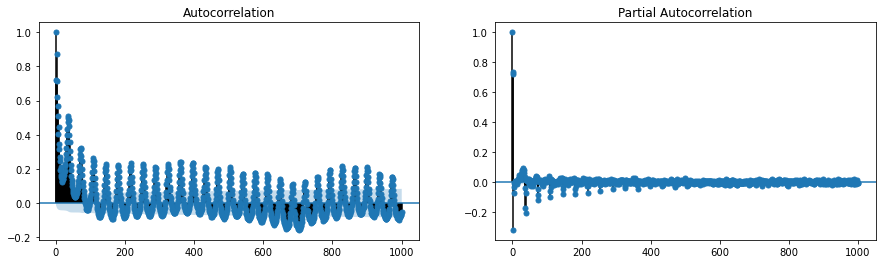

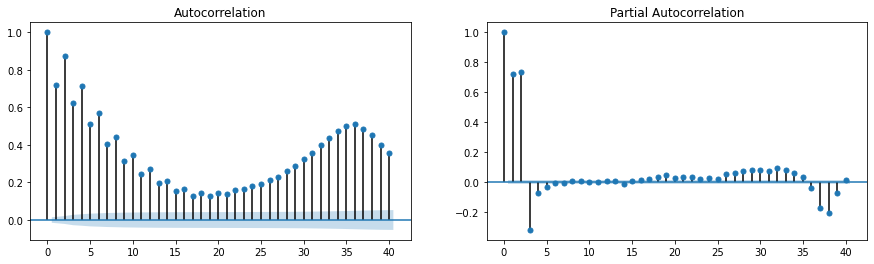

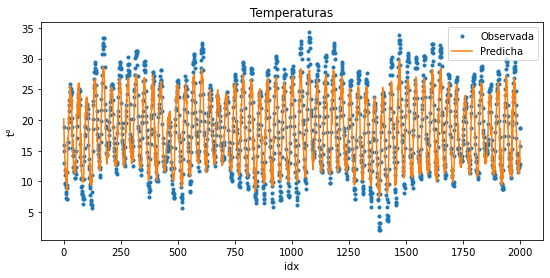

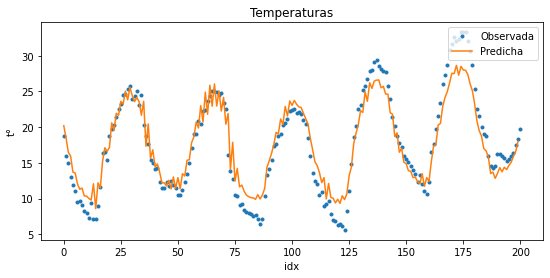

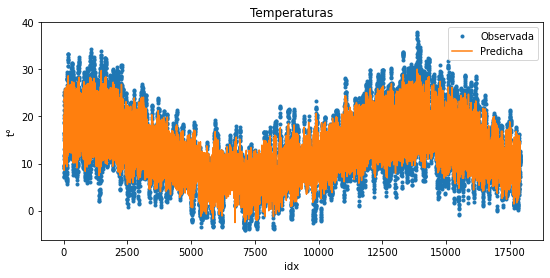

In [42]:
mysarimax(Y=Y_Ajuste,
         order=(0,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

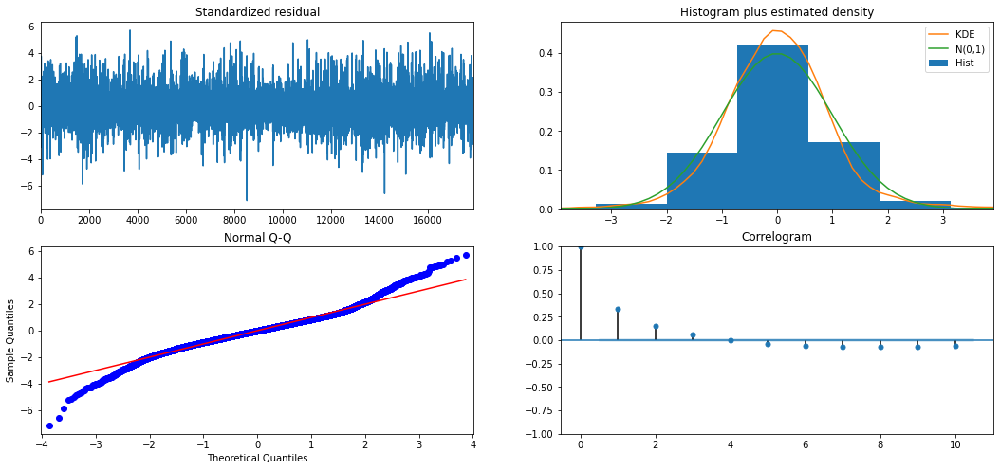

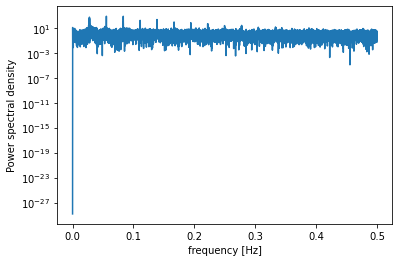

          freq         pow      delay
995   0.055543  765.815616  18.004020
1492  0.083287  752.692839  12.006702
496   0.027688  546.604885  36.116935
499   0.027855  344.251030  35.899800
2485  0.138718  228.658914   7.208853
994   0.055487  206.247330  18.022133
2488  0.138886  188.078263   7.200161
1493  0.083343  178.299428  11.998660
1989  0.111030  166.192939   9.006536
996   0.055599  153.018437  17.985944
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 0, 0)   Log Likelihood              -25864.386
Date:                Sun, 15 Nov 2020   AIC                          51742.772
Time:                        20:27:58   BIC                          51797.325
Sample:                             0   HQIC                         51760.716
                              - 17914                                         
Covariance Type:             

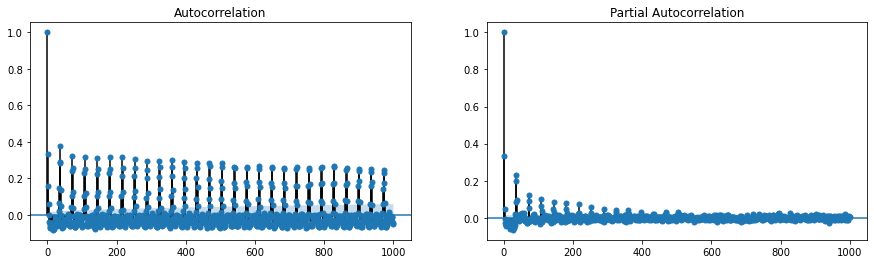

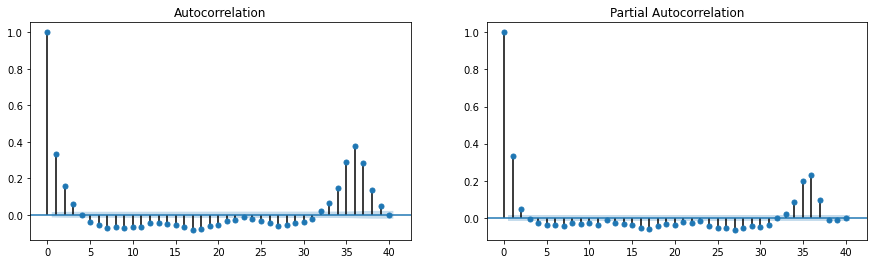

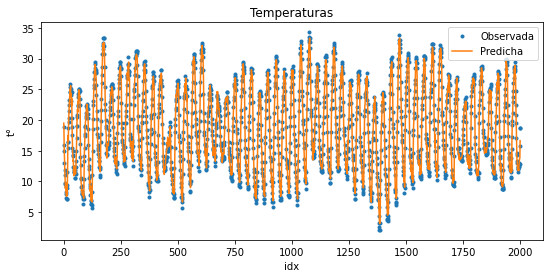

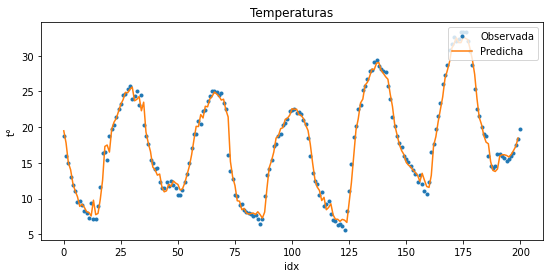

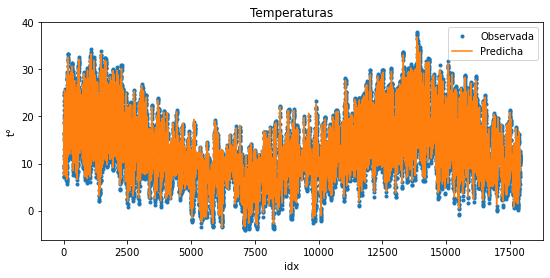

In [43]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

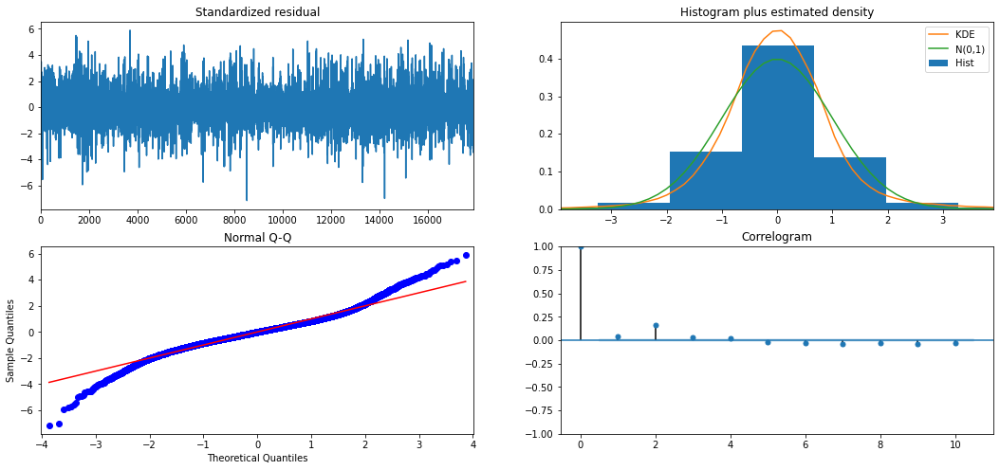

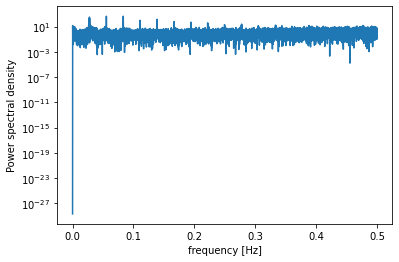

          freq         pow      delay
1492  0.083287  464.704116  12.006702
995   0.055543  464.270675  18.004020
496   0.027688  341.268604  36.116935
499   0.027855  214.580917  35.899800
2485  0.138718  153.097271   7.208853
2488  0.138886  126.148906   7.200161
994   0.055487  124.953695  18.022133
1493  0.083343  110.135905  11.998660
1989  0.111030  106.069355   9.006536
1988  0.110975   96.929329   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -24946.081
Date:                Sun, 15 Nov 2020   AIC                          49908.162
Time:                        20:28:30   BIC                          49970.509
Sample:                             0   HQIC                         49928.669
                              - 17914                                         
Covariance Type:             

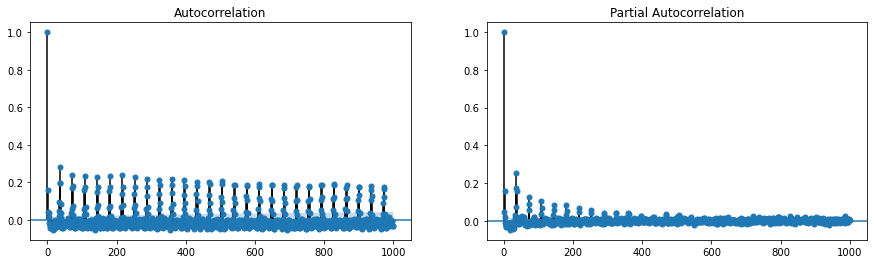

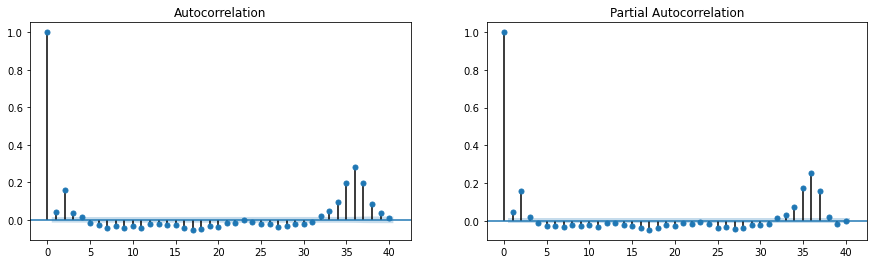

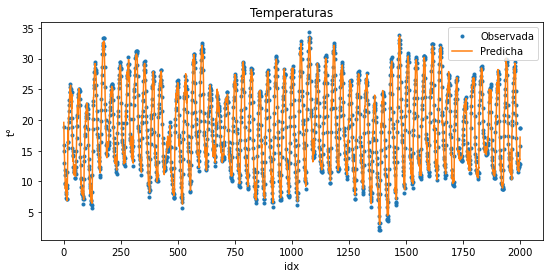

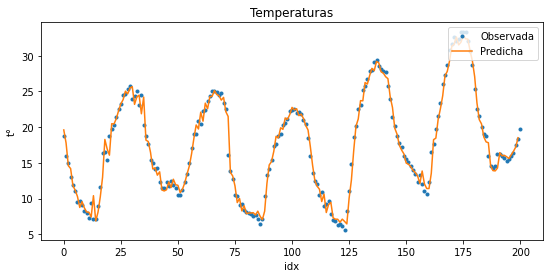

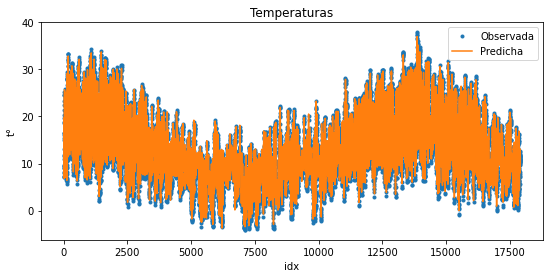

In [44]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Sen_Mes', 'Cos_Mes']])

Una de las sinusoides de estacionalidad anual no es significativa 

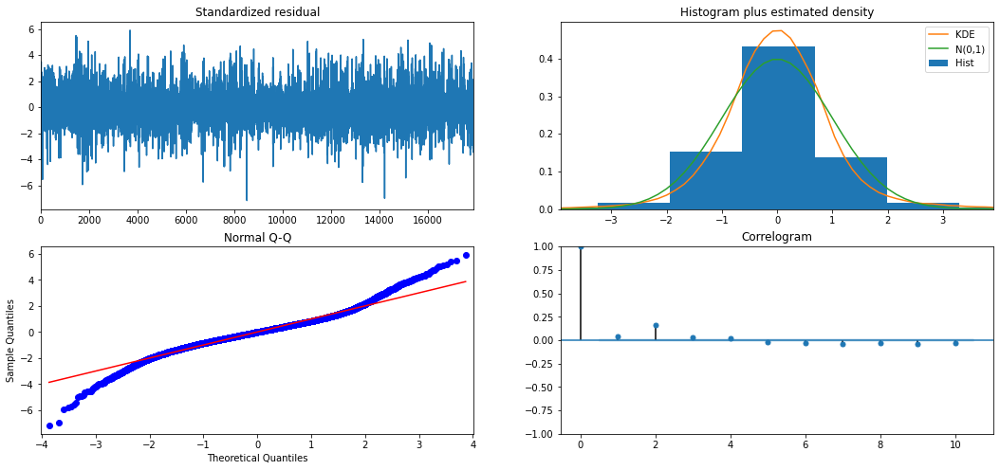

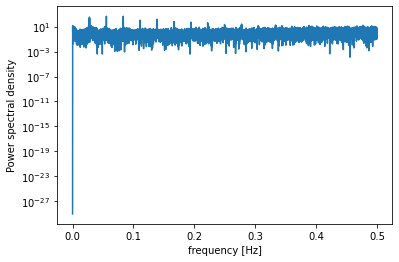

          freq         pow      delay
1492  0.083287  464.769301  12.006702
995   0.055543  464.403197  18.004020
496   0.027688  340.960953  36.116935
499   0.027855  214.334279  35.899800
2485  0.138718  152.947871   7.208853
2488  0.138886  126.038505   7.200161
994   0.055487  124.909151  18.022133
1493  0.083343  110.028457  11.998660
1989  0.111030  106.047332   9.006536
1988  0.110975   97.077378   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -24946.718
Date:                Sun, 15 Nov 2020   AIC                          49907.435
Time:                        20:28:55   BIC                          49961.989
Sample:                             0   HQIC                         49925.379
                              - 17914                                         
Covariance Type:             

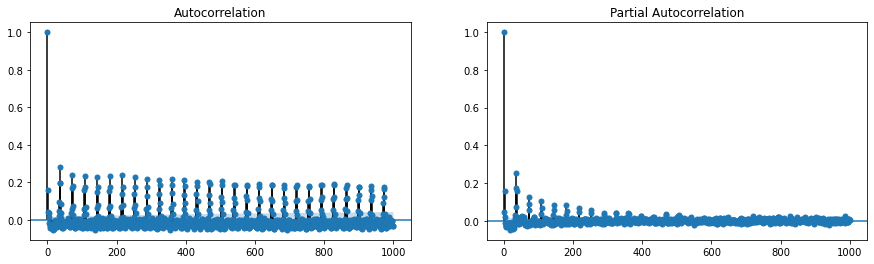

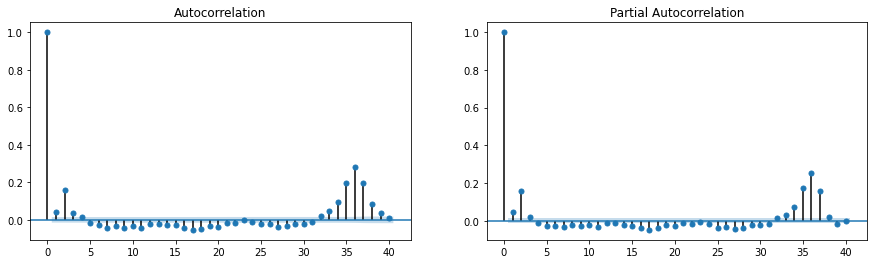

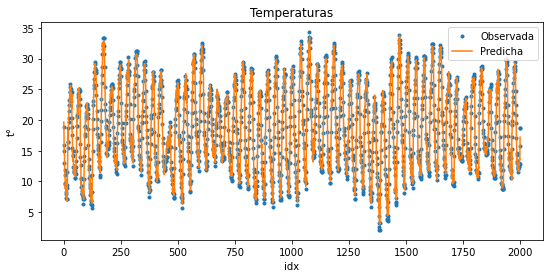

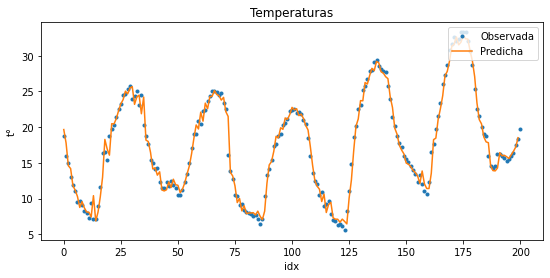

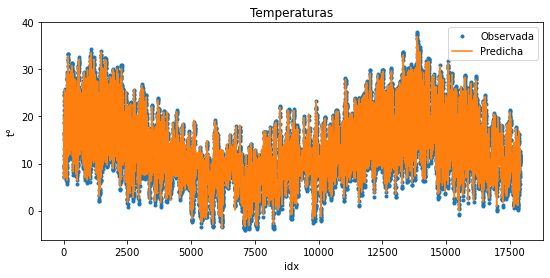

In [45]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Cos_Mes']])

Evaluar predictor con retraso de 24 horas

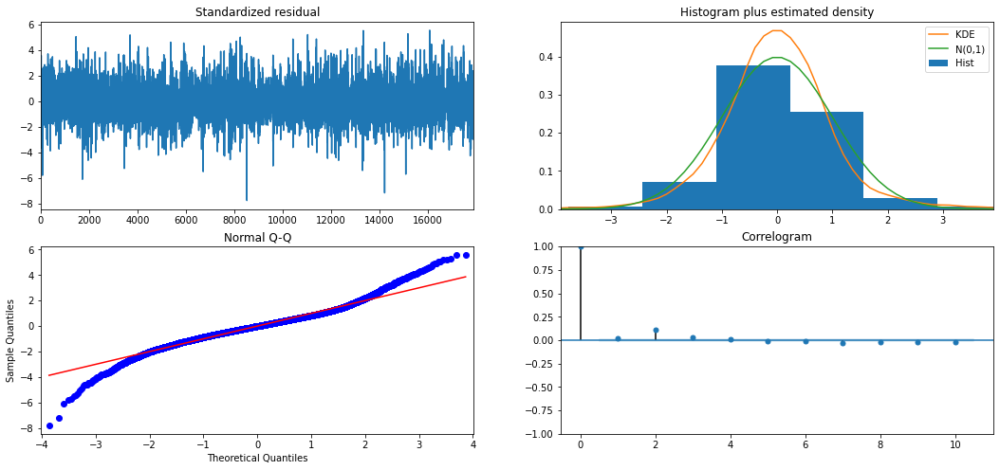

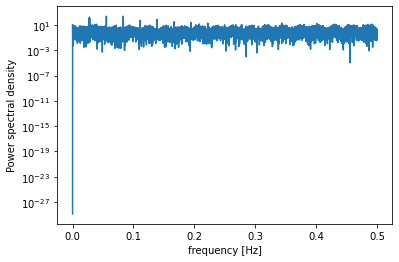

          freq         pow      delay
995   0.055543  249.644458  18.004020
1492  0.083287  247.268229  12.006702
496   0.027688  186.496736  36.116935
499   0.027855  117.763453  35.899800
2485  0.138718   80.321065   7.208853
994   0.055487   66.805144  18.022133
2488  0.138886   66.141314   7.200161
1493  0.083343   58.490123  11.998660
1989  0.111030   56.006765   9.006536
1988  0.110975   51.122175   9.011066
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                17914
Model:             SARIMAX(1, 0, 1)x(1, 0, [], 36)   Log Likelihood              -24112.826
Date:                             Sun, 15 Nov 2020   AIC                          48241.653
Time:                                     20:35:41   BIC                          48304.000
Sample:                                          0   HQIC                         48262.160
                              

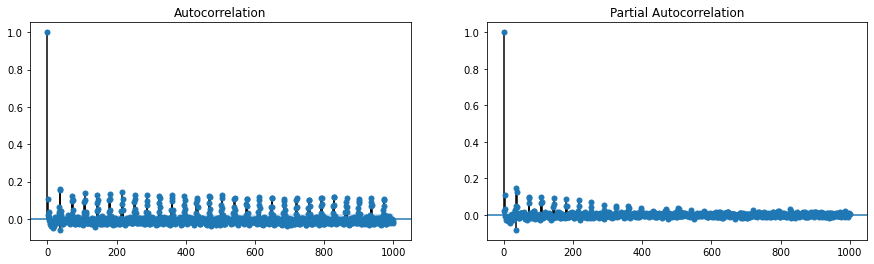

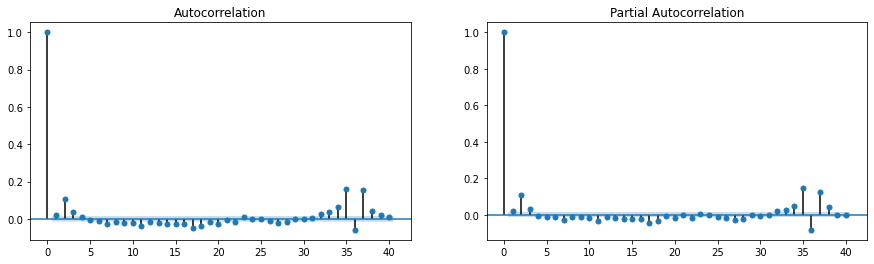

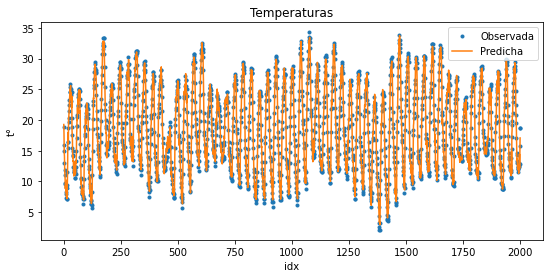

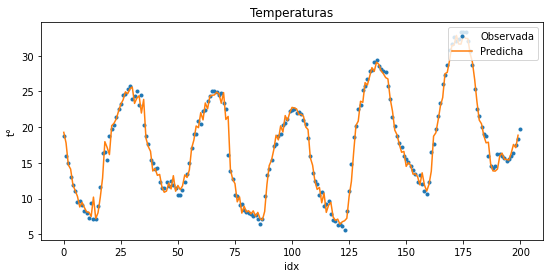

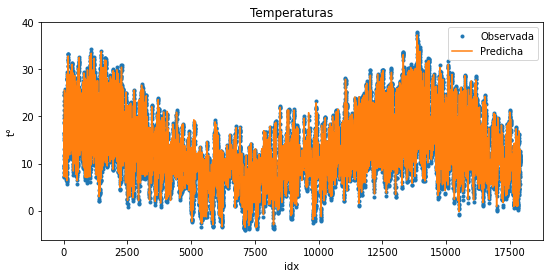

In [46]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(1,0,0,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Cos_Mes']])

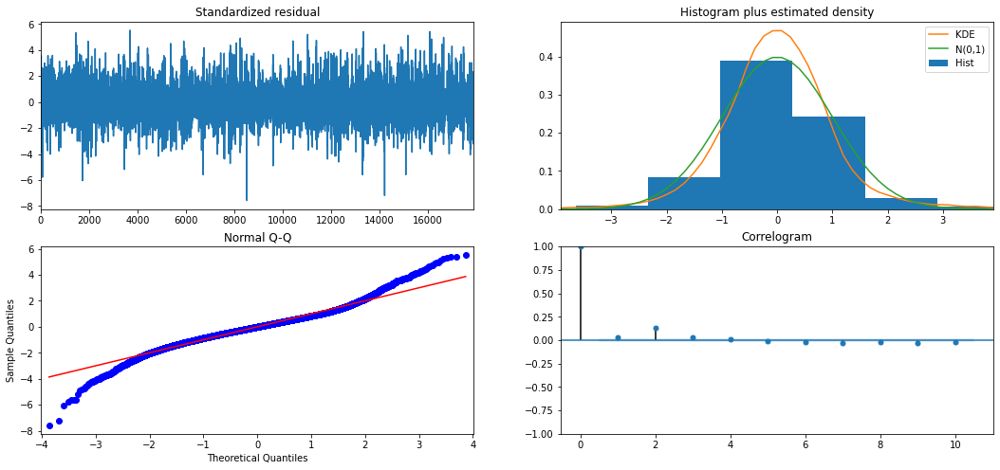

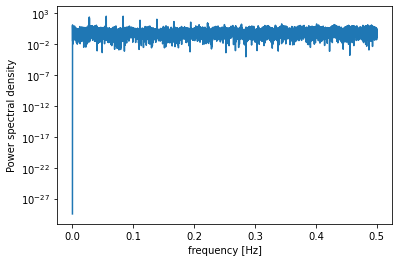

          freq         pow      delay
995   0.055543  332.375776  18.004020
1492  0.083287  330.772354  12.006702
496   0.027688  247.331541  36.116935
499   0.027855  155.771064  35.899800
2485  0.138718  107.867329   7.208853
994   0.055487   89.260120  18.022133
2488  0.138886   88.935984   7.200161
1493  0.083343   78.308816  11.998660
1989  0.111030   75.032700   9.006536
1988  0.110975   68.636763   9.011066
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 0, 1)x(0, 0, 1, 36)   Log Likelihood              -24356.160
Date:                            Sun, 15 Nov 2020   AIC                          48728.320
Time:                                    20:41:04   BIC                          48790.667
Sample:                                         0   HQIC                         48748.827
                                    

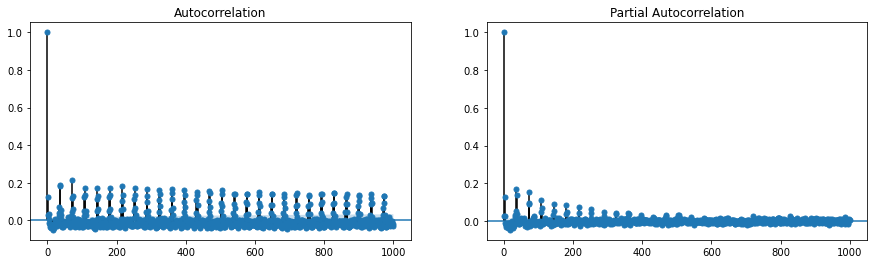

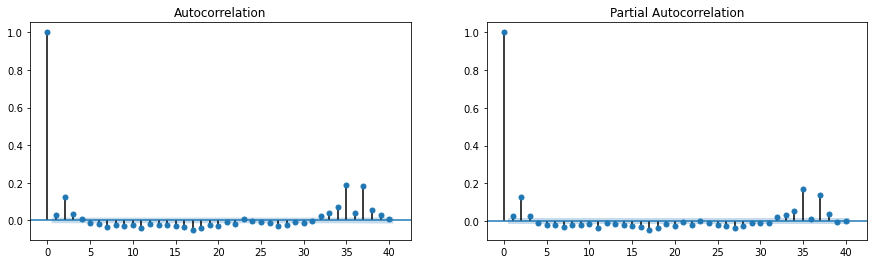

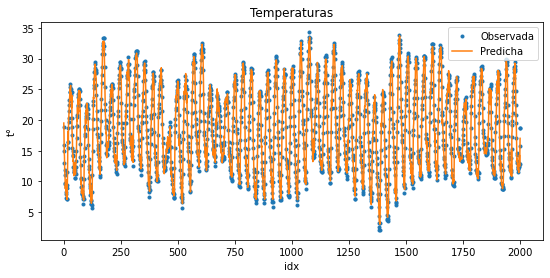

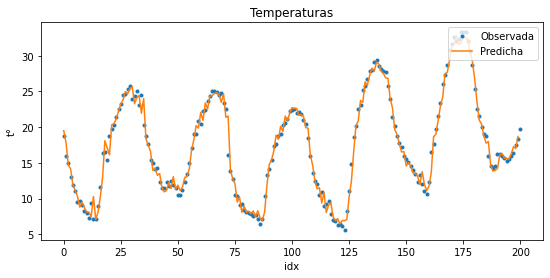

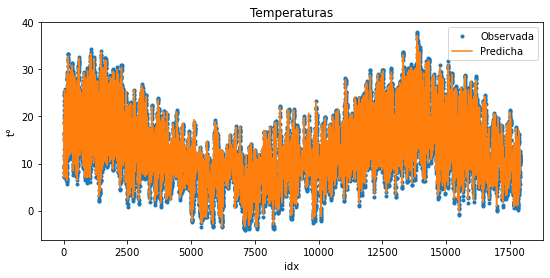

In [47]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(0,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Cos_Mes']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


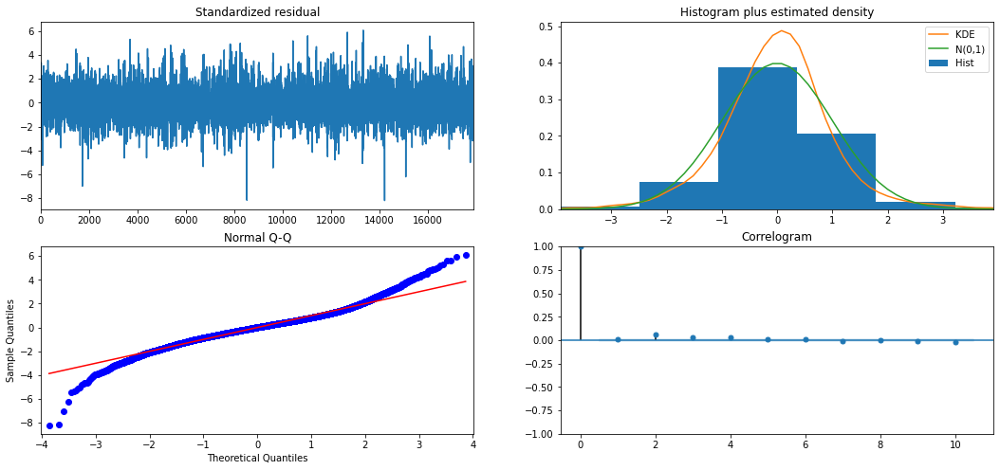

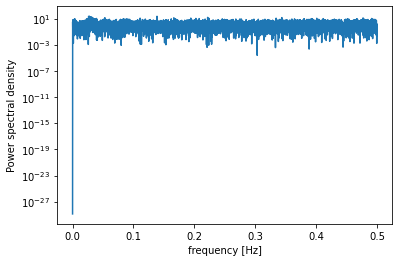

          freq        pow      delay
496   0.027688  22.725911  36.116935
2485  0.138718  22.172360   7.208853
473   0.026404  21.795864  37.873150
479   0.026739  20.332593  37.398747
541   0.030200  17.010304  33.112754
522   0.029139  16.450568  34.318008
538   0.030032  16.290788  33.297398
561   0.031316  15.734166  31.932264
3976  0.221949  15.221780   4.505533
578   0.032265  14.658134  30.993080
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 36)   Log Likelihood              -22849.810
Date:                            Sun, 15 Nov 2020   AIC                          45717.621
Time:                                    22:51:16   BIC                          45787.761
Sample:                                         0   HQIC                         45740.692
                                          - 179

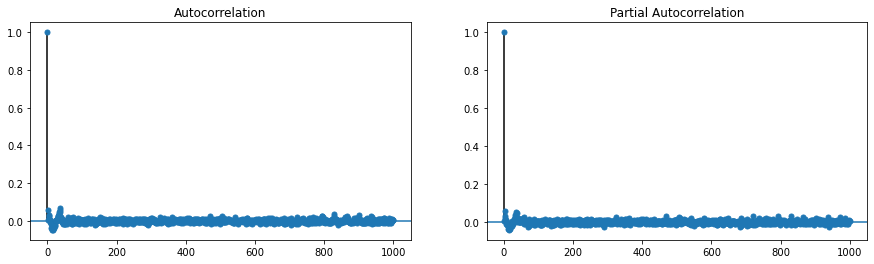

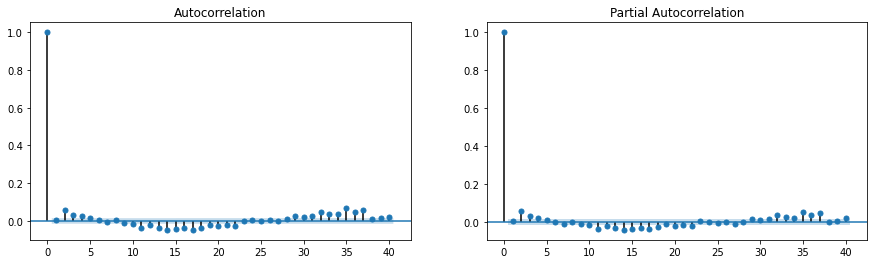

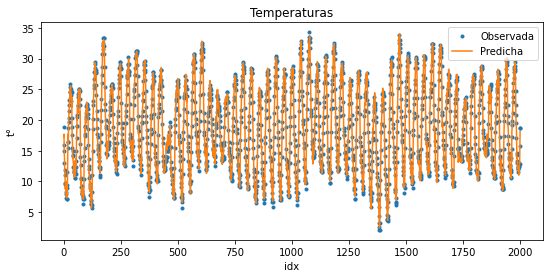

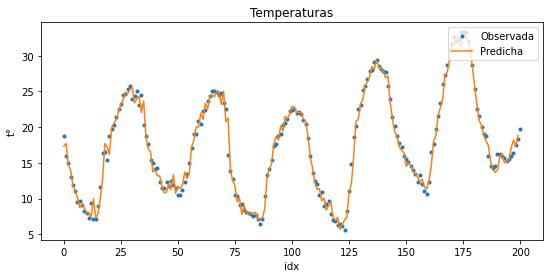

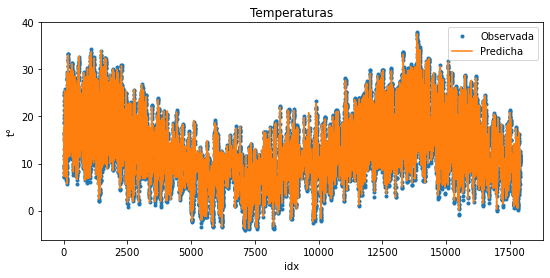

In [93]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora', 'Cos_Mes']])

Elegimos AR24h-MA24h, pero tiene problemas de convergencia, evaluamos que componente sinusoide retirar.

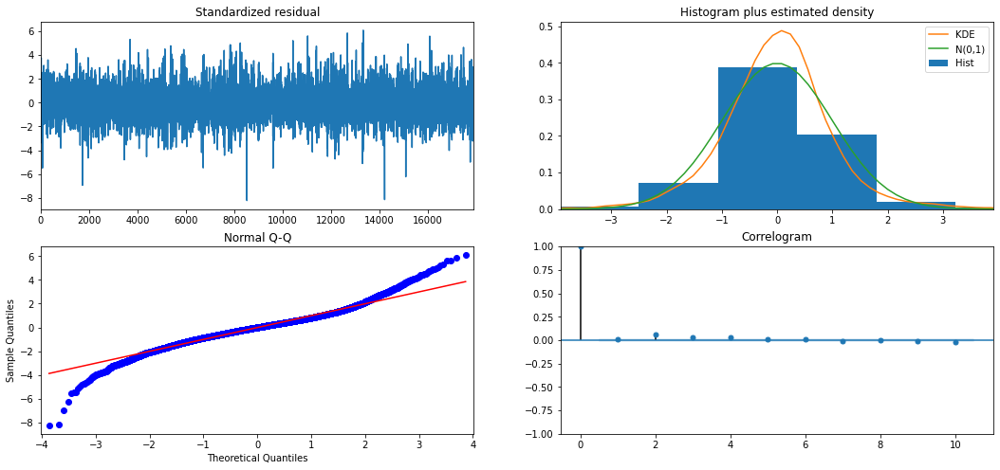

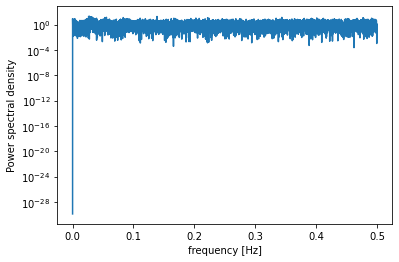

          freq        pow      delay
496   0.027688  21.710826  36.116935
473   0.026404  20.863989  37.873150
2485  0.138718  19.888897   7.208853
479   0.026739  18.726108  37.398747
541   0.030200  16.955360  33.112754
538   0.030032  16.643529  33.297398
522   0.029139  16.282127  34.318008
561   0.031316  15.643204  31.932264
578   0.032265  15.064477  30.993080
995   0.055543  14.702068  18.004020
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 36)   Log Likelihood              -22835.359
Date:                            Sun, 15 Nov 2020   AIC                          45686.718
Time:                                    22:56:11   BIC                          45749.065
Sample:                                         0   HQIC                         45707.225
                                          - 179

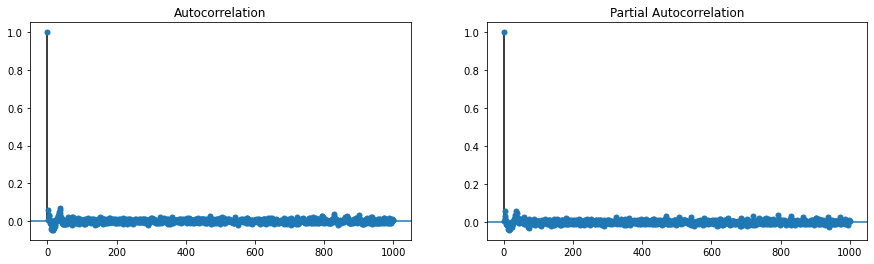

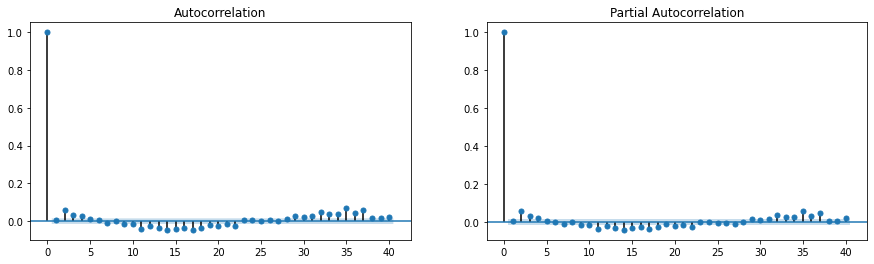

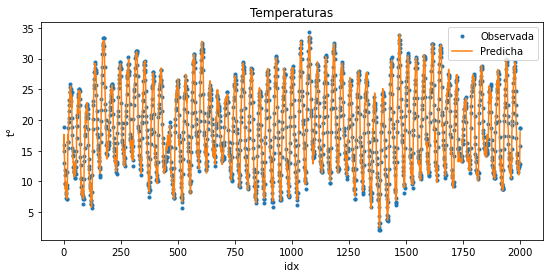

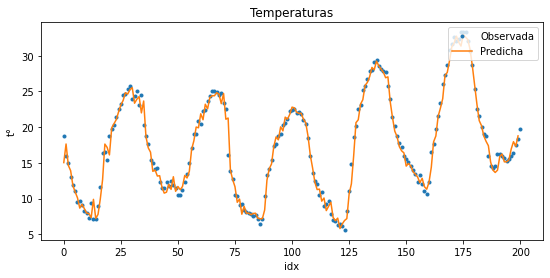

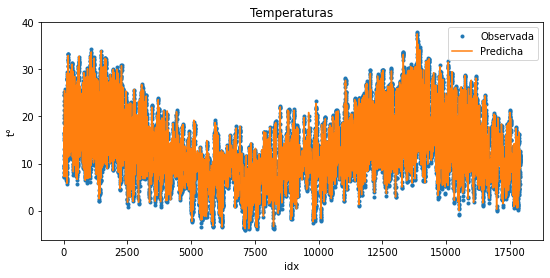

In [94]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


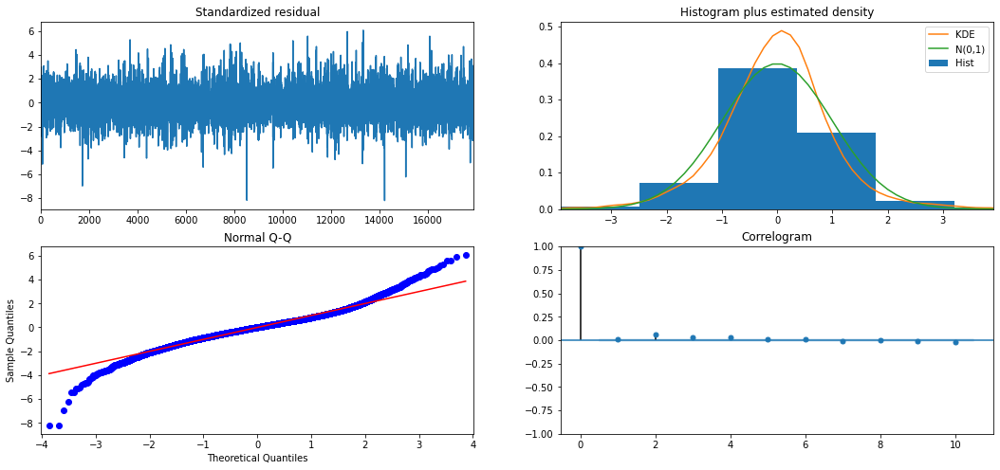

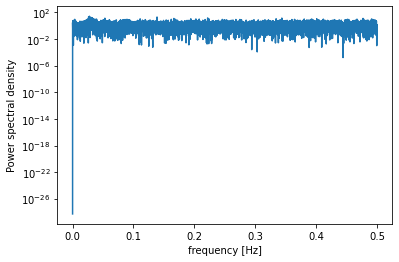

          freq        pow      delay
496   0.027688  26.783728  36.116935
473   0.026404  22.419687  37.873150
479   0.026739  21.900205  37.398747
2485  0.138718  20.378209   7.208853
538   0.030032  17.359654  33.297398
522   0.029139  17.340560  34.318008
541   0.030200  17.138359  33.112754
561   0.031316  15.279405  31.932264
578   0.032265  14.922131  30.993080
3976  0.221949  14.846781   4.505533
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 36)   Log Likelihood              -22865.241
Date:                            Sun, 15 Nov 2020   AIC                          45746.483
Time:                                    23:03:45   BIC                          45808.829
Sample:                                         0   HQIC                         45766.990
                                          - 179

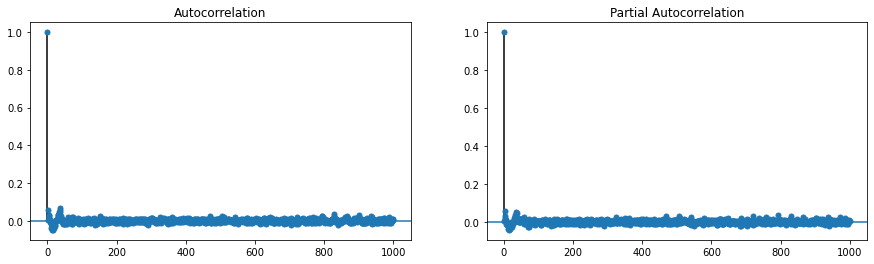

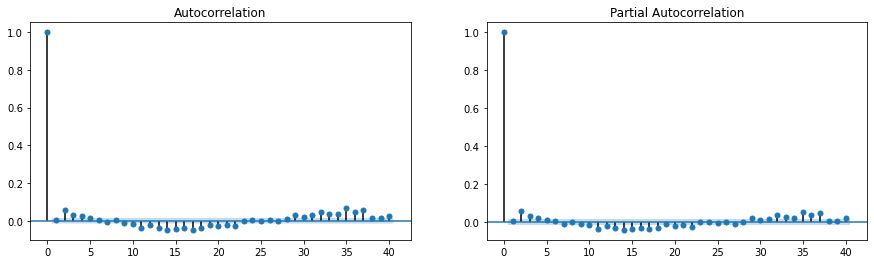

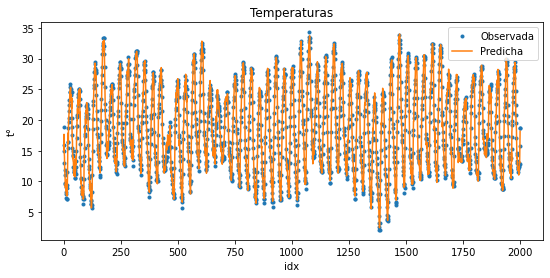

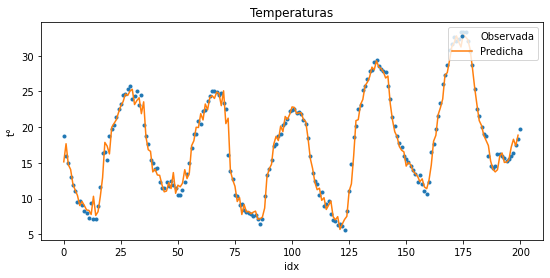

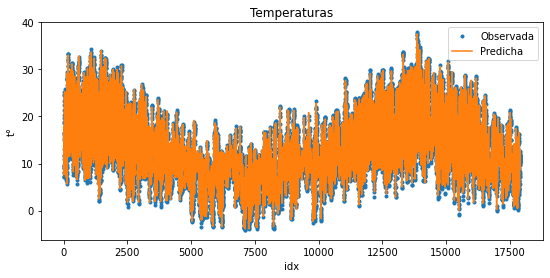

In [95]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_Mes']])

Evaluamos si agregar componentes AR2 o MA2 

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


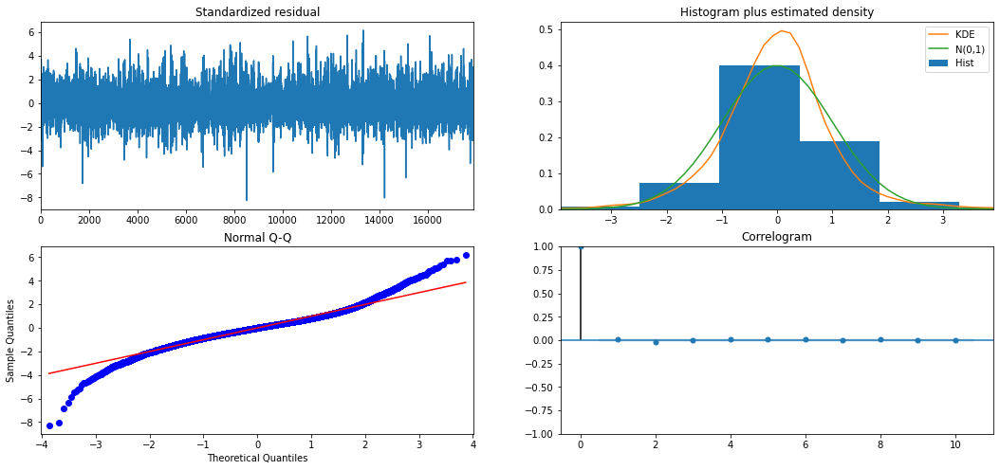

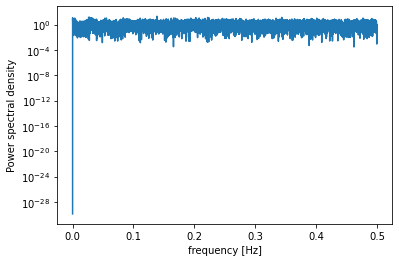

          freq        pow         delay
2485  0.138718  21.979588      7.208853
496   0.027688  15.326409     36.116935
473   0.026404  14.964739     37.873150
6158  0.343753  14.401099      2.909061
3976  0.221949  14.291231      4.505533
479   0.026739  13.406431     37.398747
3629  0.202579  12.994616      4.936346
1     0.000056  12.357051  17914.000000
1492  0.083287  12.296599     12.006702
4011  0.223903  12.269749      4.466218
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 36)   Log Likelihood              -22772.981
Date:                            Sun, 15 Nov 2020   AIC                          45563.962
Time:                                    23:12:13   BIC                          45634.102
Sample:                                         0   HQIC                         45587.032
              

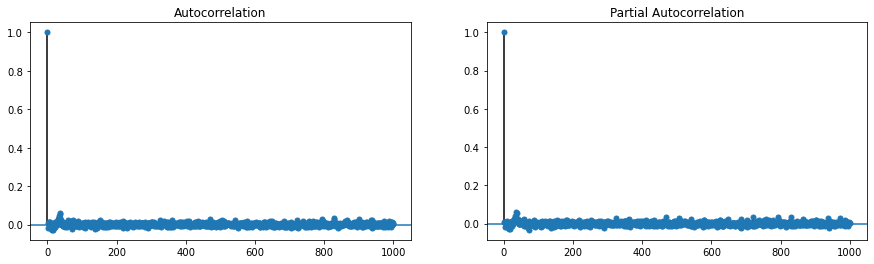

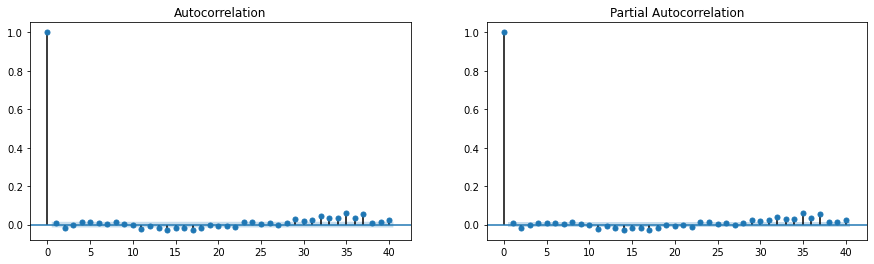

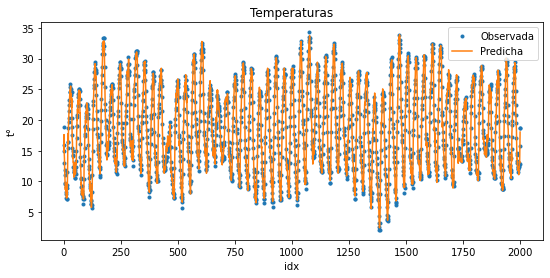

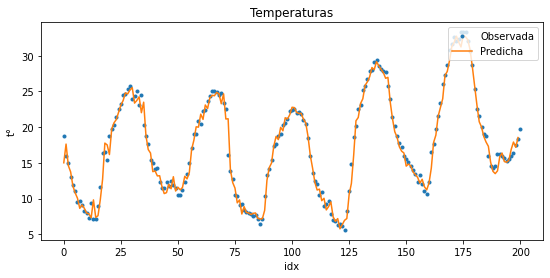

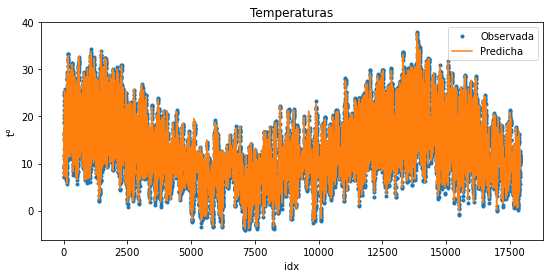

In [96]:
mysarimax(Y=Y_Ajuste,
         order=(2,0,1),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

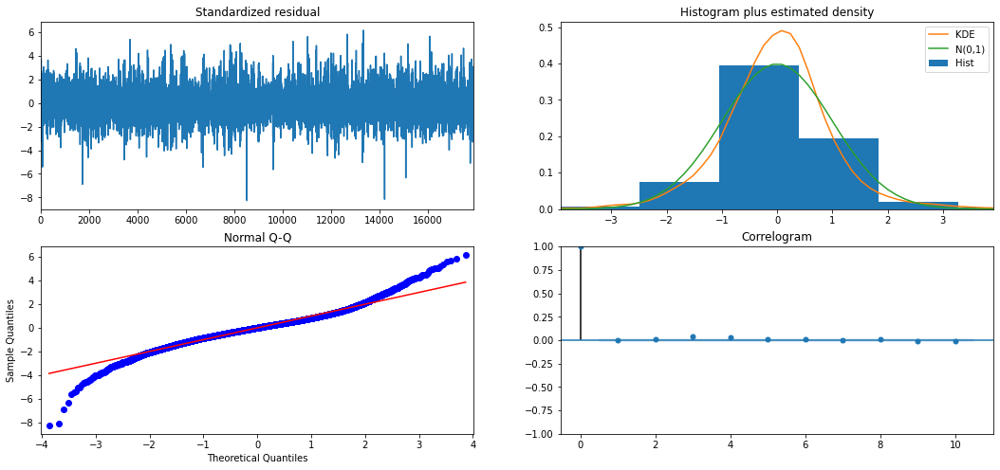

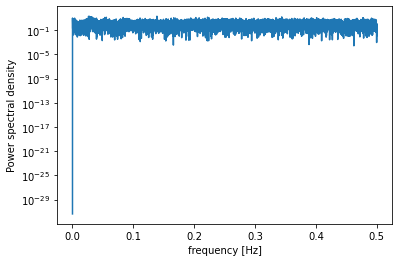

          freq        pow      delay
2485  0.138718  19.651445   7.208853
496   0.027688  19.247471  36.116935
473   0.026404  18.919316  37.873150
479   0.026739  16.968517  37.398747
541   0.030200  15.389530  33.112754
6158  0.343753  15.163411   2.909061
538   0.030032  15.054109  33.297398
522   0.029139  14.742238  34.318008
561   0.031316  14.192611  31.932264
3976  0.221949  13.661555   4.505533
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(1, 0, 2)x(1, 0, [1], 36)   Log Likelihood              -22805.899
Date:                              Sun, 15 Nov 2020   AIC                          45629.798
Time:                                      23:21:12   BIC                          45699.938
Sample:                                           0   HQIC                         45652.868
                                   

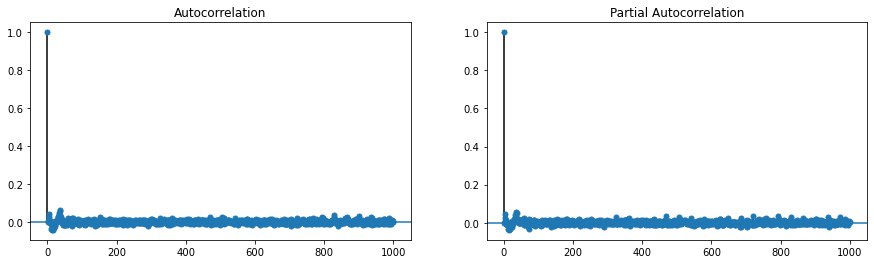

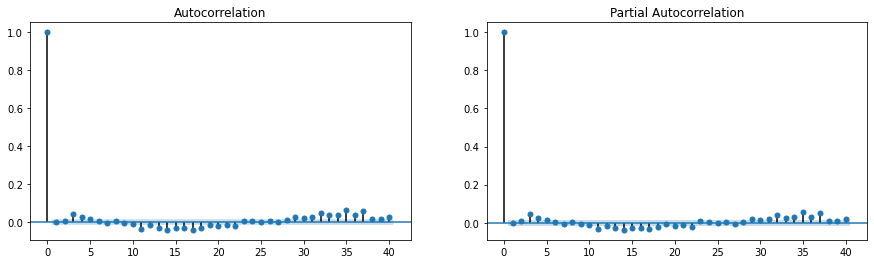

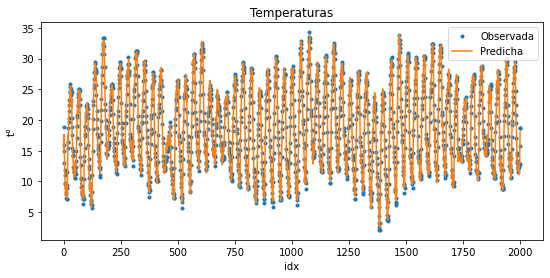

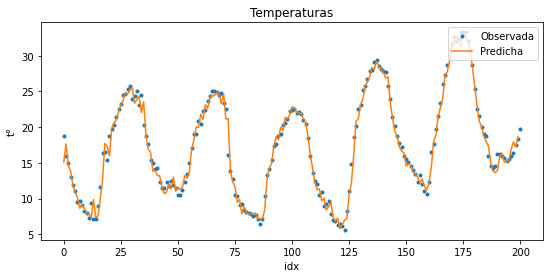

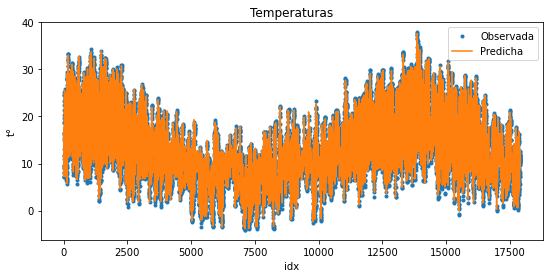

In [97]:
mysarimax(Y=Y_Ajuste,
         order=(1,0,2),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

Se selecciona el siguiente modelo:

In [35]:
Res2=mysarimax(Y=Y_Ajuste,
         order=(1,0,2),
         seasonal_order=(1,0,1,60*24/Intervalo),
         Matriz=IG_Ajuste.loc[:,['Sen_hora','Cos_hora']])

KeyboardInterrupt: 

Validamos: 

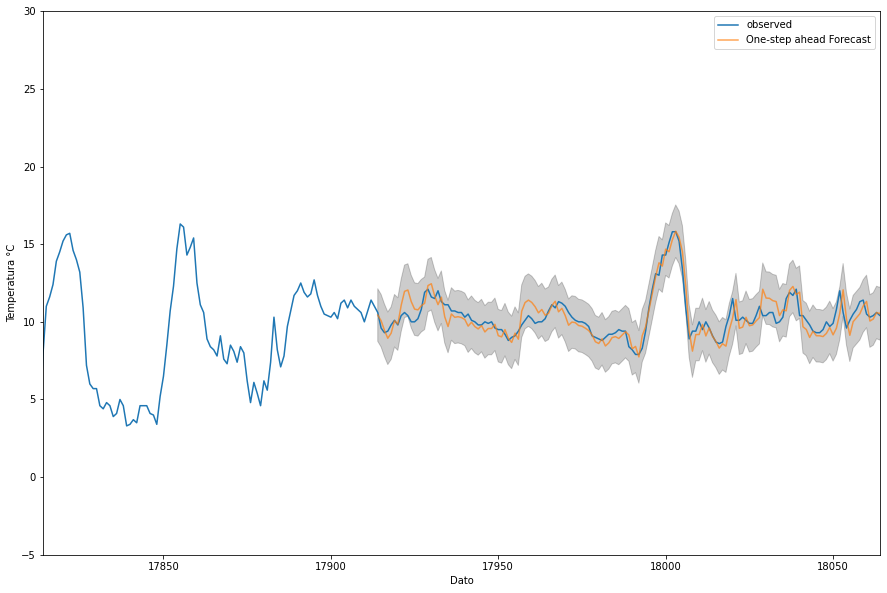

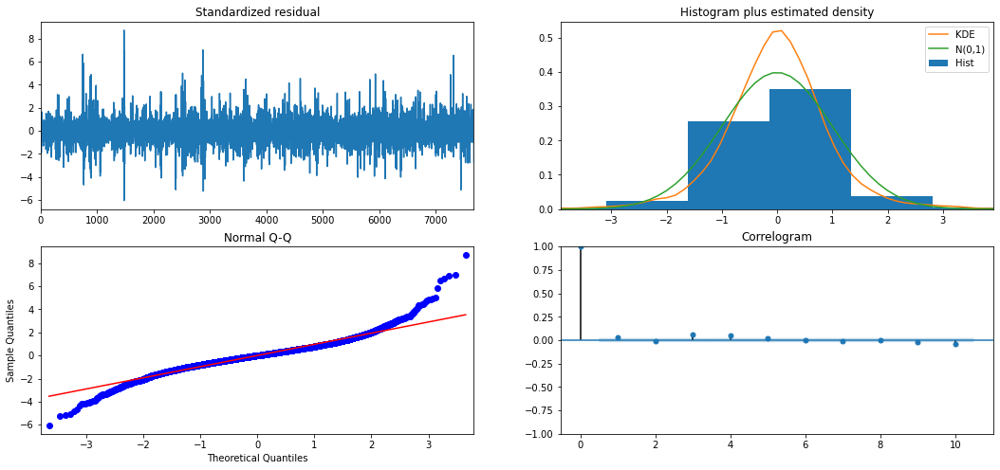

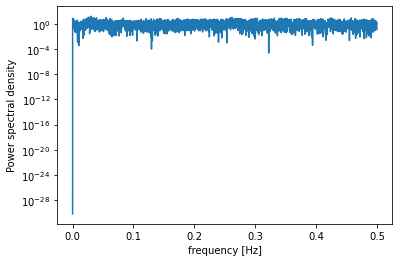

                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                 7677
Model:             SARIMAX(1, 0, 2)x(1, 0, [1], 36)   Log Likelihood               -9521.073
Date:                              Mon, 16 Nov 2020   AIC                          19060.147
Time:                                      23:17:32   BIC                          19122.661
Sample:                                           0   HQIC                         19081.588
                                             - 7677                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0100      0.001      7.428      0.000       0.007       0.013
Sen_hora      -4.06

(<statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper at 0x15a695f27f0>,
 <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x15a6960e130>)

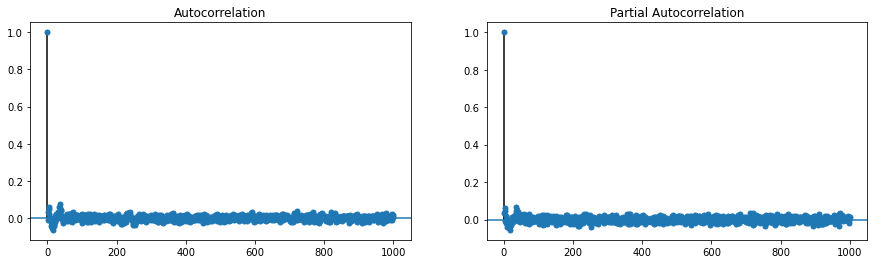

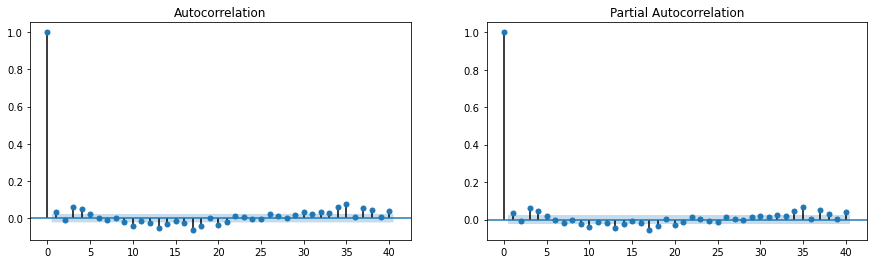

In [27]:
predecir_1(Res2,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17914  10.6  0.163155        False        False        False
17915   9.6 -0.473460        False        False        False
17916   9.3 -0.157170        False        False        False
17917   9.4  0.459342        False        False        False
17918   9.8  0.533515        False        False        False
...     ...       ...          ...          ...          ...
25586  31.9  0.453331        False        False        False
25587  31.8  0.643011        False        False        False
25588  31.8  1.002592         True        False        False
25589  30.9  0.679872        False        False        False
25590  26.4 -2.346774         True         True        False

[7677 rows x 5 columns]
Promedio Valor Absoluto Error: 0.5996432394567576
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    16.816465     3.022014      0.63827


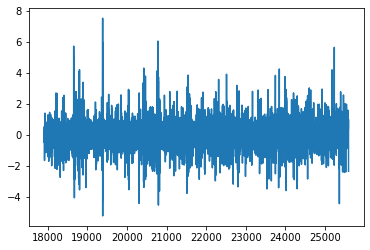

In [39]:
predecir_3(Res2,IG_Test.loc[:,['Sen_hora','Cos_hora']],Y_Test,limite)

Volvemos a comenzar con los modelos, pero esta vez, sin componentes sinusoides. 

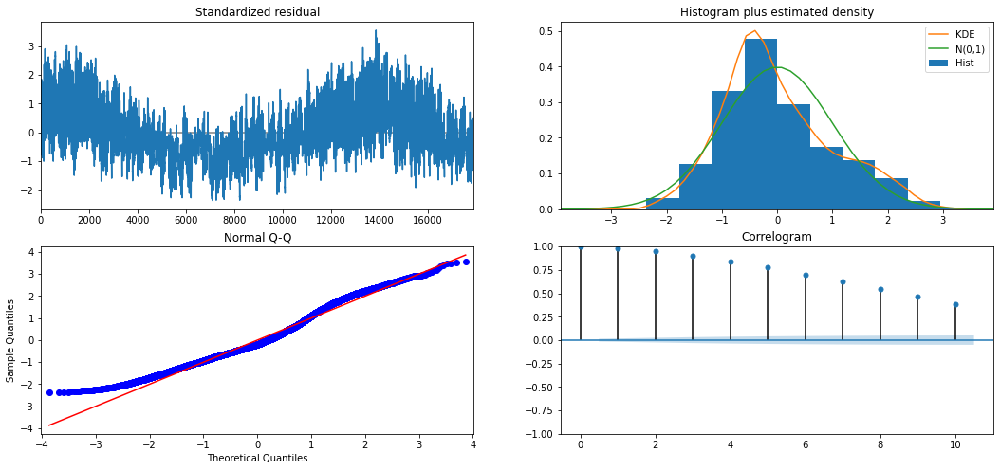

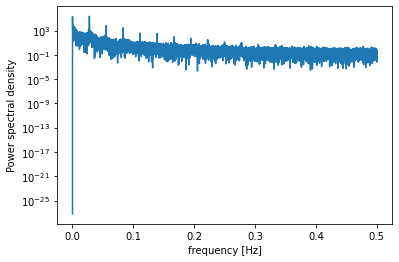

         freq            pow         delay
497  0.027744  228418.466063     36.044266
1    0.000056  184313.345797  17914.000000
2    0.000112   75913.068698   8957.000000
496  0.027688   45523.184279     36.116935
3    0.000167   43090.911350   5971.333333
499  0.027855   34105.294553     35.899800
498  0.027799   34034.275775     35.971888
4    0.000223   11137.927799   4478.500000
500  0.027911   10960.268268     35.828000
12   0.000670    8098.078531   1492.833333
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:                        SARIMAX   Log Likelihood              -60538.649
Date:                Sun, 15 Nov 2020   AIC                         121081.298
Time:                        23:31:16   BIC                         121096.885
Sample:                             0   HQIC                        121086.425
                              - 17914                

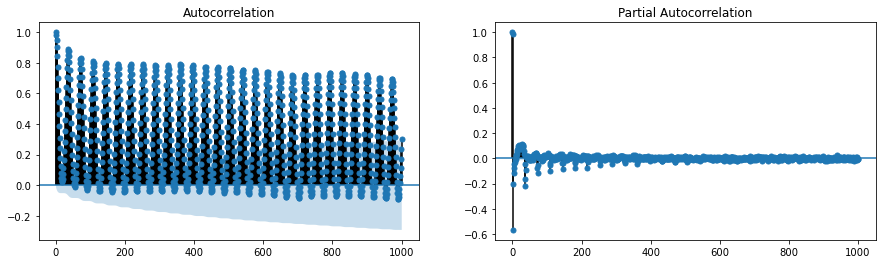

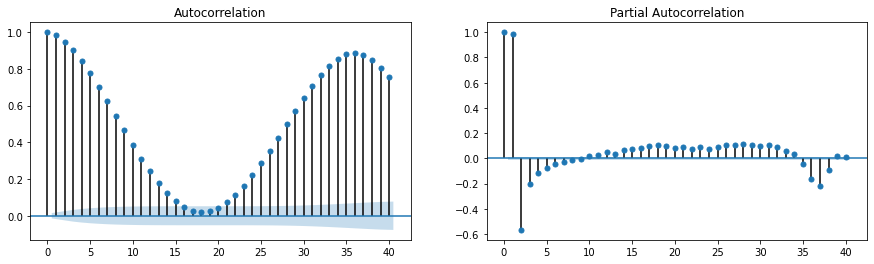

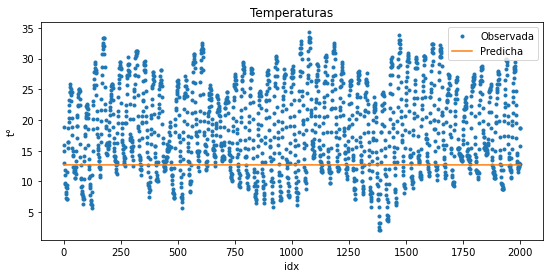

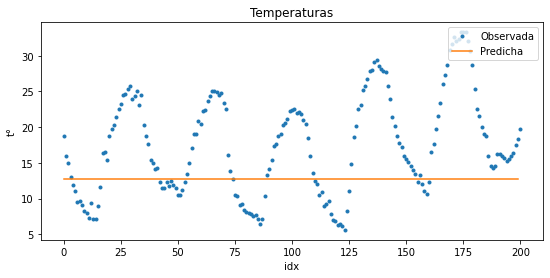

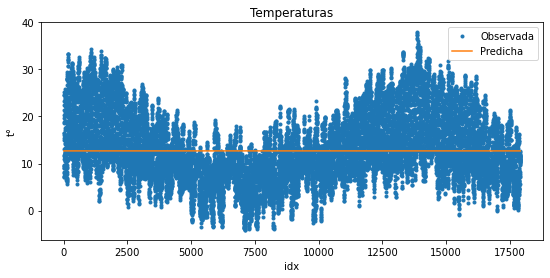

In [101]:
mysarima(Y=Y_Ajuste,
         order=(0,0,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

Se agrega componente diferencial, por los elevados valores de la densidad espectral. 

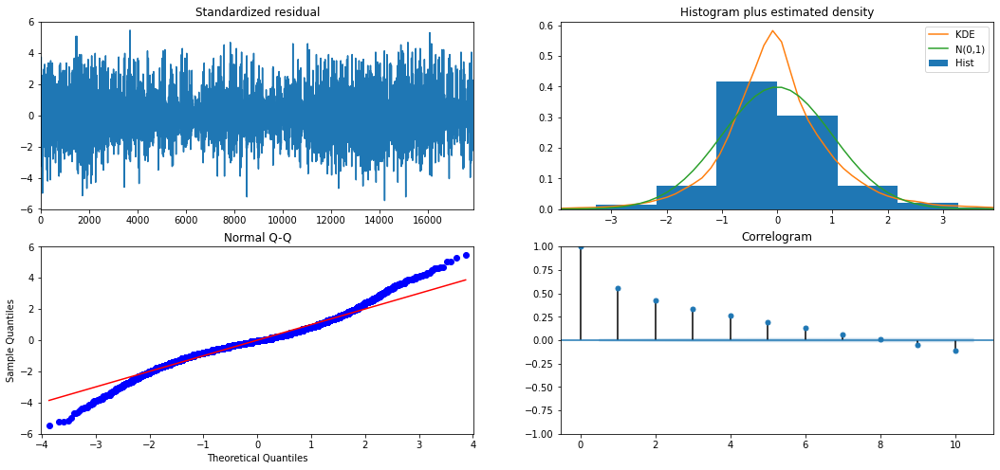

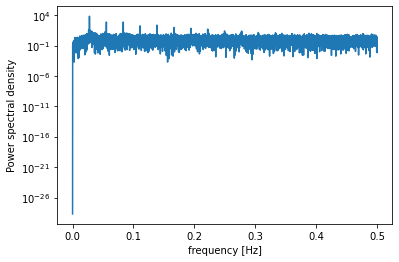

          freq          pow      delay
497   0.027744  6907.226431  36.044266
496   0.027688  1365.756365  36.116935
499   0.027855  1045.335269  35.899800
498   0.027799  1042.782135  35.971888
995   0.055543   777.732164  18.004020
1492  0.083287   762.697094  12.006702
500   0.027911   338.274577  35.828000
2485  0.138718   235.723874   7.208853
994   0.055487   217.641494  18.022133
2488  0.138886   187.087105   7.200161
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -29864.780
Date:                Sun, 15 Nov 2020   AIC                          59733.560
Time:                        23:31:31   BIC                          59749.147
Sample:                             0   HQIC                         59738.687
                              - 17914                                         
Covariance Type:  

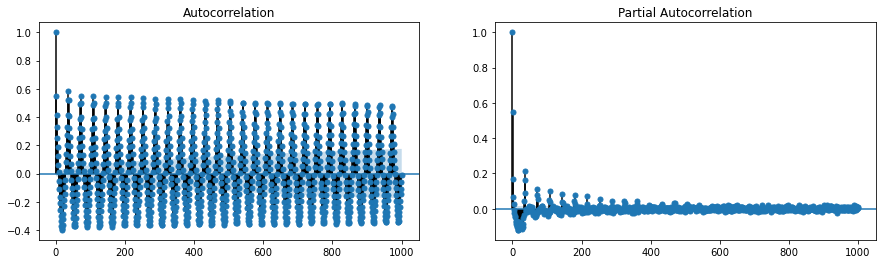

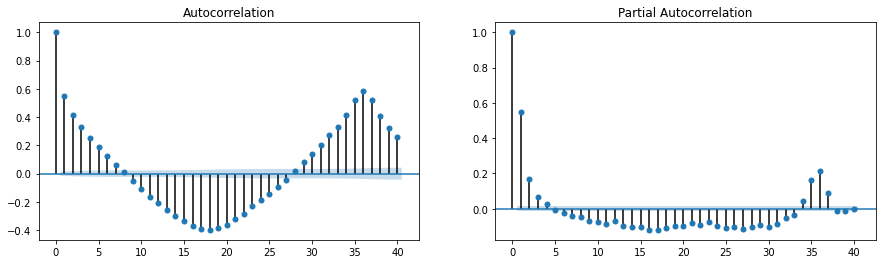

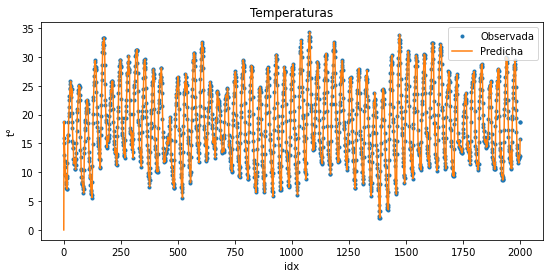

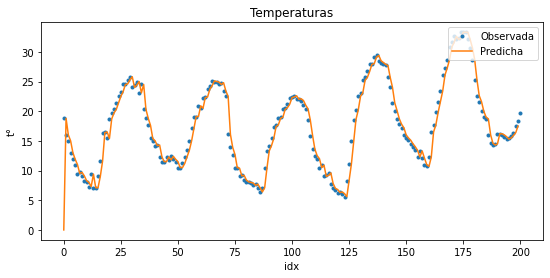

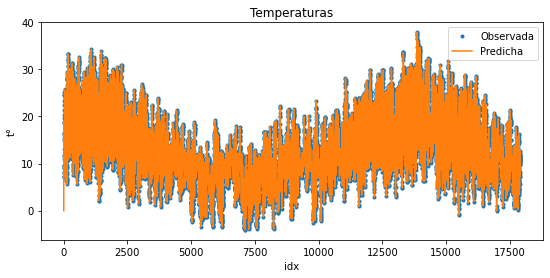

In [102]:
mysarima(Y=Y_Ajuste,
         order=(0,1,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

Vemos el efecto de agregar componente AR y MA 1

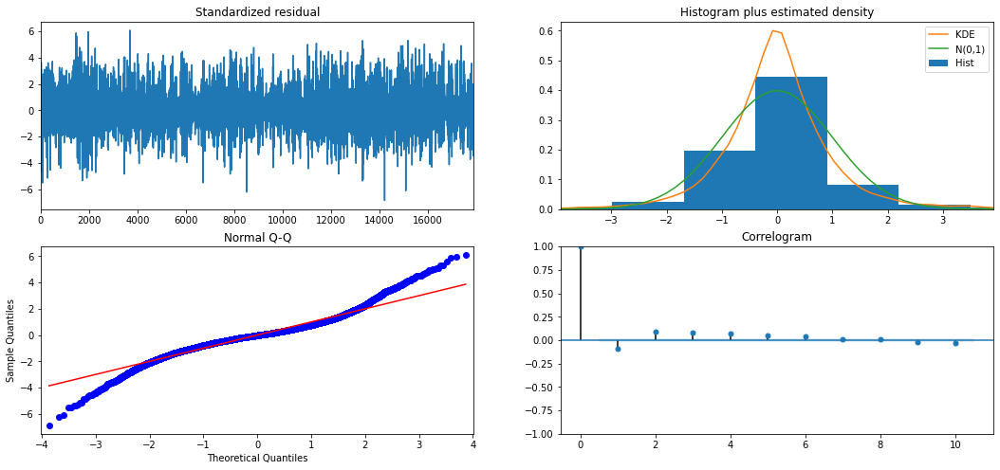

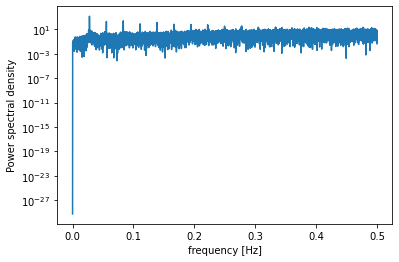

          freq          pow      delay
497   0.027744  1484.027868  36.044266
496   0.027688   291.081972  36.116935
1492  0.083287   262.266991  12.006702
498   0.027799   227.242908  35.971888
499   0.027855   225.671050  35.899800
995   0.055543   204.542962  18.004020
2485  0.138718   142.146617   7.208853
2488  0.138886   110.959482   7.200161
1989  0.111030    83.625412   9.006536
500   0.027911    73.203085  35.828000
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -26578.812
Date:                Sun, 15 Nov 2020   AIC                          53163.625
Time:                        23:31:46   BIC                          53187.004
Sample:                             0   HQIC                         53171.315
                              - 17914                                         
Covariance Type:  

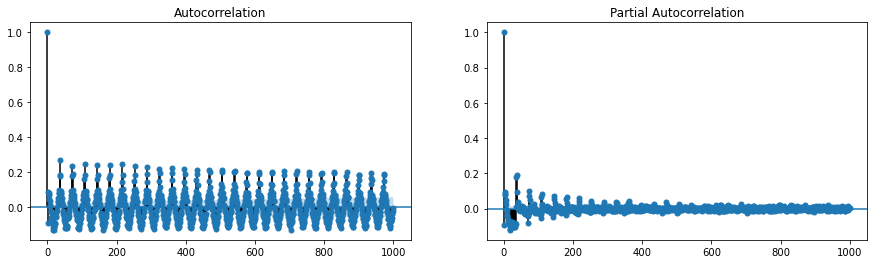

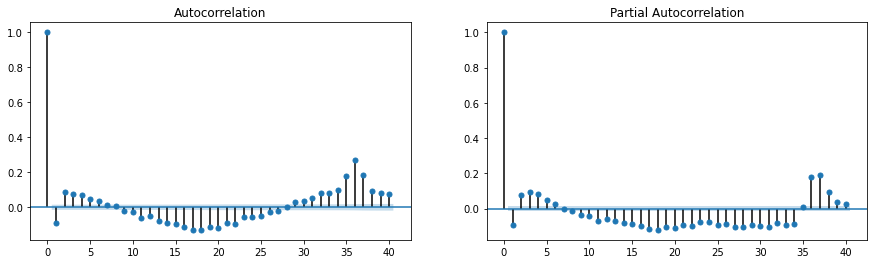

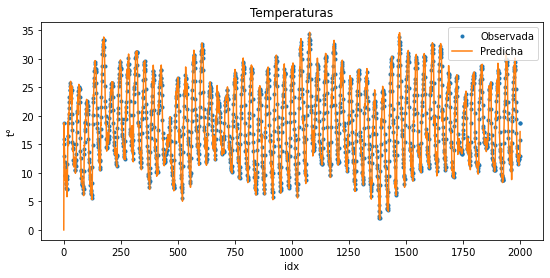

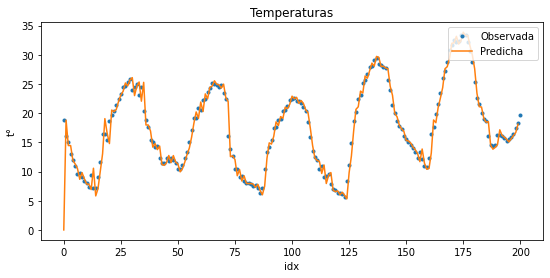

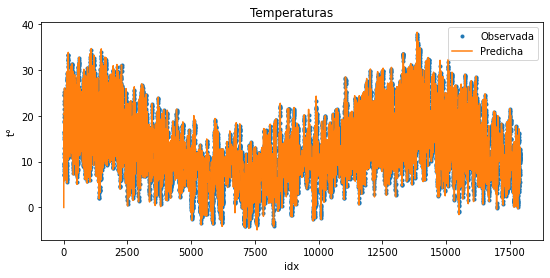

In [103]:
mysarima(Y=Y_Ajuste,
         order=(1,1,0),
         seasonal_order=(0,0,0,60*24/Intervalo))

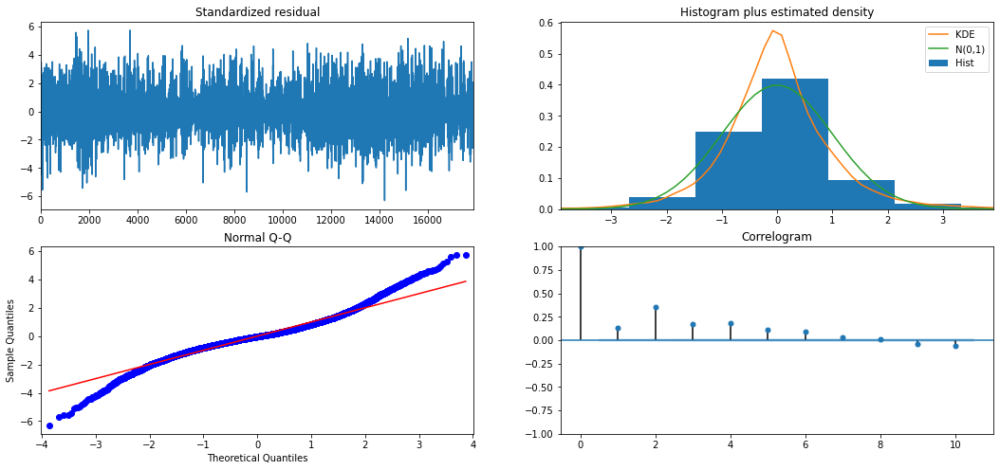

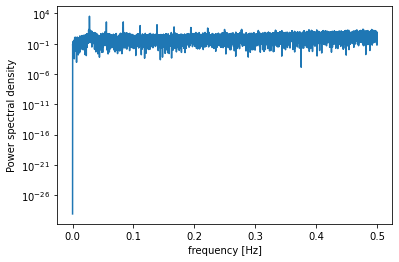

          freq          pow      delay
497   0.027744  3480.382407  36.044266
496   0.027688   686.333231  36.116935
498   0.027799   528.367020  35.971888
499   0.027855   528.164235  35.899800
1492  0.083287   402.622687  12.006702
995   0.055543   397.950120  18.004020
500   0.027911   171.163013  35.828000
2485  0.138718   139.191166   7.208853
994   0.055487   113.003051  18.022133
2488  0.138886   109.211948   7.200161
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(0, 1, 1)   Log Likelihood              -27692.877
Date:                Sun, 15 Nov 2020   AIC                          55391.755
Time:                        23:32:02   BIC                          55415.135
Sample:                             0   HQIC                         55399.445
                              - 17914                                         
Covariance Type:  

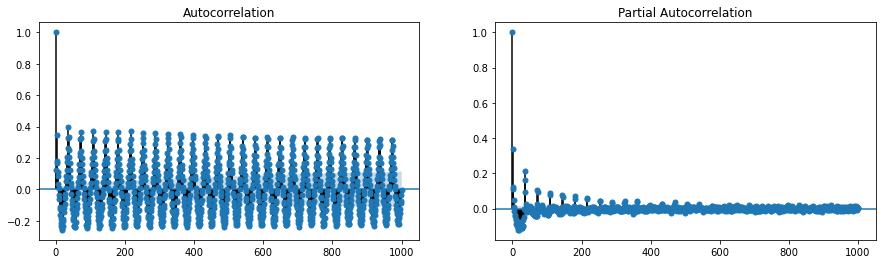

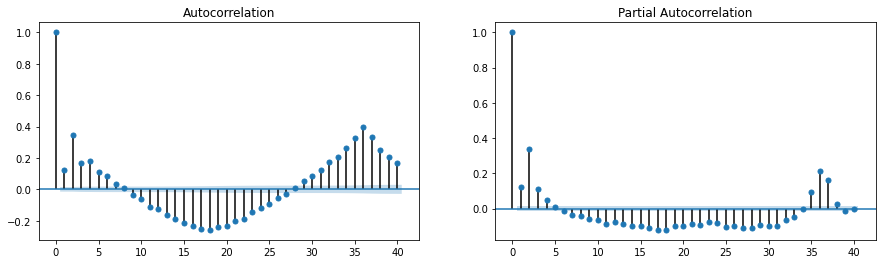

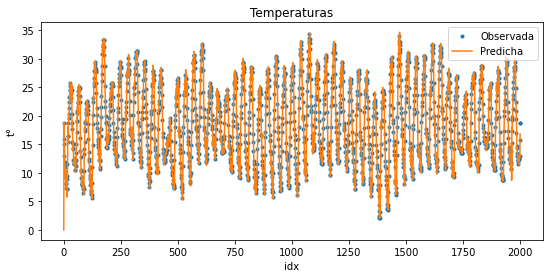

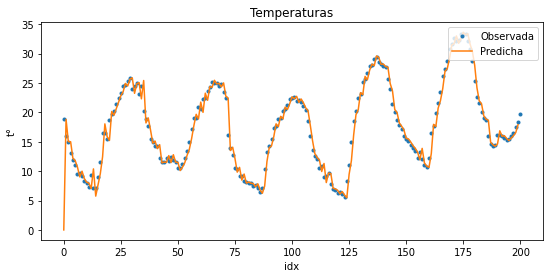

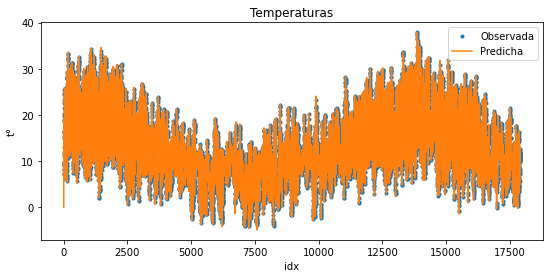

In [104]:
mysarima(Y=Y_Ajuste,
         order=(0,1,1),
         seasonal_order=(0,0,0,60*24/Intervalo))

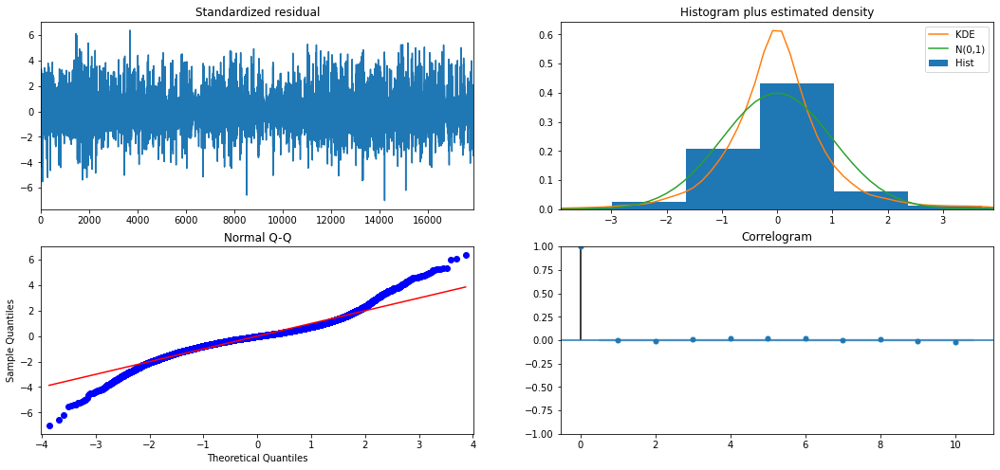

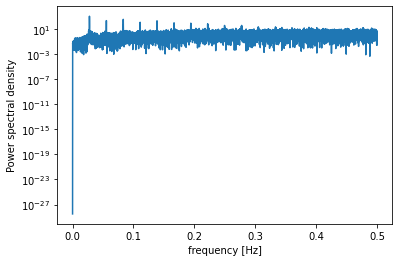

          freq          pow      delay
497   0.027744  1124.210461  36.044266
1492  0.083287   357.686495  12.006702
995   0.055543   225.290523  18.004020
496   0.027688   219.872945  36.116935
2485  0.138718   207.715960   7.208853
498   0.027799   172.145343  35.971888
499   0.027855   170.165962  35.899800
2488  0.138886   163.119806   7.200161
1989  0.111030   121.896492   9.006536
1988  0.110975   105.790030   9.011066
                               SARIMAX Results                                
Dep. Variable:                     ts   No. Observations:                17914
Model:               SARIMAX(1, 1, 1)   Log Likelihood              -26291.344
Date:                Sun, 15 Nov 2020   AIC                          52590.688
Time:                        23:32:19   BIC                          52621.861
Sample:                             0   HQIC                         52600.941
                              - 17914                                         
Covariance Type:  

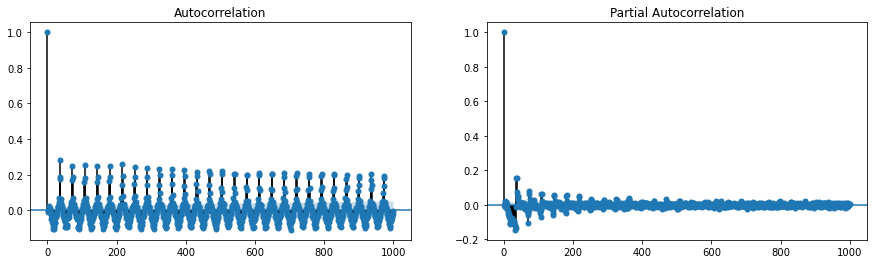

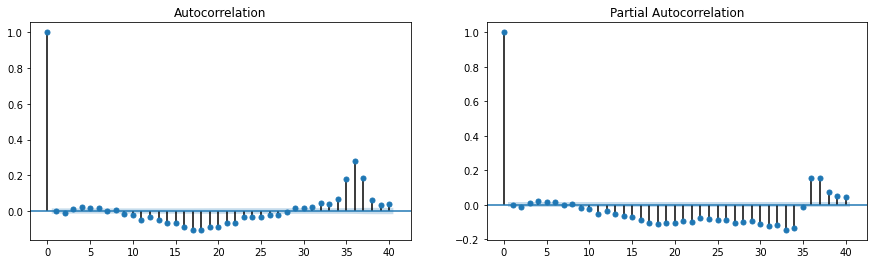

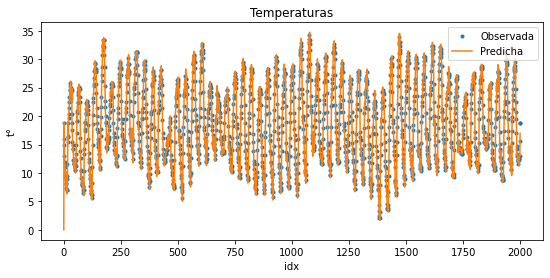

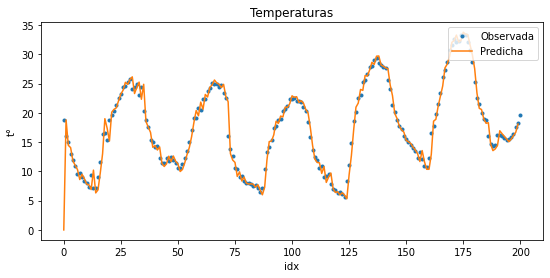

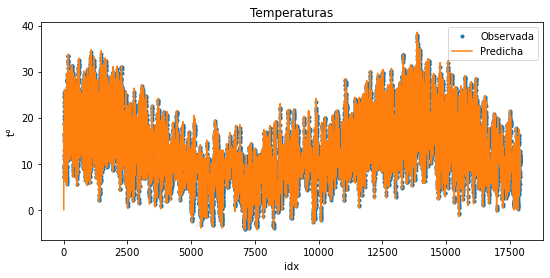

In [105]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,0,60*24/Intervalo))

Por los valores de acf y pacf vemos el efecto de agregar componente de retraso 24 horas.  

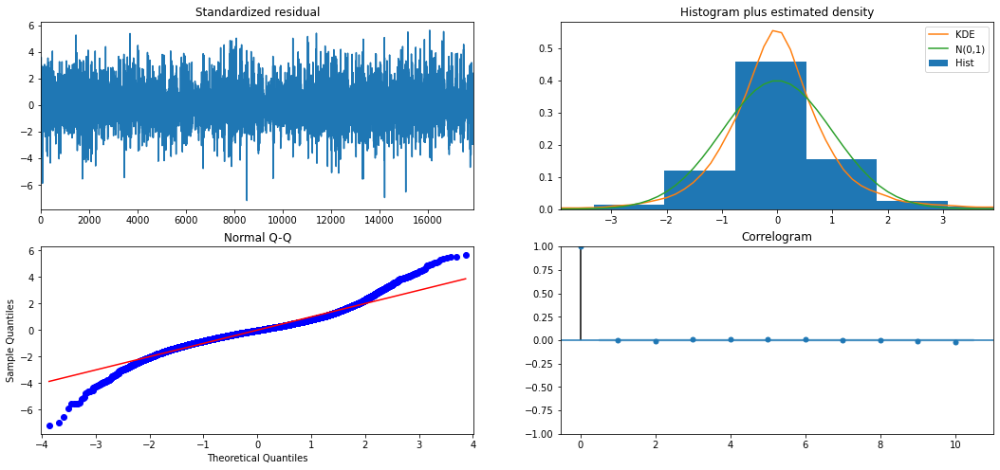

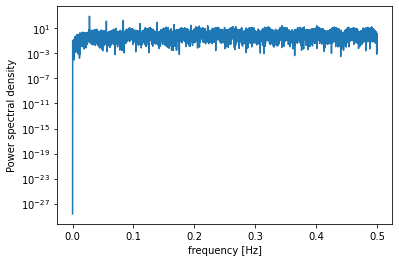

          freq         pow      delay
497   0.027744  816.464336  36.044266
1492  0.083287  180.232550  12.006702
496   0.027688  159.084913  36.116935
995   0.055543  132.864867  18.004020
498   0.027799  126.396012  35.971888
499   0.027855  124.482054  35.899800
2485  0.138718   85.422990   7.208853
2488  0.138886   66.465001   7.200161
1989  0.111030   56.083672   9.006536
1988  0.110975   48.941551   9.011066
                                      SARIMAX Results                                      
Dep. Variable:                                  ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 36)   Log Likelihood              -25286.696
Date:                             Sun, 15 Nov 2020   AIC                          50583.391
Time:                                     23:34:10   BIC                          50622.358
Sample:                                          0   HQIC                         50596.208
                              

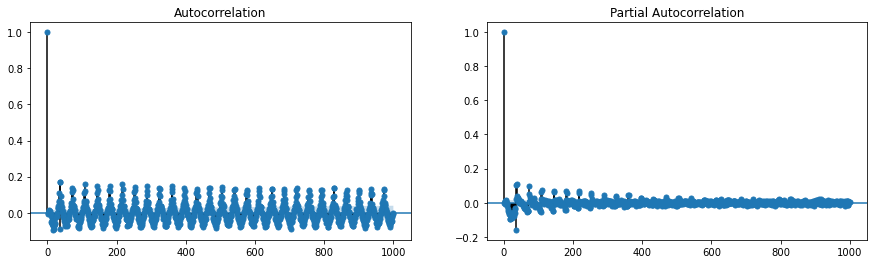

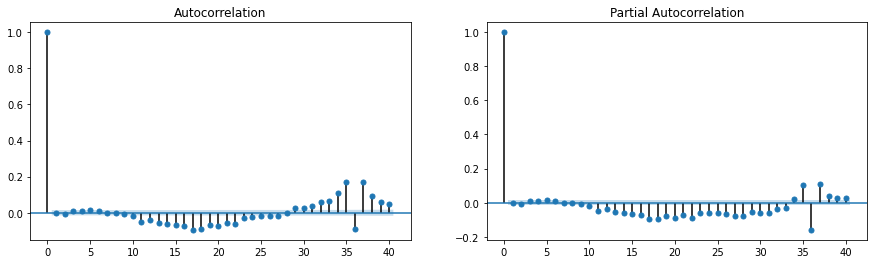

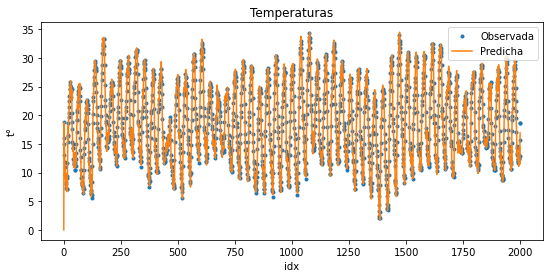

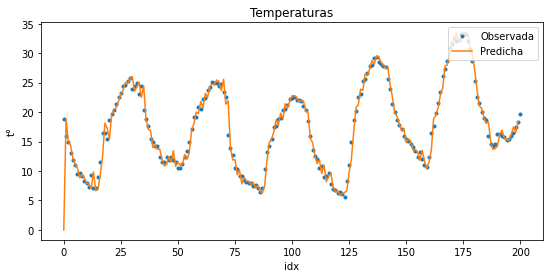

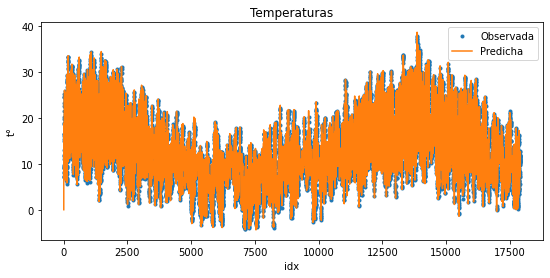

In [106]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,0,60*24/Intervalo))

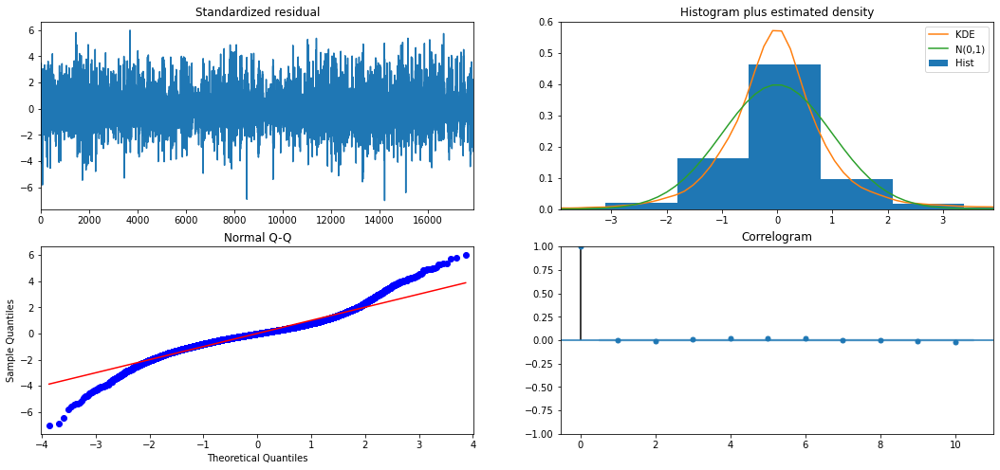

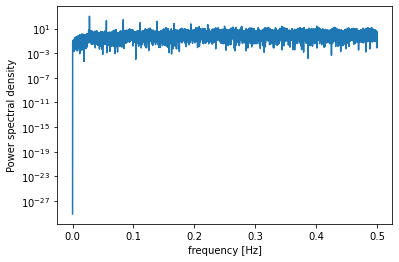

          freq         pow      delay
497   0.027744  979.232687  36.044266
1492  0.083287  268.727686  12.006702
496   0.027688  191.233551  36.116935
995   0.055543  180.588233  18.004020
498   0.027799  150.622424  35.971888
499   0.027855  148.709619  35.899800
2485  0.138718  141.649874   7.208853
2488  0.138886  110.901093   7.200161
1989  0.111030   87.610625   9.006536
1988  0.110975   76.221576   9.011066
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 1)x(0, 0, 1, 36)   Log Likelihood              -25662.288
Date:                            Sun, 15 Nov 2020   AIC                          51334.576
Time:                                    23:35:56   BIC                          51373.542
Sample:                                         0   HQIC                         51347.393
                                    

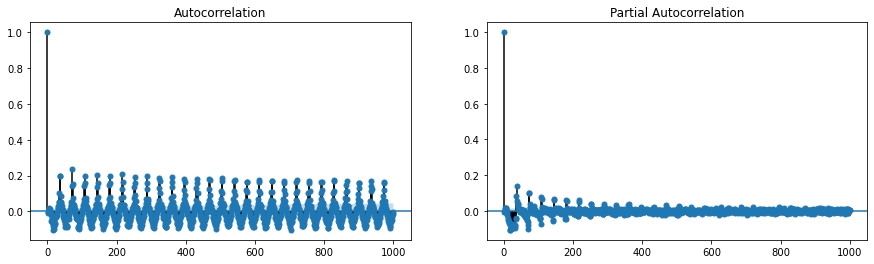

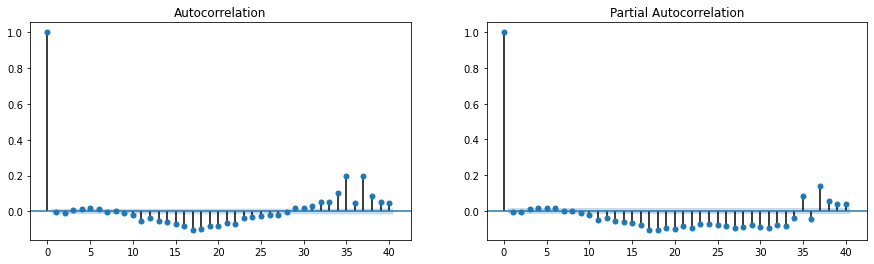

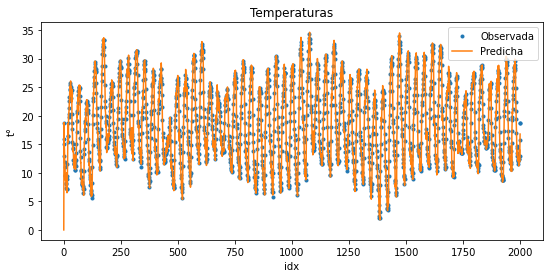

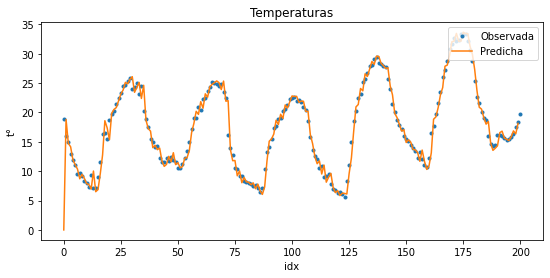

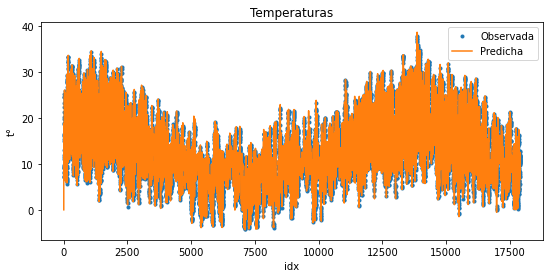

In [107]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(0,0,1,60*24/Intervalo))

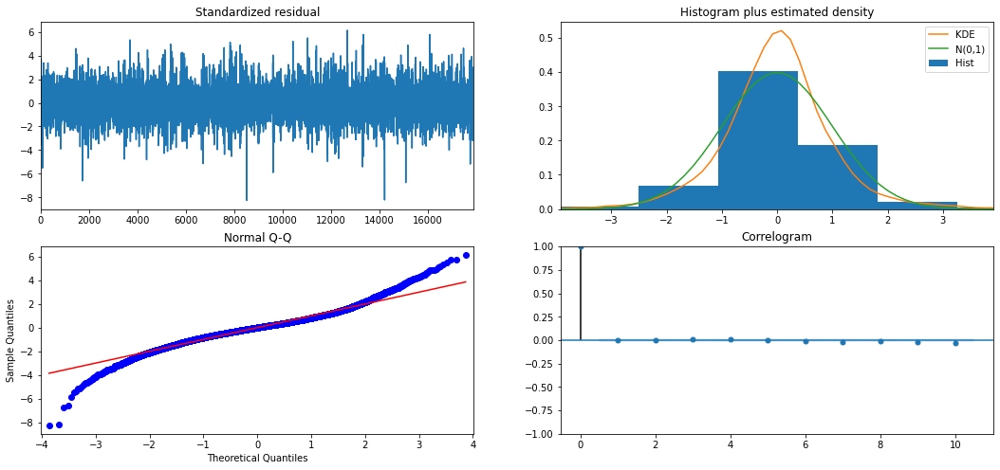

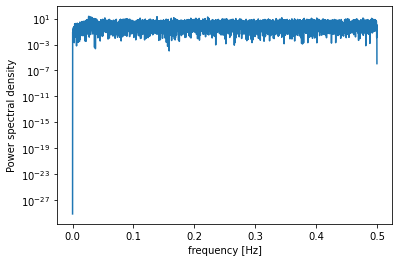

          freq        pow      delay
479   0.026739  23.791592  37.398747
473   0.026404  20.685609  37.873150
2485  0.138718  20.538224   7.208853
497   0.027744  18.493687  36.044266
3976  0.221949  18.231224   4.505533
541   0.030200  17.557046  33.112754
496   0.027688  17.092520  36.116935
538   0.030032  16.337118  33.297398
522   0.029139  16.109635  34.318008
578   0.032265  15.091441  30.993080
                                     SARIMAX Results                                      
Dep. Variable:                                 ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 36)   Log Likelihood              -23094.141
Date:                            Sun, 15 Nov 2020   AIC                          46200.283
Time:                                    23:41:42   BIC                          46247.043
Sample:                                         0   HQIC                         46215.663
                                          - 179

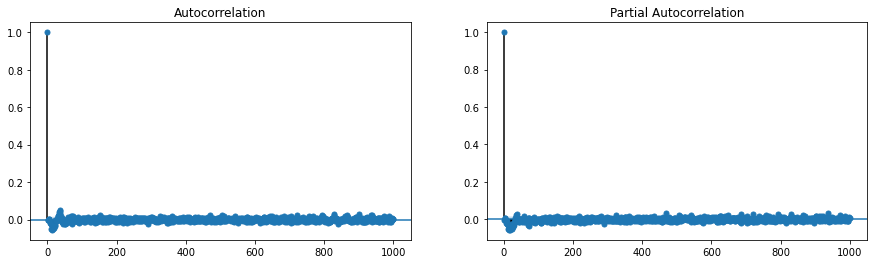

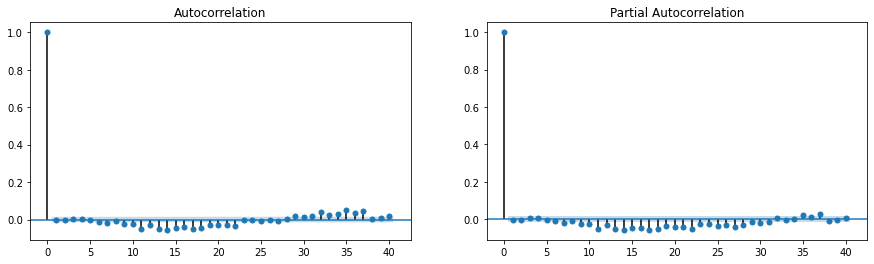

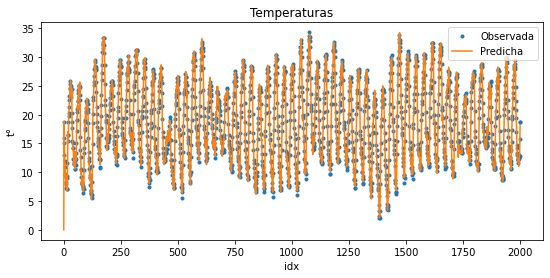

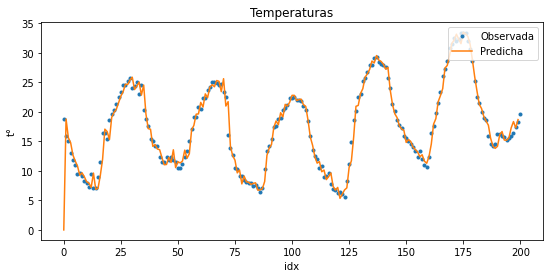

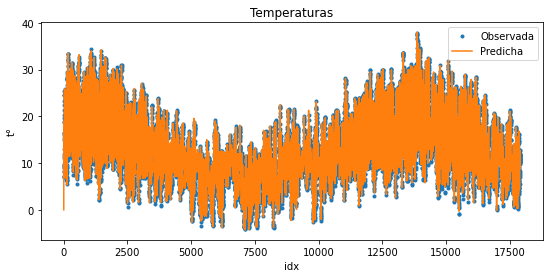

In [108]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(1,0,1,60*24/Intervalo))

Ahora, corroboramos el efecto de agregar componentes de 12 horas de retraso, buscando reducir más las correlaciones de acf y pacf. 

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


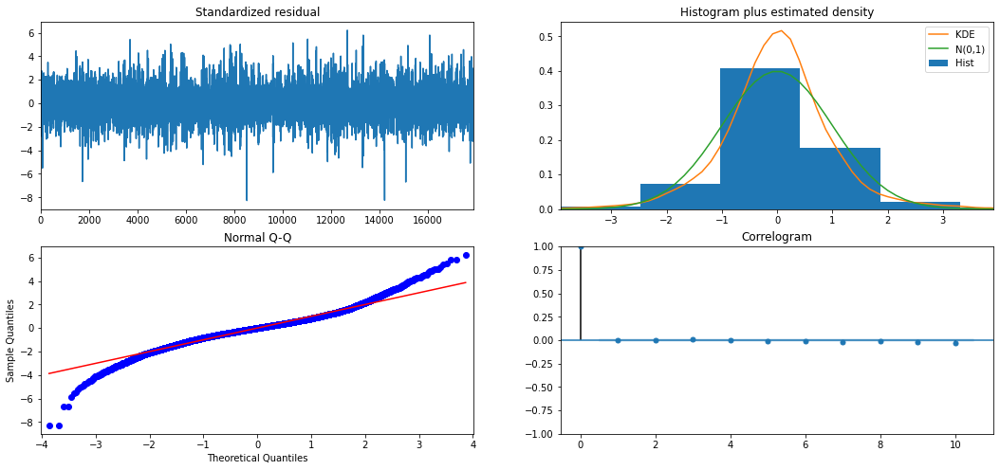

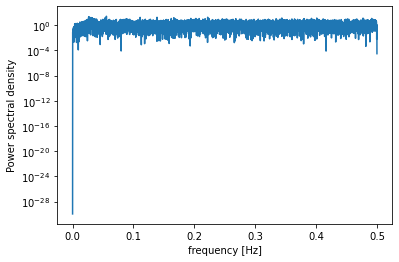

          freq        pow      delay
995   0.055543  25.555262  18.004020
479   0.026739  21.155273  37.398747
473   0.026404  18.409099  37.873150
3976  0.221949  17.818382   4.505533
2485  0.138718  17.366534   7.208853
1988  0.110975  16.787023   9.011066
496   0.027688  16.295505  36.116935
541   0.030200  15.790931  33.112754
538   0.030032  15.612629  33.297398
2981  0.166406  14.816896   6.009393
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -23087.448
Date:                                 Sun, 15 Nov 2020   AIC                          46190.895
Time:                                         23:49:56   BIC                          46253.242
Sample:                                              0   HQIC                         46211.402
                 

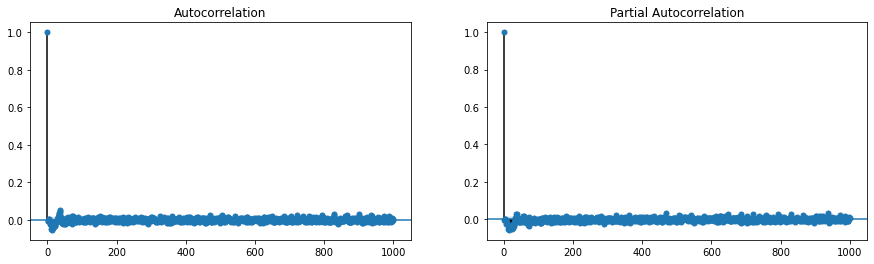

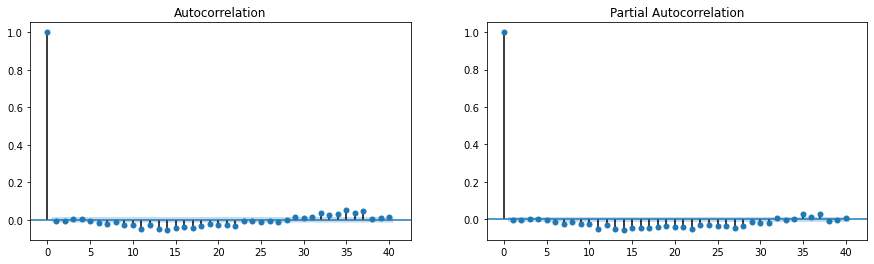

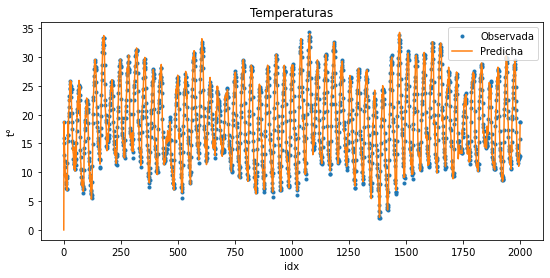

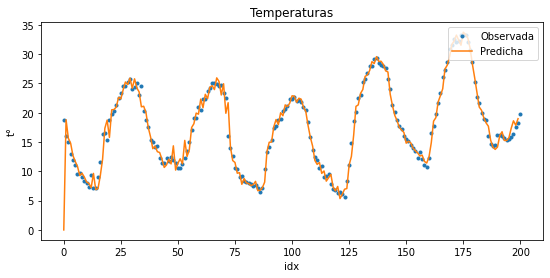

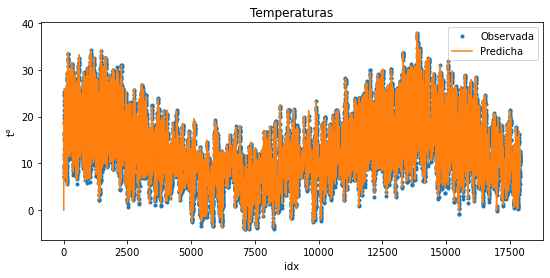

In [109]:
mysarima(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo))

Se tienen problemas de convergencia, se quita la componente menos significativa. 

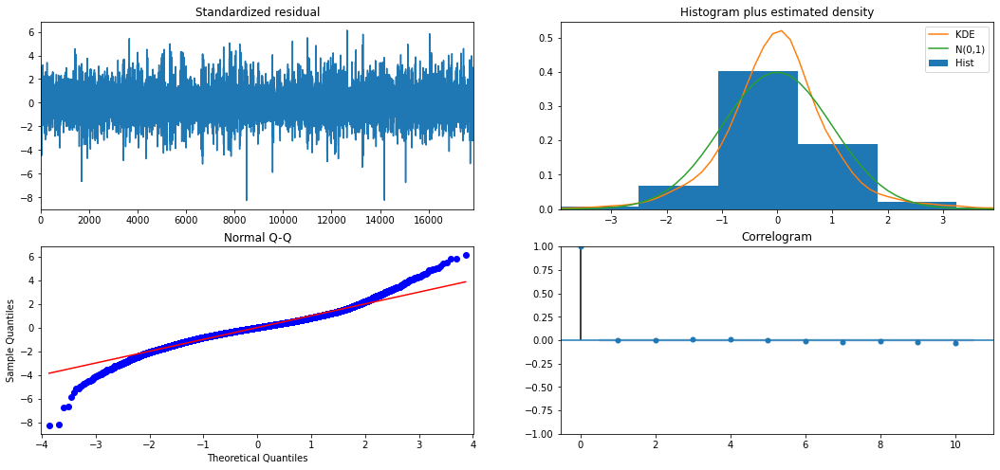

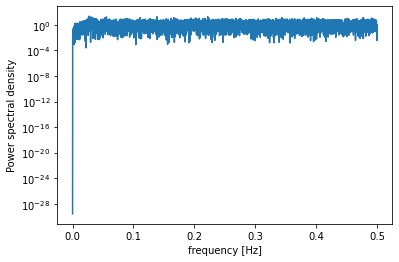

          freq        pow      delay
479   0.026739  22.436518  37.398747
473   0.026404  19.721888  37.873150
2485  0.138718  18.621756   7.208853
3976  0.221949  18.602379   4.505533
995   0.055543  17.822995  18.004020
541   0.030200  16.549974  33.112754
538   0.030032  14.972909  33.297398
561   0.031316  14.489429  31.932264
578   0.032265  14.211586  30.993080
522   0.029139  14.093857  34.318008
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -23020.966
Date:                                 Sun, 15 Nov 2020   AIC                          46055.933
Time:                                         23:56:27   BIC                          46110.471
Sample:                                              0   HQIC                         46073.873
                 

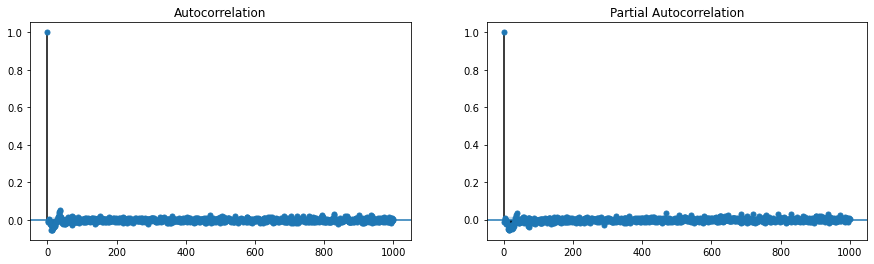

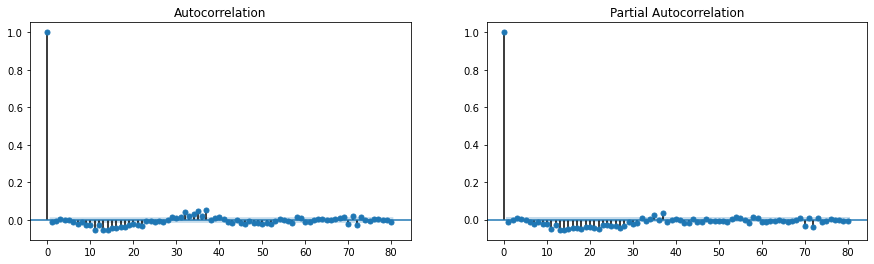

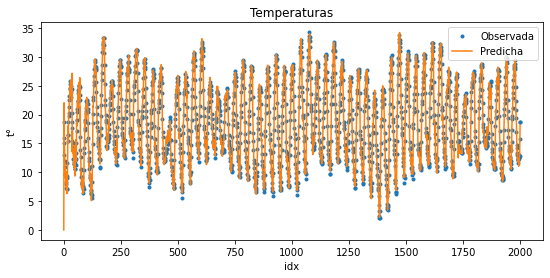

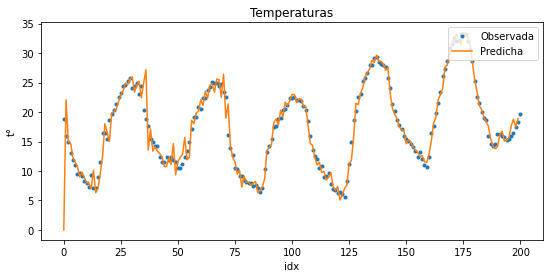

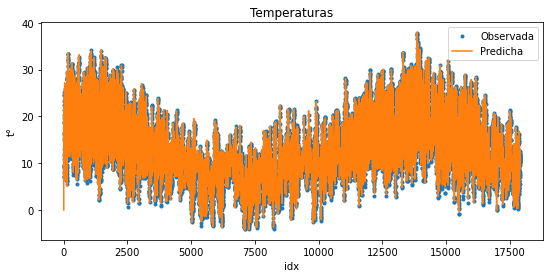

In [110]:
mysarima2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

Se elige el modelo siguiente: 

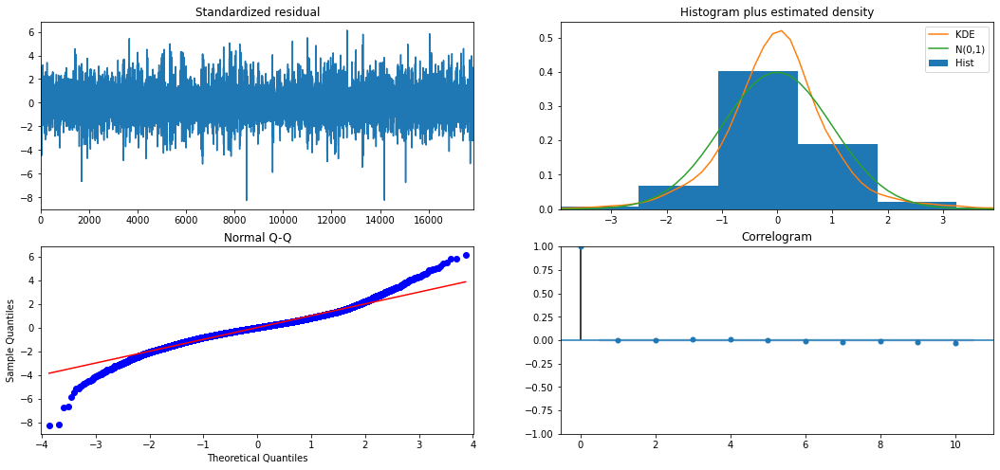

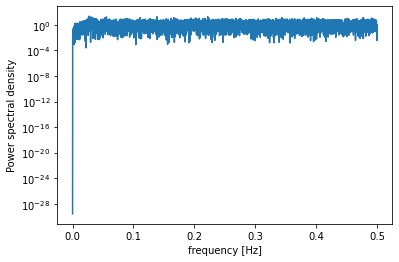

          freq        pow      delay
479   0.026739  22.436518  37.398747
473   0.026404  19.721888  37.873150
2485  0.138718  18.621756   7.208853
3976  0.221949  18.602379   4.505533
995   0.055543  17.822995  18.004020
541   0.030200  16.549974  33.112754
538   0.030032  14.972909  33.297398
561   0.031316  14.489429  31.932264
578   0.032265  14.211586  30.993080
522   0.029139  14.093857  34.318008
                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                17914
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood              -23020.966
Date:                                 Mon, 16 Nov 2020   AIC                          46055.933
Time:                                         23:23:49   BIC                          46110.471
Sample:                                              0   HQIC                         46073.873
                 

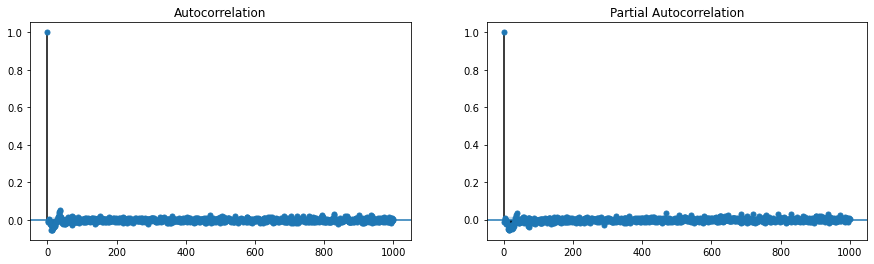

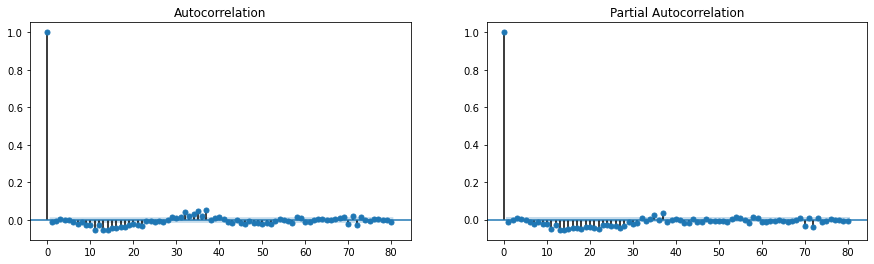

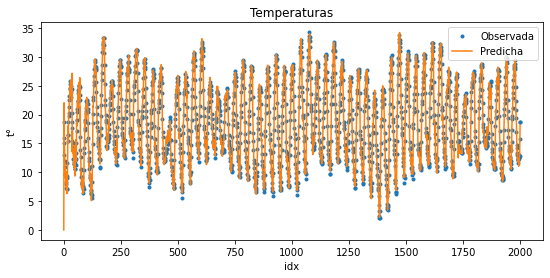

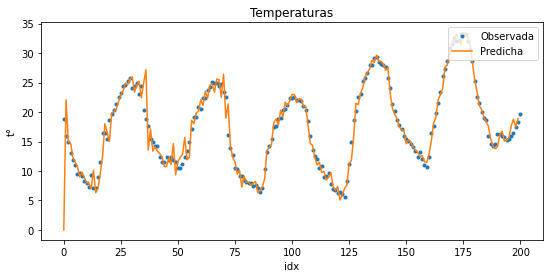

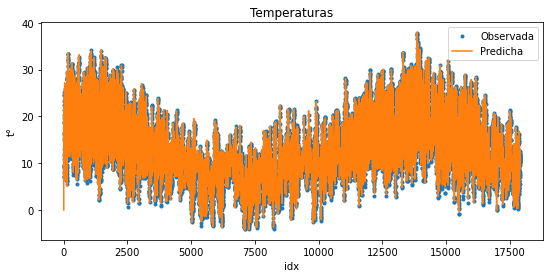

In [29]:
Res3=mysarima2(Y=Y_Ajuste,
         order=(1,1,1),
         seasonal_order=(2,0,2,60*12/Intervalo),
         restriccion={'ma.S.L18':0})

Construimos la validación: 

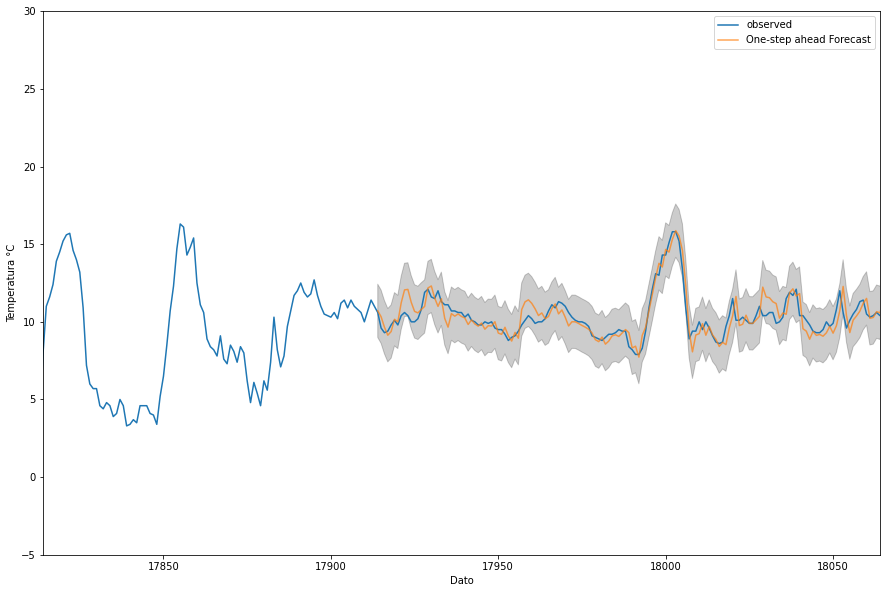

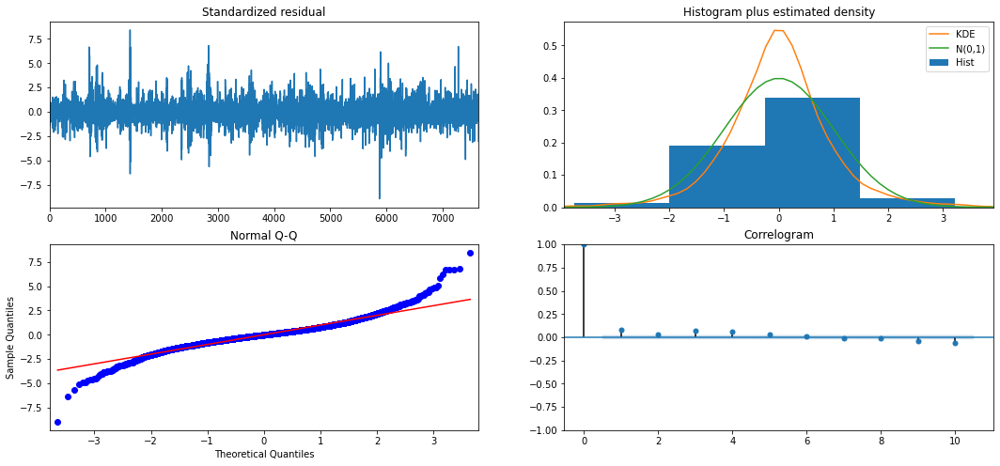

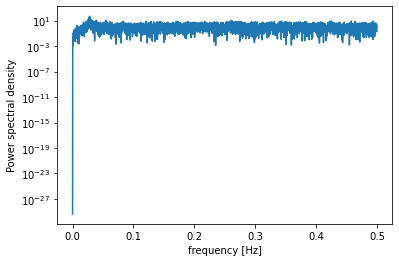

                                        SARIMAX Results                                        
Dep. Variable:                                      ts   No. Observations:                 7677
Model:             SARIMAX(1, 1, 1)x(2, 0, [1, 2], 18)   Log Likelihood               -9804.575
Date:                                 Mon, 16 Nov 2020   AIC                          19623.151
Time:                                         23:24:04   BIC                          19671.737
Sample:                                              0   HQIC                         19639.820
                                                - 7677                                         
Covariance Type:                                   opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept         5.305e-06      0.001      0.009      0.993  

(<statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper at 0x15a4bba70d0>,
 <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x15a4cf169d0>)

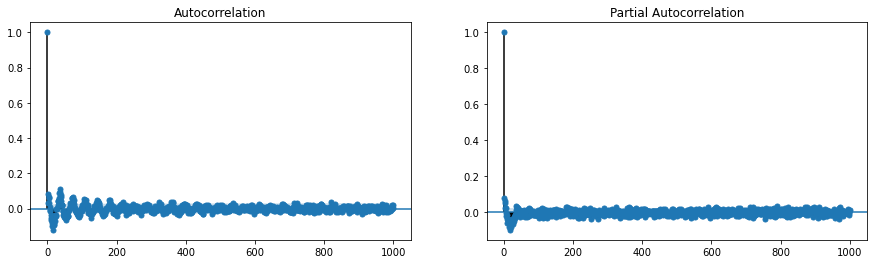

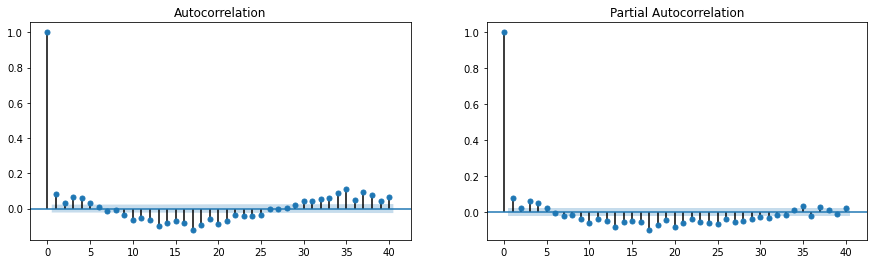

In [30]:
predecir_2(Res3,Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17914  10.6 -0.107574        False        False        False
17915   9.6 -0.728830        False        False        False
17916   9.3 -0.353422        False        False        False
17917   9.4  0.261367        False        False        False
17918   9.8  0.426704        False        False        False
...     ...       ...          ...          ...          ...
25586  31.9  0.102602        False        False        False
25587  31.8  0.279457        False        False        False
25588  31.8  0.711302        False        False        False
25589  30.9  0.405286        False        False        False
25590  26.4 -2.655287         True         True        False

[7677 rows x 5 columns]
Promedio Valor Absoluto Error: 0.6130195876473452
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    18.249316     3.621206     0.846685


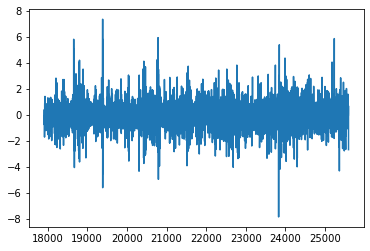

In [41]:
predecir_4(Res3,Y_Test,limite)

A continuación se realiza una prueba con un modelo de predictores AR durante todo un día sumados a un predictor MA del final del día anterior. 

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


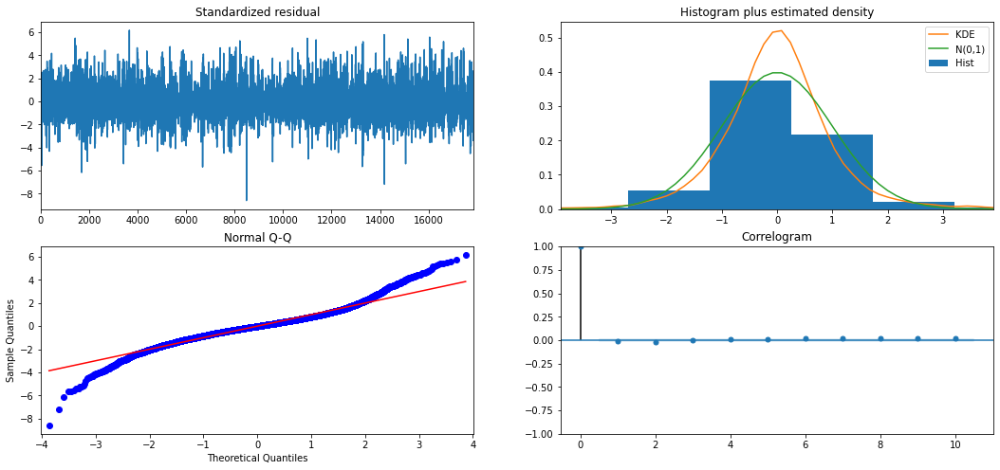

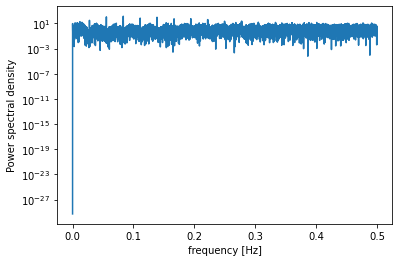

          freq         pow      delay
1492  0.083287  138.238113  12.006702
995   0.055543  109.156056  18.004020
2485  0.138718   94.704748   7.208853
2488  0.138886   74.027738   7.200161
1989  0.111030   69.904905   9.006536
1988  0.110975   62.465999   9.011066
2987  0.166741   53.764782   5.997322
3480  0.194261   52.543469   5.147701
3483  0.194429   47.867472   5.143267
1992  0.111198   42.415860   8.992972
                                       SARIMAX Results                                       
Dep. Variable:                                    ts   No. Observations:                17914
Model:             SARIMAX(36, 0, 0)x(0, 0, [1], 36)   Log Likelihood              -23725.922
Date:                               Mon, 16 Nov 2020   AIC                          47529.845
Time:                                       00:45:58   BIC                          47833.705
Sample:                                            0   HQIC                         47629.801
                  

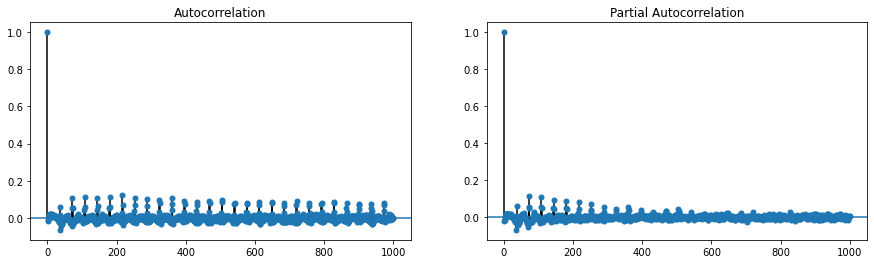

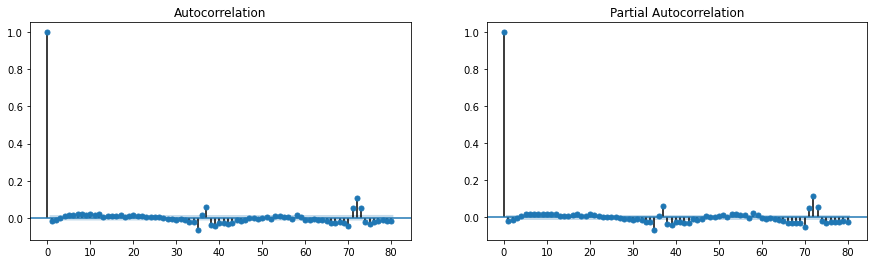

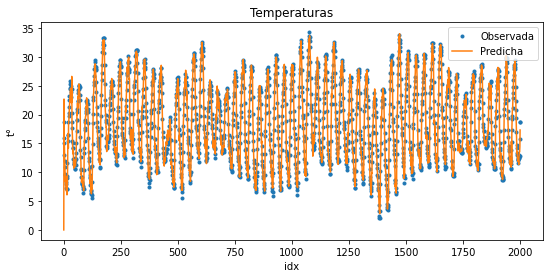

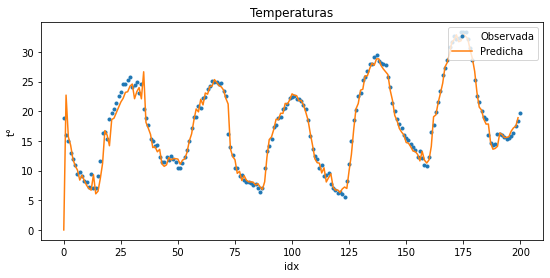

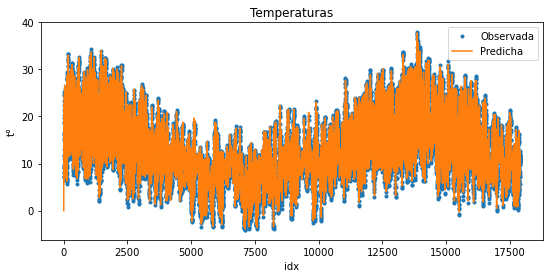

In [26]:
mysarima2(Y=Y_Ajuste,
         order=(60*24/Intervalo,0,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

Se retiran todas las componentes AR mayores a 3, la mayor parte de ellas eran no significativas, excepto por algunas de ordenes altos. 

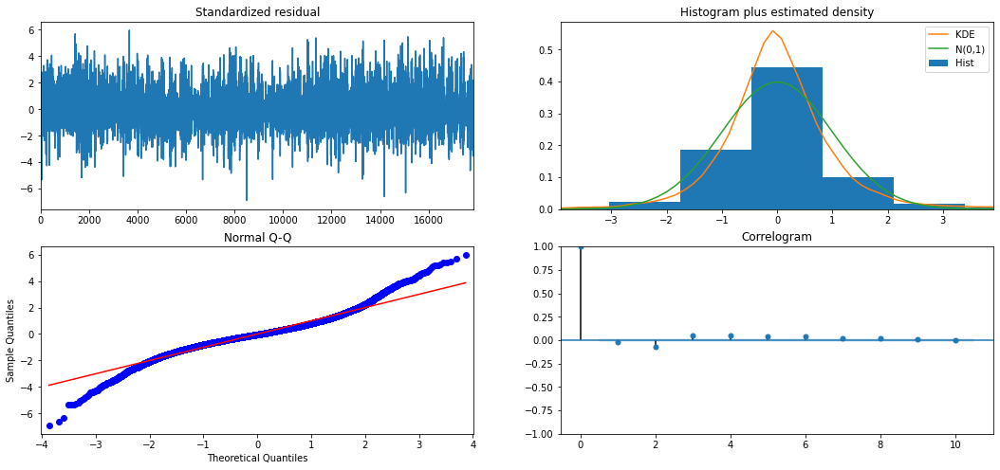

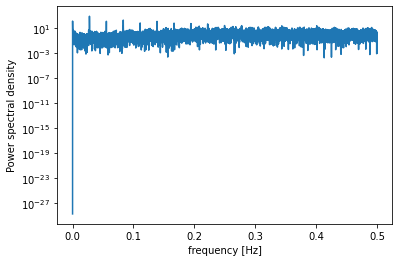

          freq         pow         delay
497   0.027744  818.739399     36.044266
1492  0.083287  196.657847     12.006702
496   0.027688  162.225217     36.116935
1     0.000056  136.961601  17914.000000
995   0.055543  126.669585     18.004020
499   0.027855  124.482025     35.899800
498   0.027799  123.616333     35.971888
2485  0.138718  122.635433      7.208853
2488  0.138886   97.280568      7.200161
1989  0.111030   68.660204      9.006536
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(3, 0, 0)x(0, 0, [1], 36)   Log Likelihood              -25296.368
Date:                              Mon, 16 Nov 2020   AIC                          50604.737
Time:                                      00:48:44   BIC                          50651.484
Sample:                                           0   HQIC                         5

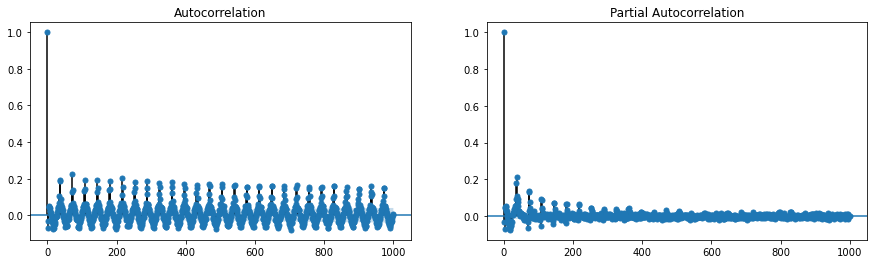

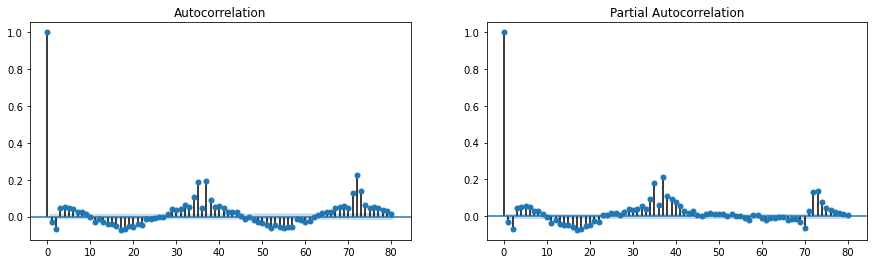

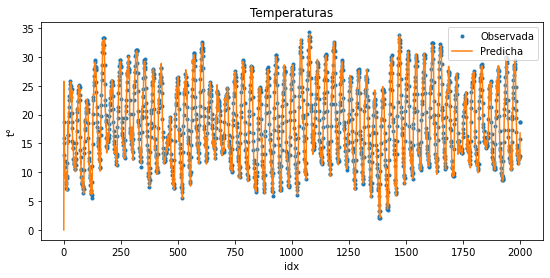

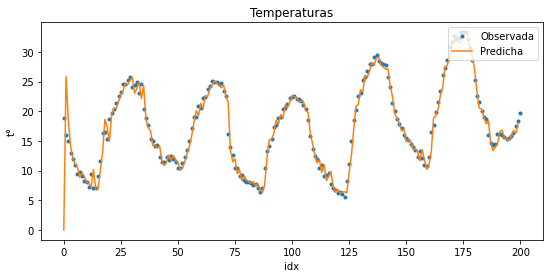

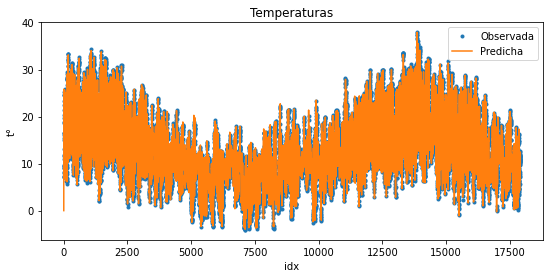

In [27]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

Se prueban distintas componentes de estacionalidad 24 horas.  

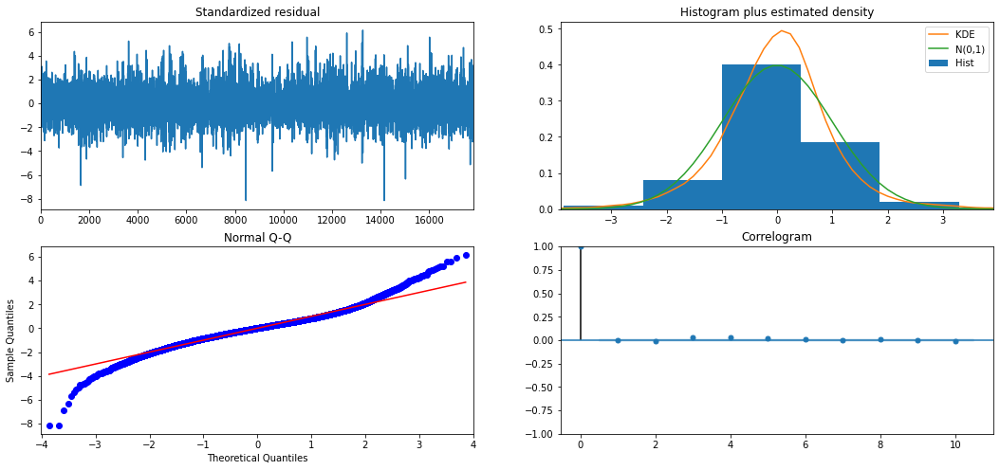

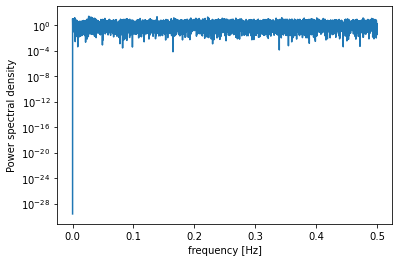

          freq        pow      delay
479   0.026739  23.594107  37.398747
473   0.026404  20.647142  37.873150
2485  0.138718  19.704863   7.208853
496   0.027688  18.854855  36.116935
3976  0.221949  17.764843   4.505533
541   0.030200  17.378626  33.112754
561   0.031316  14.874378  31.932264
578   0.032265  14.343165  30.993080
522   0.029139  14.322888  34.318008
538   0.030032  14.117141  33.297398
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(3, 0, 0)x(0, 1, [1], 36)   Log Likelihood              -22751.431
Date:                              Mon, 16 Nov 2020   AIC                          45514.862
Time:                                      01:23:20   BIC                          45561.597
Sample:                                           0   HQIC                         45530.237
                                   

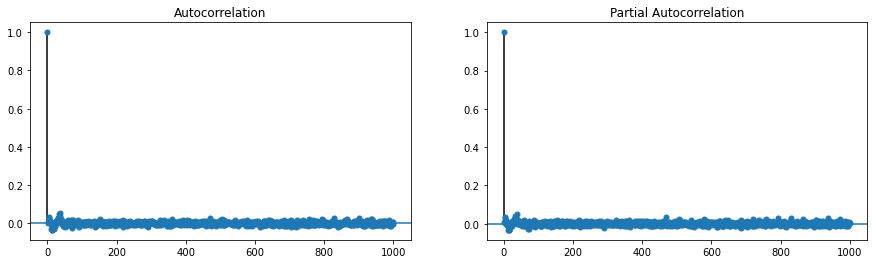

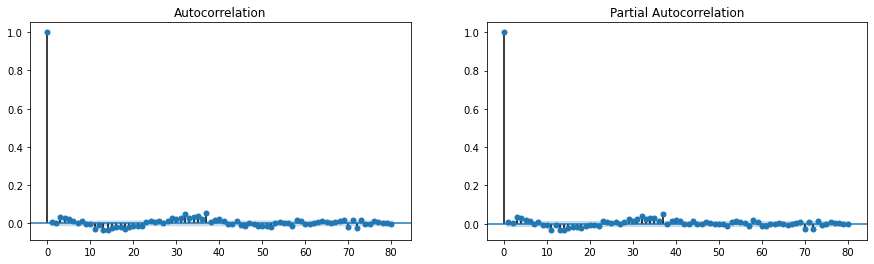

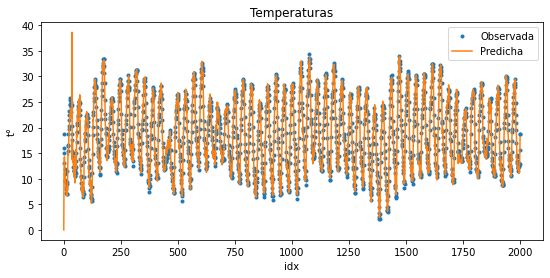

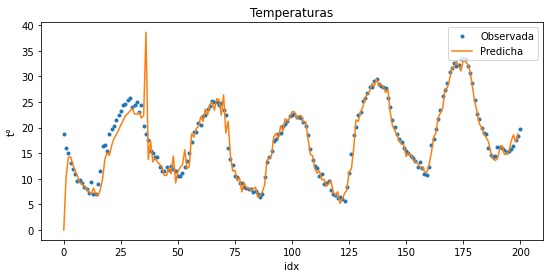

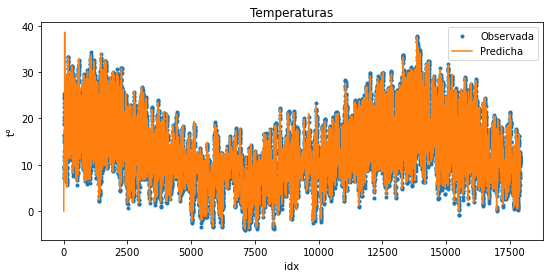

In [49]:
mysarima2(Y=Y_Ajuste,
         order=(3,0,0),
         seasonal_order=(0,1,1,60*24/Intervalo))

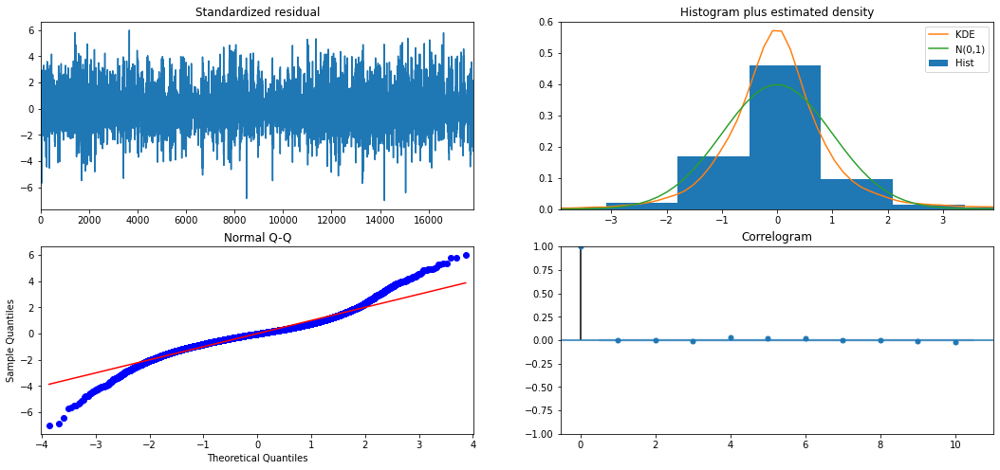

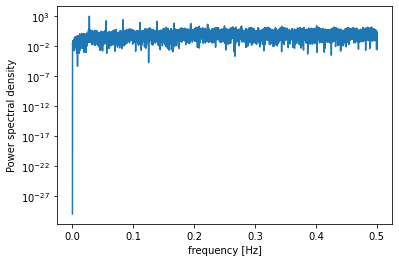

          freq         pow      delay
497   0.027744  982.437562  36.044266
1492  0.083287  255.203878  12.006702
496   0.027688  193.393750  36.116935
995   0.055543  170.631615  18.004020
498   0.027799  149.280194  35.971888
499   0.027855  148.970646  35.899800
2485  0.138718  143.469673   7.208853
2488  0.138886  113.001771   7.200161
1989  0.111030   85.170170   9.006536
1988  0.110975   75.005551   9.011066
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(3, 1, 0)x(0, 0, [1], 36)   Log Likelihood              -25579.514
Date:                              Mon, 16 Nov 2020   AIC                          51171.028
Time:                                      01:24:41   BIC                          51217.775
Sample:                                           0   HQIC                         51186.406
                        

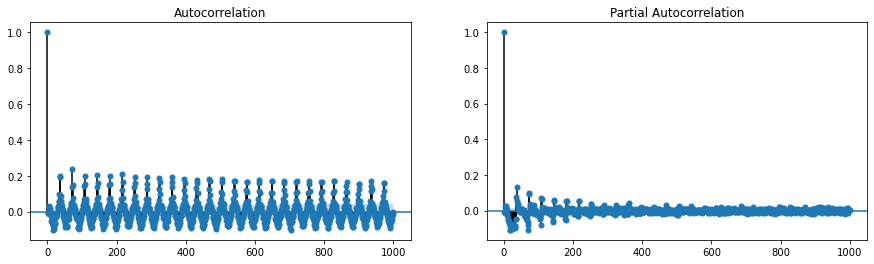

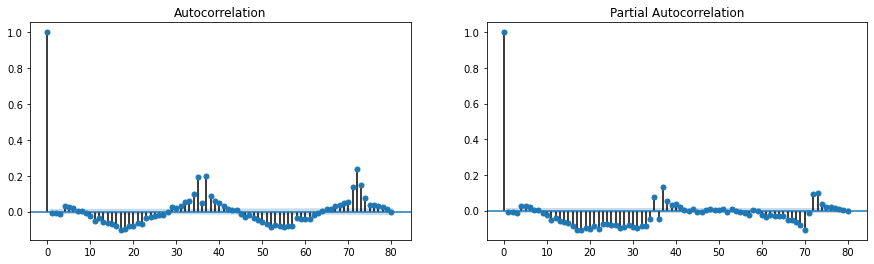

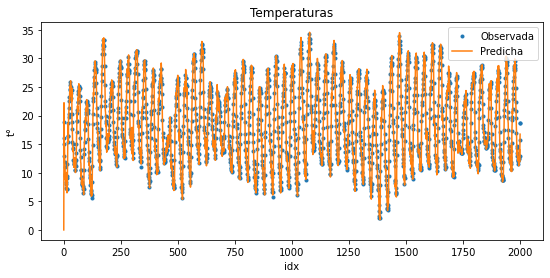

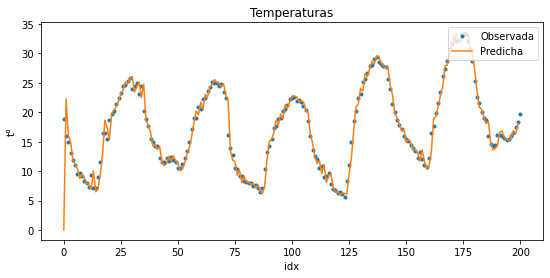

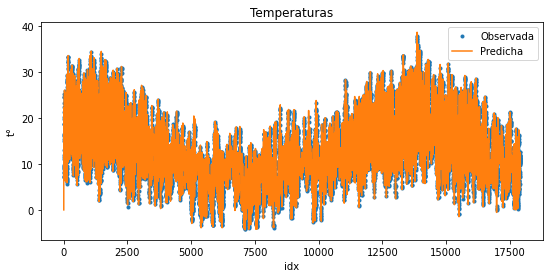

In [50]:
mysarima2(Y=Y_Ajuste,
         order=(3,1,0),
         seasonal_order=(0,0,1,60*24/Intervalo))

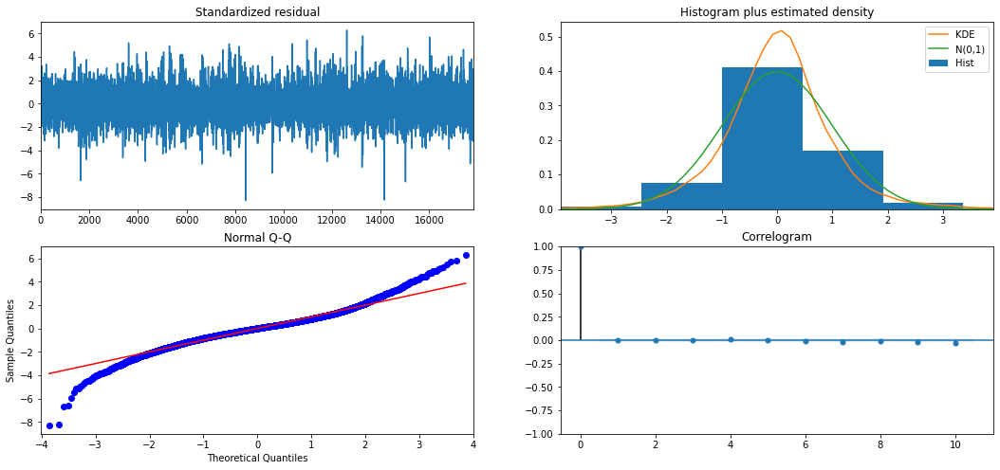

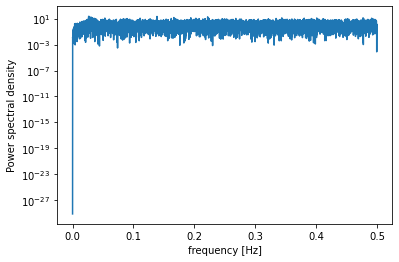

          freq        pow      delay
479   0.026739  24.327294  37.398747
2485  0.138718  22.482430   7.208853
473   0.026404  21.146823  37.873150
496   0.027688  20.870317  36.116935
3976  0.221949  19.462887   4.505533
541   0.030200  17.622257  33.112754
561   0.031316  15.548298  31.932264
2981  0.166406  15.367505   6.009393
538   0.030032  14.871141  33.297398
522   0.029139  14.680710  34.318008
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(3, 1, 0)x(0, 1, [1], 36)   Log Likelihood              -22987.119
Date:                              Mon, 16 Nov 2020   AIC                          45986.238
Time:                                      10:23:21   BIC                          46032.973
Sample:                                           0   HQIC                         46001.613
                                   

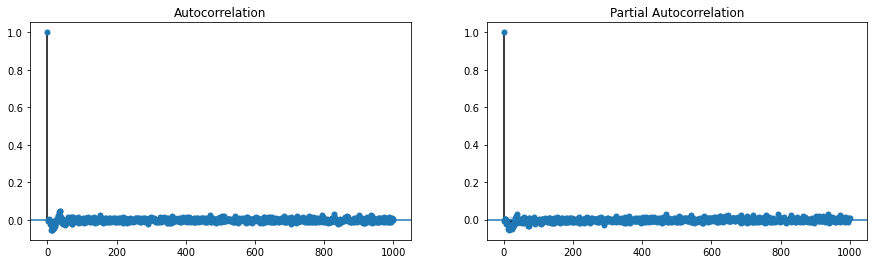

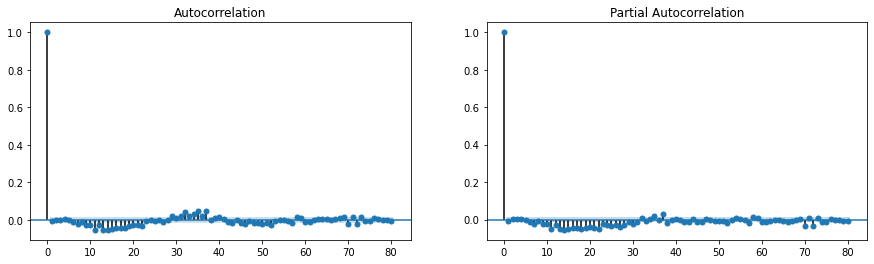

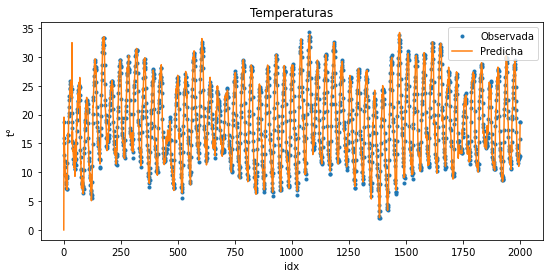

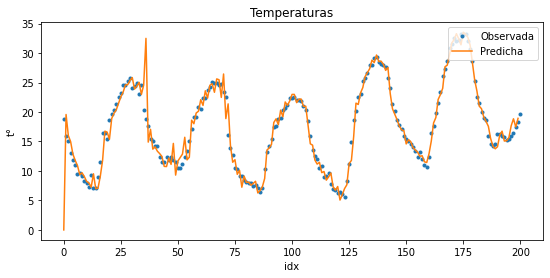

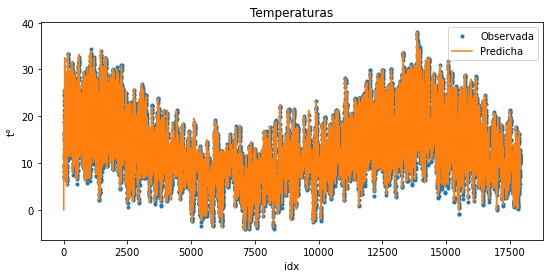

In [51]:
mysarima2(Y=Y_Ajuste,
         order=(3,1,0),
         seasonal_order=(0,1,1,60*24/Intervalo))

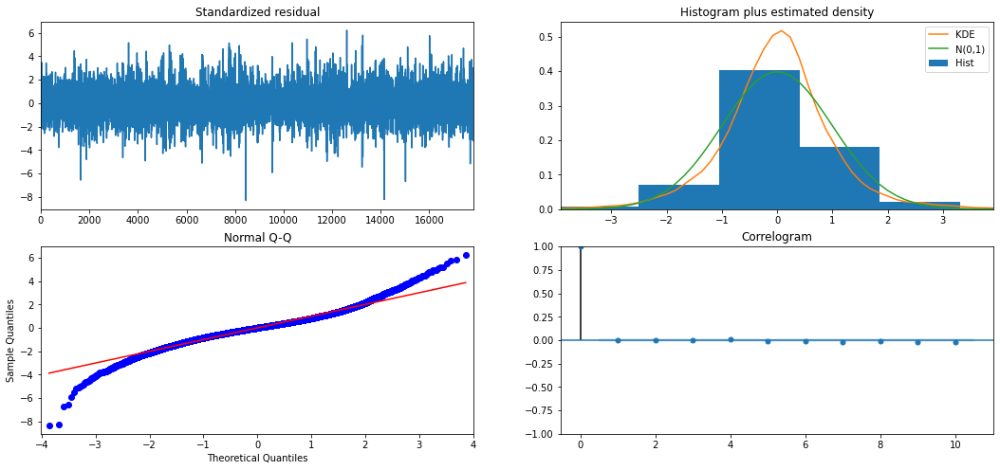

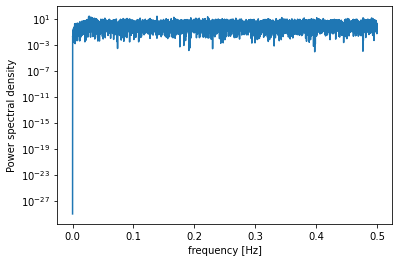

          freq        pow      delay
2485  0.138718  23.213220   7.208853
496   0.027688  22.513784  36.116935
479   0.026739  22.508874  37.398747
473   0.026404  19.439932  37.873150
3976  0.221949  19.021738   4.505533
541   0.030200  16.493046  33.112754
2981  0.166406  15.938921   6.009393
561   0.031316  14.572036  31.932264
6158  0.343753  14.354740   2.909061
578   0.032265  14.154087  30.993080
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(3, 1, 0)x(1, 1, [1], 36)   Log Likelihood              -22975.159
Date:                              Mon, 16 Nov 2020   AIC                          45964.319
Time:                                      10:31:39   BIC                          46018.842
Sample:                                           0   HQIC                         45982.257
                                   

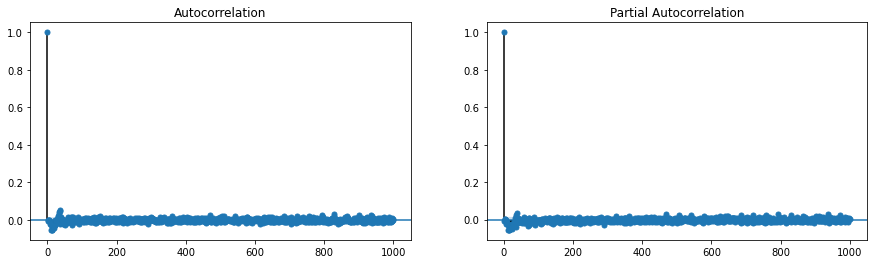

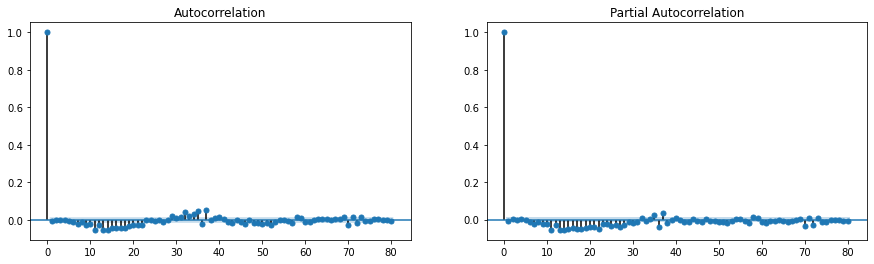

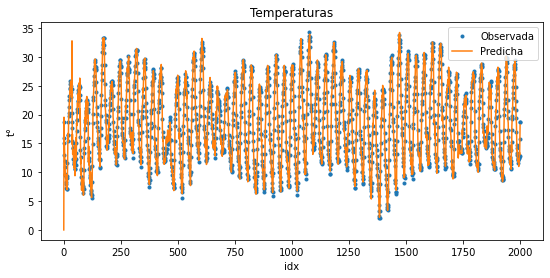

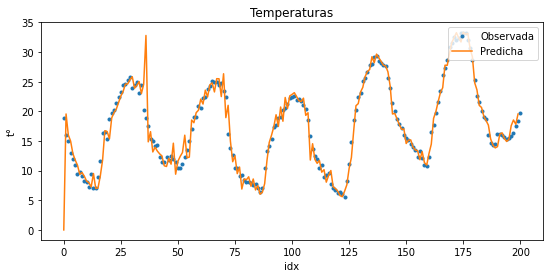

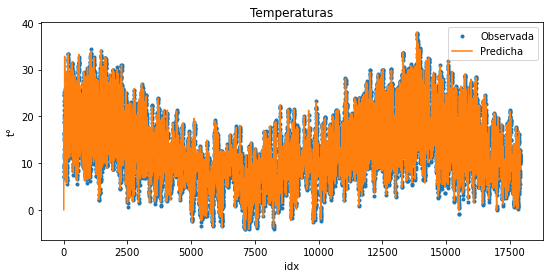

In [52]:
mysarima2(Y=Y_Ajuste,
         order=(3,1,0),
         seasonal_order=(1,1,1,60*24/Intervalo))

El mejor de los modelos vistos es el siguiente: 

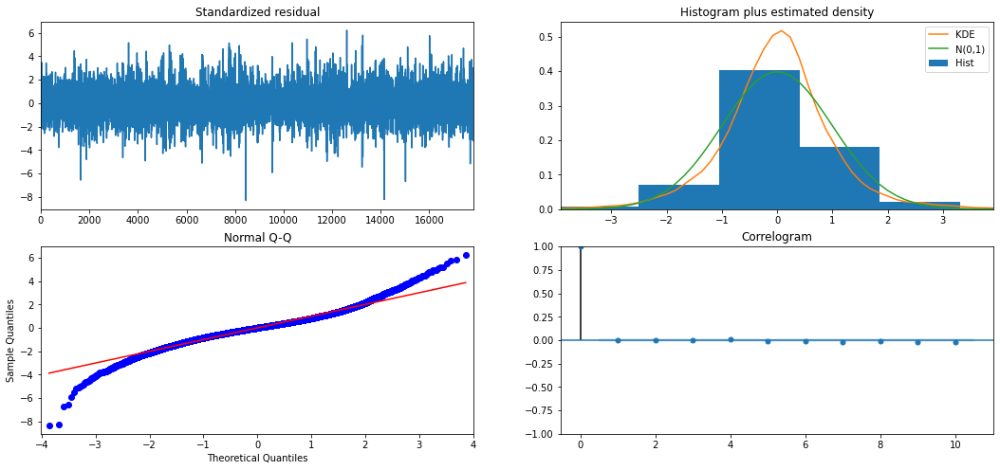

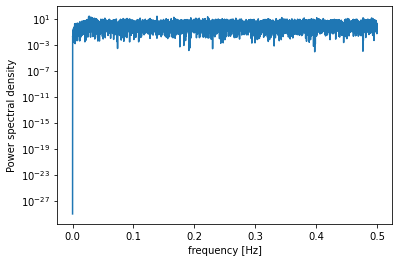

          freq        pow      delay
2485  0.138718  23.213220   7.208853
496   0.027688  22.513784  36.116935
479   0.026739  22.508874  37.398747
473   0.026404  19.439932  37.873150
3976  0.221949  19.021738   4.505533
541   0.030200  16.493046  33.112754
2981  0.166406  15.938921   6.009393
561   0.031316  14.572036  31.932264
6158  0.343753  14.354740   2.909061
578   0.032265  14.154087  30.993080
                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                17914
Model:             SARIMAX(3, 1, 0)x(1, 1, [1], 36)   Log Likelihood              -22975.159
Date:                              Mon, 16 Nov 2020   AIC                          45964.319
Time:                                      23:32:23   BIC                          46018.842
Sample:                                           0   HQIC                         45982.257
                                   

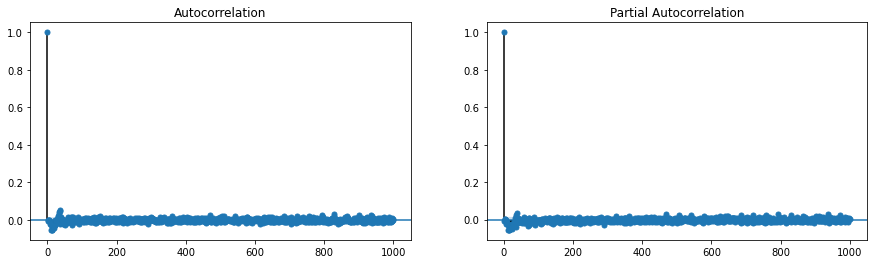

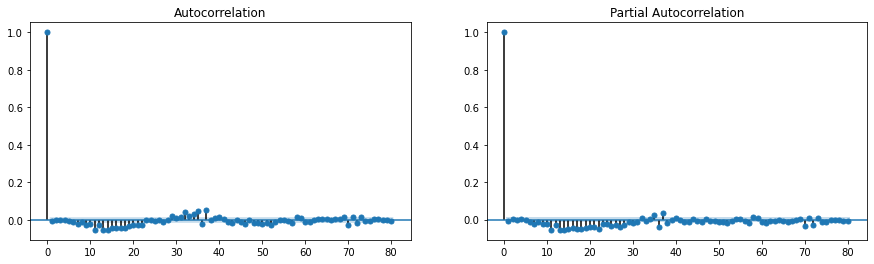

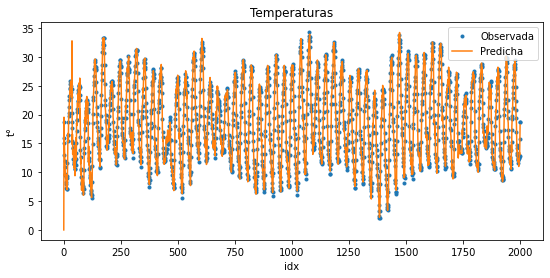

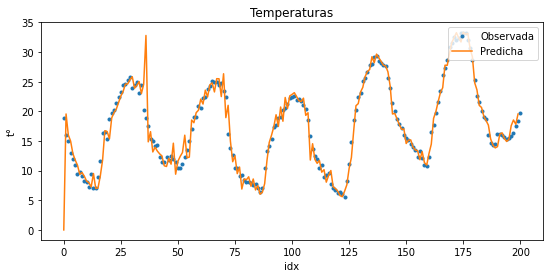

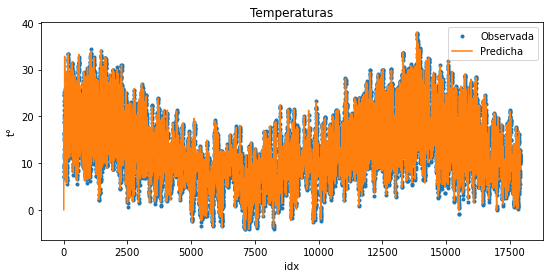

In [32]:
Res4=mysarima2(Y=Y_Ajuste,
         order=(3,1,0),
         seasonal_order=(1,1,1,60*24/Intervalo))

Validamos

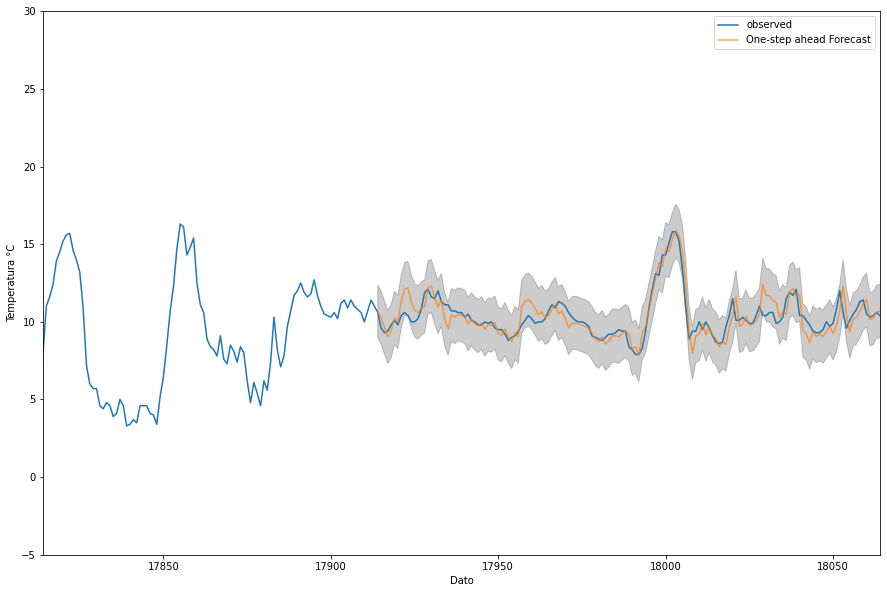

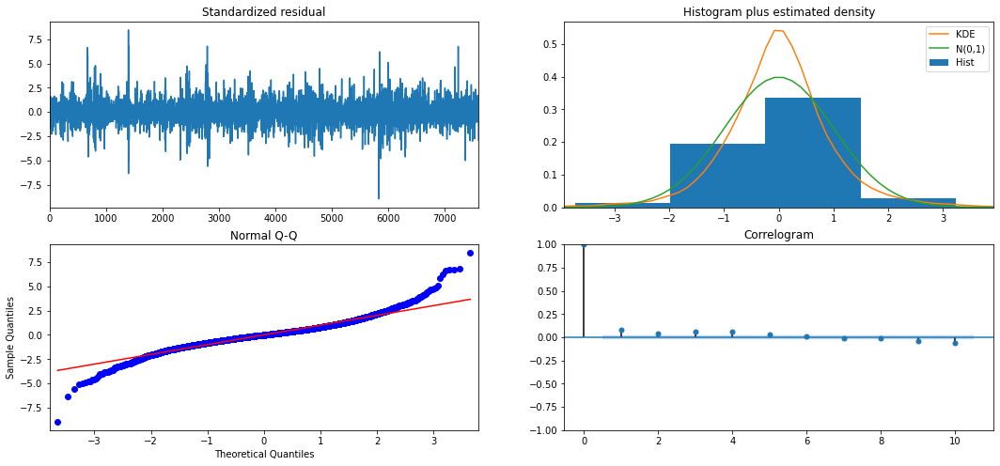

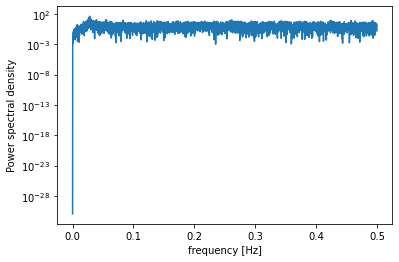

                                      SARIMAX Results                                       
Dep. Variable:                                   ts   No. Observations:                 7677
Model:             SARIMAX(3, 1, 0)x(1, 1, [1], 36)   Log Likelihood               -9806.126
Date:                              Mon, 16 Nov 2020   AIC                          19626.251
Time:                                      23:32:50   BIC                          19674.803
Sample:                                           0   HQIC                         19642.912
                                             - 7677                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   9.386e-06      0.001      0.016      0.987      -0.001       0.001
ar.L1          0.12

(<statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper at 0x15a4bdf4cd0>,
 <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x15a695d62b0>)

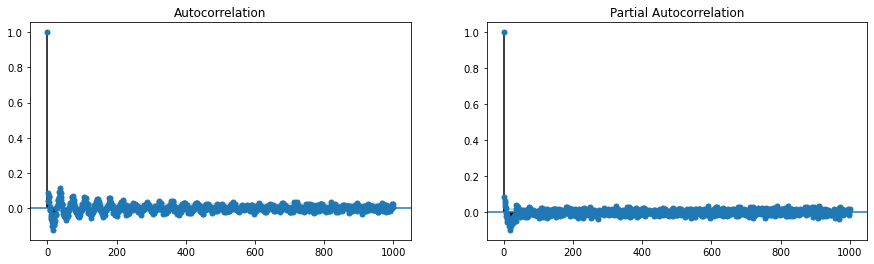

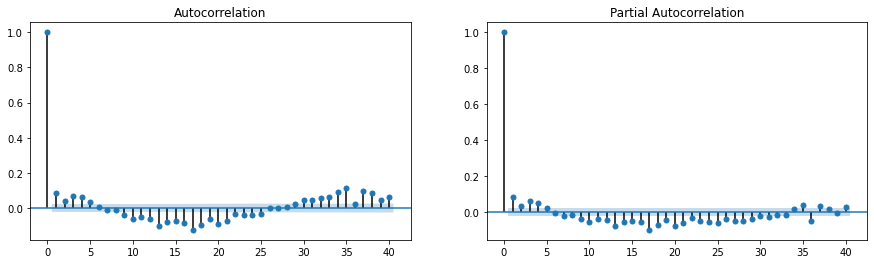

In [33]:
predecir_2(Res4,Y_Test,limite)

       temp     Resid  Más de 1 °C  Más de 2 °C  Más de 3 °C
17914  10.6 -0.043984        False        False        False
17915   9.6 -0.669428        False        False        False
17916   9.3 -0.334033        False        False        False
17917   9.4  0.373057        False        False        False
17918   9.8  0.400190        False        False        False
...     ...       ...          ...          ...          ...
25586  31.9  0.127073        False        False        False
25587  31.8  0.345090        False        False        False
25588  31.8  0.677489        False        False        False
25589  30.9  0.422081        False        False        False
25590  26.4 -2.548997         True         True        False

[7677 rows x 5 columns]
Promedio Valor Absoluto Error: 0.617981028769522
Porcentaje Error Mayor a 1, 2 y 3 °C: 
   Más de 1 °C  Más de 2 °C  Más de 3 °C
0    18.496809     3.660284     0.833659


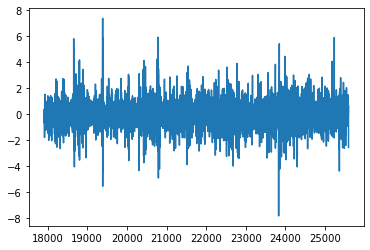

In [42]:
predecir_4(Res4,Y_Test,limite)